In [1]:
import simpy
import uuid
import pandas as pd
import numpy as np
import networkx as nx
import matplotlib.pyplot as plt

/opt/conda/lib/python3.7/site-packages/networkx/drawing/nx_pylab.py:579: MatplotlibDeprecationWarning: 
The iterable function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use np.iterable instead.
  if not cb.iterable(width):
/opt/conda/lib/python3.7/site-packages/networkx/drawing/nx_pylab.py:676: MatplotlibDeprecationWarning: 
The iterable function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use np.iterable instead.
  if cb.iterable(node_size):  # many node sizes


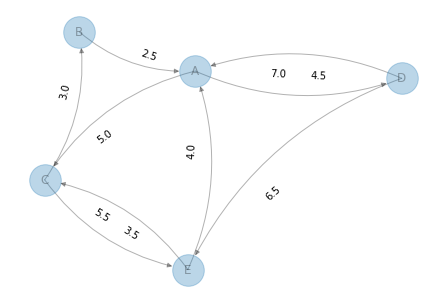

In [2]:
df = pd.DataFrame({'s': ['D', 'A', 'B', 'C', 'A', 'D', 'C', 'E', 'E'],
                   't': ['A', 'D', 'A', 'E', 'C', 'E', 'B', 'A', 'C'],
                   'w': [7., 4.5, 2.5, 3.5, 5., 6.5, 3., 4., 5.5]})
G = nx.from_pandas_edgelist(df, 's', 't', edge_attr=True, create_using=nx.DiGraph())
pos = nx.kamada_kawai_layout(G, weight='w')
labels = nx.get_edge_attributes(G, 'w')
nx.draw(G, pos, with_labels=True, node_size=1000, alpha=0.3, arrows=True, connectionstyle='arc3,rad=0.2')
nx.draw_networkx_edge_labels(G, pos, edge_labels=labels, label_pos=0.4)
plt.show()

In [3]:
class AppSite(object):
    """
    Application site, i.e. tool, in the FAB.
    This corresponds to a node in the graph.
    We model an application site using the simpy.Resource data type.
    We impose FOUP capacity constraints on the buffer and the application.
    Constraint: app_capacity <= buffer_capacity
    """
    def __init__(self, env, node, app_capacity, buffer_capacity, processing_time, buffering_time):
        self.node = node
        self.app = simpy.Resource(env, capacity=app_capacity)
        self.buffer = simpy.Resource(env, capacity=buffer_capacity)
        self.processing_time = processing_time
        self.buffering_time = buffering_time

In [4]:
class RailPath(object):
    """
    Path in the FAB's overhead rail system.
    This corresponds to an edge in the graph.
    We model a rail path using the simpy.Store data type.
    We use shared resource objects to model rail path traffic flow.
    """
    def __init__(self, env, edge, weight, traffic_function):
        self.edge = edge
        self.ohts = simpy.Store(env)
        self.weight = weight
        self.traffic_function = traffic_function
    
    def transfer_time(self):
        return self.weight + self.traffic_function(len(self.ohts.items))

In [5]:
class OHT(object):
    """
    Overhead hoist transfer in the FAB.
    OHTs carry FOUPs from one application site to another via rail paths in the FAB.
    """
    def __init__(self, env, location, uuid):
        self.env = env
        self.location = location
        self.uuid = uuid
        # PARKED, ENROUTE, ACQUIRING, DEPOSITING, NOT ASSIGNED, REMOVED
        self.status = 'NOT ASSIGNED'

    def can_take(self, rail_path):
        return self.status == 'PARKED' and self.location == rail_path.edge[0]

    def take(self, rail_path):
        if self.can_take(rail_path):
            self.status = 'ENROUTE'
            print('OHT %s taking RailPath %s at time %3.1f' %
                  (self.uuid, rail_path.edge, self.env.now))
            # compute transfer time before adding ourselves to the simpy.Store
            transfer_time = rail_path.transfer_time()
            rail_path.ohts.put(self)
            yield self.env.timeout(transfer_time)
            rail_path.ohts.get()
            self.status = 'PARKED'
            self.location = rail_path.edge[1]

In [6]:
class MHS(object):
    """
    Material handling system in the FAB.
    Includes AppSites, RailPaths, OHTs, and the graph G.
    """
    def __init__(self, app_sites, rail_paths, ohts, G):
        self.app_sites = app_sites
        self.rail_paths = rail_paths
        self.ohts = ohts
        self.G = G

In [7]:
class FOUP(object):
    """
    Front-opening unified pod containing semiconductor wafers.
    The goal of the FAB is to process wafers as efficiently as possible.
    Our FOUP representation uses an ordered list of application demands.
    """
    def __init__(self, env, mhs, delay_time, demands, location, uuid):
        self.env = env
        self.mhs = mhs
        self.delay_time = delay_time
        self.demands = demands
        self.location = location
        self.uuid = uuid
        # WAIT IN, TRANSFERRING, COMPLETED, APPLICATION, WAIT OUT
        self.status = 'WAIT IN'
        self.oht = None
        self.action = env.process(self.run())

    def at_destination(self):
        return len(self.demands) > 0 and self.demands[0] == self.location

    def can_use(self, app_site):
        return ((self.status == 'COMPLETED' or self.status == 'WAIT IN') and
                self.demands[0] == self.location == app_site.node)

    def use(self, app_site):
        if self.can_use(app_site):
            self.status = 'APPLICATION'
            with app_site.app.request() as req:
                yield req
                print('FOUP %s using AppSite %s at time %3.1f' %
                      (self.uuid, app_site.node, self.env.now))
                yield self.env.timeout(app_site.processing_time)
                # complete the leading demand
                self.demands = self.demands[1:]
                self.status = 'COMPLETED' if len(self.demands) > 0 else 'WAIT OUT'
            # this technically belongs in acquire, but the "training wheels"
            # of using it here make deadlock impossible
            app_site.buffer.release(self.buf_request)
            

    def can_acquire(self, app_site):
        return (self.oht is not None and
                self.status == 'COMPLETED' and self.oht.status == 'PARKED' and
                self.location == self.oht.location == app_site.node)

    def acquire(self, app_site):
        if self.can_acquire(app_site):
            self.oht.status = 'ACQUIRING'
            print('OHT %s acquiring FOUP %s at AppSite %s at time %3.1f' %
                  (self.oht.uuid, self.uuid, app_site.node, self.env.now))
            yield self.env.timeout(app_site.buffering_time)
            self.status = 'TRANSFERRING'
            self.oht.status = 'PARKED'
            # app_site.buffer.release(self.buf_request)

    def can_deposit(self, app_site):
        return (self.oht is not None and
                self.status == 'TRANSFERRING' and self.oht.status == 'PARKED' and
                self.location == self.oht.location == app_site.node)

    def deposit(self, app_site):
        if self.can_deposit(app_site):
            self.oht.status = 'DEPOSITING'
            self.buf_request = app_site.buffer.request()
            yield self.buf_request
            print('OHT %s depositing FOUP %s at AppSite %s at time %3.1f' %
                  (self.oht.uuid, self.uuid, app_site.node, self.env.now))
            yield self.env.timeout(app_site.buffering_time)
            # don't forget to unpair our OHT
            self.status = 'COMPLETED'
            self.oht.status = 'NOT ASSIGNED'
            self.mhs.ohts.put(self.oht)
            self.oht = None

    def run(self):
        # AMHS LOGIC HERE
        pass

In [8]:
class RandomFOUP(FOUP):
    """
    Randomly assigns available OHTs to FOUPs.
    """
    def run(self):
        sp = dict(nx.all_pairs_dijkstra_path(self.mhs.G, weight='w'))
        yield self.env.timeout(self.delay_time)
        # our FOUP starts out in self.location
        app = self.mhs.app_sites[self.location]
        self.buf_request = app.buffer.request()
        yield self.buf_request
        while True:
            app = self.mhs.app_sites[self.location]
            if self.at_destination():
                # case 1: our FOUP has reached its next checkpoint
                if self.can_use(app):
                    yield self.env.process(self.use(app))
                elif self.can_deposit(app):
                    yield self.env.process(self.deposit(app))
                else:
                    print('uh oh can\'t work at destination')
            elif self.status == 'COMPLETED':
                # case 2: our FOUP is waiting for an OHT
                if self.oht is None:
                    req = self.mhs.ohts.get()
                    self.oht = yield req
                    self.oht.status = 'PARKED'
                elif self.can_acquire(app):
                    yield self.env.process(self.acquire(app))
                else:
                    e = tuple(sp[self.oht.location][self.location][:2])
                    p = self.mhs.rail_paths[e]
                    if self.oht.can_take(p):
                        yield self.env.process(self.oht.take(p))
                    else:
                        print('uh oh can\'t take the path we want to %s' % str(e))
            elif self.status == 'TRANSFERRING':
                # case 3: our FOUP is in transit
                if self.oht is None:
                    print('uh oh transferring without an OHT')
                e = tuple(sp[self.oht.location][self.demands[0]][:2])
                p = self.mhs.rail_paths[e]
                if self.oht.can_take(p):
                    yield self.env.process(self.oht.take(p))
                    self.location = e[1]
                else:
                    print('uh oh can\'t take the path we want to %s' % str(e))
            elif self.status == 'WAIT OUT':
                break
            else:
                print('uh oh status is %s' % self.status)
        app.buffer.release(self.buf_request)

In [9]:
env = simpy.Environment()
app_sites = {
    'A': AppSite(env, 'A', 1,  10, 3.,  0.5),
    'B': AppSite(env, 'B', 10, 10, 10., 0.5),
    'C': AppSite(env, 'C', 5,  5,  5.,  0.5),
    'D': AppSite(env, 'D', 10, 10, 1.,  0.5),
    'E': AppSite(env, 'E', 10, 10, 1.,  0.5)
}
rail_paths = {}
for e in G.edges:
    weight = G[e[0]][e[1]]['w']
    # ReLU function for traffic flow
    traffic_function = lambda x : 0 if x < weight else x - weight
    rail_paths[e] = RailPath(env, e, weight, traffic_function)
ohts = simpy.Store(env)
ohts.put(OHT(env, 'E', str(uuid.uuid4())[:8]))
mhs = MHS(app_sites, rail_paths, ohts, G)
RandomFOUP(env, mhs, 0., ['D', 'B', 'E'], 'D', str(uuid.uuid4())[:8])
env.run()

FOUP 91447feb using AppSite D at time 0.0
OHT 633e088e taking RailPath ('E', 'A') at time 1.0
OHT 633e088e taking RailPath ('A', 'D') at time 5.0
OHT 633e088e acquiring FOUP 91447feb at AppSite D at time 9.5
OHT 633e088e taking RailPath ('D', 'E') at time 10.0
OHT 633e088e taking RailPath ('E', 'C') at time 16.5
OHT 633e088e taking RailPath ('C', 'B') at time 22.0
OHT 633e088e depositing FOUP 91447feb at AppSite B at time 25.0
FOUP 91447feb using AppSite B at time 25.5
OHT 633e088e acquiring FOUP 91447feb at AppSite B at time 35.5
OHT 633e088e taking RailPath ('B', 'A') at time 36.0
OHT 633e088e taking RailPath ('A', 'C') at time 38.5
OHT 633e088e taking RailPath ('C', 'E') at time 43.5
OHT 633e088e depositing FOUP 91447feb at AppSite E at time 47.0
FOUP 91447feb using AppSite E at time 47.5


In [10]:
env = simpy.Environment()
app_sites = {
    'A': AppSite(env, 'A', 1,  10, 3.,  0.5),
    'B': AppSite(env, 'B', 10, 10, 10., 0.5),
    'C': AppSite(env, 'C', 5,  5,  5.,  0.5),
    'D': AppSite(env, 'D', 10, 10, 1.,  0.5),
    'E': AppSite(env, 'E', 10, 10, 1.,  0.5)
}
rail_paths = {}
for e in G.edges:
    weight = G[e[0]][e[1]]['w']
    # ReLU function for traffic flow
    traffic_function = lambda x : 0 if x < weight else x - weight
    rail_paths[e] = RailPath(env, e, weight, traffic_function)
ohts = simpy.Store(env)
ohts.put(OHT(env, 'E', str(uuid.uuid4())[:8]))
mhs = MHS(app_sites, rail_paths, ohts, G)
RandomFOUP(env, mhs, 0., ['D', 'B', 'E'], 'D', str(uuid.uuid4())[:8])
RandomFOUP(env, mhs, 20., ['D', 'A', 'C', 'E'], 'D', str(uuid.uuid4())[:8])
env.run()

FOUP 44d30577 using AppSite D at time 0.0
OHT cb05c90a taking RailPath ('E', 'A') at time 1.0
OHT cb05c90a taking RailPath ('A', 'D') at time 5.0
OHT cb05c90a acquiring FOUP 44d30577 at AppSite D at time 9.5
OHT cb05c90a taking RailPath ('D', 'E') at time 10.0
OHT cb05c90a taking RailPath ('E', 'C') at time 16.5
FOUP 2cae640d using AppSite D at time 20.0
OHT cb05c90a taking RailPath ('C', 'B') at time 22.0
OHT cb05c90a depositing FOUP 44d30577 at AppSite B at time 25.0
OHT cb05c90a taking RailPath ('B', 'A') at time 25.5
FOUP 44d30577 using AppSite B at time 25.5
OHT cb05c90a taking RailPath ('A', 'D') at time 28.0
OHT cb05c90a acquiring FOUP 2cae640d at AppSite D at time 32.5
OHT cb05c90a taking RailPath ('D', 'A') at time 33.0
OHT cb05c90a depositing FOUP 2cae640d at AppSite A at time 40.0
OHT cb05c90a taking RailPath ('A', 'C') at time 40.5
FOUP 2cae640d using AppSite A at time 40.5
OHT cb05c90a taking RailPath ('C', 'B') at time 45.5
OHT cb05c90a acquiring FOUP 44d30577 at AppSite 

In [11]:
class GreedyFOUP(FOUP):
    """
    Greedy assigns available OHTs to FOUPs.
    """
    def run(self):
        sp = dict(nx.all_pairs_dijkstra_path(self.mhs.G, weight='w'))
        spl = dict(nx.all_pairs_dijkstra_path_length(self.mhs.G, weight='w'))
        yield self.env.timeout(self.delay_time)
        # our FOUP starts out in self.location
        app = self.mhs.app_sites[self.location]
        self.buf_request = app.buffer.request()
        yield self.buf_request
        while True:
            app = self.mhs.app_sites[self.location]
            if self.at_destination():
                # case 1: our FOUP has reached its next checkpoint
                if self.can_use(app):
                    yield self.env.process(self.use(app))
                elif self.can_deposit(app):
                    yield self.env.process(self.deposit(app))
                else:
                    print('uh oh can\'t work at destination')
            elif self.status == 'COMPLETED':
                # case 2: our FOUP is waiting for an OHT
                if self.oht is None:
                    if len(self.mhs.ohts.items) <= 1:
                        req = self.mhs.ohts.get()
                    else:
                        min_dist = np.inf
                        min_oht = None
                        for oht in self.mhs.ohts.items:
                            dist = spl[oht.location][self.location]
                            if dist < min_dist:
                                min_dist = dist
                                min_oht = oht
                        req = self.mhs.ohts.get(lambda x : x.uuid == min_oht.uuid)
                    self.oht = yield req
                    self.oht.status = 'PARKED'
                elif self.can_acquire(app):
                    yield self.env.process(self.acquire(app))
                else:
                    e = tuple(sp[self.oht.location][self.location][:2])
                    p = self.mhs.rail_paths[e]
                    if self.oht.can_take(p):
                        yield self.env.process(self.oht.take(p))
                    else:
                        print('uh oh can\'t take the path we want to %s' % str(e))
            elif self.status == 'TRANSFERRING':
                # case 3: our FOUP is in transit
                if self.oht is None:
                    print('uh oh transferring without an OHT')
                e = tuple(sp[self.oht.location][self.demands[0]][:2])
                p = self.mhs.rail_paths[e]
                if self.oht.can_take(p):
                    yield self.env.process(self.oht.take(p))
                    self.location = e[1]
                else:
                    print('uh oh can\'t take the path we want to %s' % str(e))
            elif self.status == 'WAIT OUT':
                break
            else:
                print('uh oh status is %s' % self.status)
        app.buffer.release(self.buf_request)

In [12]:
N = 1000
λ = 0.5
foup_spawn = np.random.random(size=(N,2)) < λ

In [13]:
env = simpy.Environment()
app_sites = {
    'A': AppSite(env, 'A', 1,   10,  3.,  0.5),
    'B': AppSite(env, 'B', 10,  10,  10., 0.5),
    'C': AppSite(env, 'C', 5,   5,   5.,  0.5),
    'D': AppSite(env, 'D', 2*N, 2*N, 1.,  0.5),
    'E': AppSite(env, 'E', 2*N, 2*N, 1.,  0.5)
}
rail_paths = {}
for e in G.edges:
    weight = G[e[0]][e[1]]['w']
    # ReLU function for traffic flow
    traffic_function = lambda x : 0 if x < weight else x - weight
    rail_paths[e] = RailPath(env, e, weight, traffic_function)
ohts = simpy.Store(env)
for _ in range(10):
    ohts.put(OHT(env, 'A', str(uuid.uuid4())))
    ohts.put(OHT(env, 'B', str(uuid.uuid4())))
    ohts.put(OHT(env, 'C', str(uuid.uuid4())))
    ohts.put(OHT(env, 'D', str(uuid.uuid4())))
    ohts.put(OHT(env, 'E', str(uuid.uuid4())))
mhs = MHS(app_sites, rail_paths, ohts, G)
for i in range(N):
    if foup_spawn[i][0]:
        RandomFOUP(env, mhs, i, ['D', 'B', 'E'], 'D', str(uuid.uuid4()))
    if foup_spawn[i][1]:
        RandomFOUP(env, mhs, i, ['D', 'A', 'C', 'E'], 'D', str(uuid.uuid4()))
env.run()

FOUP 84fe2b83-e85f-43eb-94de-3f35dcb5ec21 using AppSite D at time 0.0
FOUP 0231d5f1-f299-4336-8c15-c244dbf15f3e using AppSite D at time 0.0
FOUP 46b8ee37-ce69-4521-b95d-606f03094b27 using AppSite D at time 1.0
FOUP 38ba3d41-9500-4dbd-afc8-44b34b870026 using AppSite D at time 1.0
OHT f458bfb3-ed3f-4120-8015-5950c0be905c taking RailPath ('A', 'D') at time 1.0
OHT 38bb86b3-f314-4919-9903-a65367e5274e taking RailPath ('B', 'A') at time 1.0
FOUP 58ccc35f-5bd8-4e0a-b4ad-d5dba6251909 using AppSite D at time 2.0
OHT e71d7cc1-9b39-4c77-b25a-5015386eba54 taking RailPath ('C', 'B') at time 2.0
OHT 75ae3158-ff52-447f-9e38-eb1284127621 acquiring FOUP 38ba3d41-9500-4dbd-afc8-44b34b870026 at AppSite D at time 2.0
OHT 75ae3158-ff52-447f-9e38-eb1284127621 taking RailPath ('D', 'A') at time 2.5
FOUP f3ecea3e-b6e1-436d-9105-ae50ed88febb using AppSite D at time 3.0
FOUP 4b0f43db-bcb9-4dcf-8e4a-c787d3407464 using AppSite D at time 3.0
OHT c5f3a3e2-ab34-4d50-bb01-e7092680a8dc taking RailPath ('E', 'A') at t

OHT 6bcec032-6933-40e6-a655-7e2f628ba9b6 depositing FOUP 420410e7-d044-442a-b977-ee7905652f35 at AppSite B at time 73.0
FOUP 3654a815-19ee-4e63-acf0-ce30aef5cf10 using AppSite A at time 73.0
OHT ec172be9-c767-482c-97f2-c6ac376ffdc3 depositing FOUP c45ebd91-b860-4ace-8b7a-66b7ec436bc4 at AppSite A at time 73.0
OHT af2b3844-07c0-4c4f-9b4f-bb6fe810dfac taking RailPath ('E', 'A') at time 73.0
FOUP 59af93c2-463b-41eb-b1ab-67e6b7f50532 using AppSite E at time 73.0
OHT f458bfb3-ed3f-4120-8015-5950c0be905c taking RailPath ('E', 'C') at time 73.5
OHT c2f6d82d-cd8d-41cf-ab18-34f72b392b3a taking RailPath ('C', 'B') at time 73.5
OHT 838ed78a-13cd-45a9-9810-da903fa863ff acquiring FOUP 325b1550-341d-4694-84eb-958d202bd621 at AppSite D at time 73.5
OHT 81bc3db2-9a9f-4165-84da-df241c384442 taking RailPath ('A', 'C') at time 73.5
OHT 80ae55b2-74e3-45dc-af30-ee7cc03f6fdf taking RailPath ('C', 'E') at time 73.5
OHT a77513cf-28f7-43c9-a3bd-0034bbf5ed2c taking RailPath ('B', 'A') at time 73.5
OHT d6f64545-

OHT 75ae3158-ff52-447f-9e38-eb1284127621 taking RailPath ('B', 'A') at time 146.5
FOUP 86aa3d6b-9e66-4224-8371-0dde08a014d4 using AppSite E at time 146.5
OHT 5e1bab76-5509-42c5-b8a2-0fea9c84266b acquiring FOUP 0aec82ff-8c24-45a8-a9a7-9c6b1303f94f at AppSite D at time 147.0
OHT 674caa74-0f8f-4830-8d88-adeabf15d0da taking RailPath ('D', 'A') at time 147.0
FOUP a69551d6-5734-4f2f-92fc-4c9d6946f0ef using AppSite D at time 147.0
OHT aa2b053c-9aa2-42a4-a4ce-af2c7788305e taking RailPath ('E', 'C') at time 147.0
OHT 58b15e96-b342-439f-acdf-fd92e749806b depositing FOUP 1d3290c7-44ed-4e5b-8d5e-9f9023c22316 at AppSite C at time 147.0
OHT 38c144e4-175a-47a2-8aed-0099f7ef3b43 acquiring FOUP 018d487a-d5fb-4048-97e8-99a3dcf97ead at AppSite D at time 147.5
OHT 6bcec032-6933-40e6-a655-7e2f628ba9b6 acquiring FOUP 2bca51a9-a427-46cb-8b50-a304fcaa7041 at AppSite B at time 147.5
OHT c02abc6a-f0d4-4f72-a26d-da98eed9f48a acquiring FOUP 4a4c957d-7502-40f4-8dd1-708fc846f1f3 at AppSite A at time 147.5
OHT ca2da

OHT 17b756b4-638d-4fd7-bb1d-5c8143d1b654 taking RailPath ('A', 'C') at time 197.0
OHT 2f28a586-3239-465d-b390-e43e7143da20 taking RailPath ('A', 'C') at time 197.0
FOUP 654b8746-4ce8-473f-9ea3-9946f54dde50 using AppSite D at time 197.0
FOUP fc4d21b9-dddb-4ab7-bc91-ed74ffe82c97 using AppSite D at time 197.0
OHT 10522530-e233-4dd8-9737-cf8753d2f8a0 depositing FOUP abe4294e-2fc0-4652-8ce1-05b31c4d7a0d at AppSite E at time 197.0
OHT 9290b9c0-ca9c-4d82-83c5-f9c4a5a820b5 taking RailPath ('C', 'B') at time 197.0
OHT 9d0f989a-6e6e-4599-8e27-c67037b8efe3 taking RailPath ('B', 'A') at time 197.0
FOUP 549104b7-94f9-47ad-a0bd-fe04b85d205b using AppSite C at time 197.0
FOUP 224f8ade-17d8-420c-8539-70bedfc12cbf using AppSite B at time 197.0
OHT 56d023e2-a5a7-4e5e-bb59-4b1087a8f04b taking RailPath ('C', 'B') at time 197.5
OHT ec172be9-c767-482c-97f2-c6ac376ffdc3 acquiring FOUP 04a6ba3c-2b92-453a-9c0a-ad6ef6358bd8 at AppSite D at time 197.5
OHT e71d7cc1-9b39-4c77-b25a-5015386eba54 taking RailPath ('A'

OHT ccb400b3-e6d0-47d7-8731-b1428c3ea7d1 acquiring FOUP 40f2dd36-4bde-47d7-986f-29c7d82a9412 at AppSite D at time 258.0
OHT f77dbf68-c438-41bb-b6b8-7c58a04b9565 taking RailPath ('C', 'E') at time 258.0
FOUP 602e5548-d01a-45a3-8b7e-4958613cc238 using AppSite D at time 258.0
FOUP 54cffe62-b0e4-425d-ae2b-6115229299c4 using AppSite D at time 258.0
OHT f458bfb3-ed3f-4120-8015-5950c0be905c depositing FOUP fa0ac0db-6c6f-4910-ba29-e12f745f6d7e at AppSite E at time 258.0
OHT 75ae3158-ff52-447f-9e38-eb1284127621 taking RailPath ('C', 'E') at time 258.5
OHT 2d81a72f-3caf-4436-97a4-09621f445179 taking RailPath ('A', 'D') at time 258.5
OHT ccb400b3-e6d0-47d7-8731-b1428c3ea7d1 taking RailPath ('D', 'E') at time 258.5
OHT ca2da4cd-04c8-425c-a202-56bf54ba1b87 depositing FOUP f9fe0f83-d0eb-45d2-a249-e922c63a8948 at AppSite E at time 258.5
OHT f458bfb3-ed3f-4120-8015-5950c0be905c taking RailPath ('E', 'A') at time 258.5
FOUP fa0ac0db-6c6f-4910-ba29-e12f745f6d7e using AppSite E at time 258.5
OHT 2f28a586

OHT 38bb86b3-f314-4919-9903-a65367e5274e taking RailPath ('D', 'E') at time 317.0
OHT c5f3a3e2-ab34-4d50-bb01-e7092680a8dc depositing FOUP 0906d60d-5271-4e06-83a2-26ccad8ce0a4 at AppSite C at time 317.0
OHT 10522530-e233-4dd8-9737-cf8753d2f8a0 depositing FOUP 1aa5a67e-577e-4bd5-b0aa-5ea8f6121871 at AppSite E at time 317.0
OHT c5f3a3e2-ab34-4d50-bb01-e7092680a8dc taking RailPath ('C', 'B') at time 317.5
FOUP 0906d60d-5271-4e06-83a2-26ccad8ce0a4 using AppSite C at time 317.5
OHT 10522530-e233-4dd8-9737-cf8753d2f8a0 taking RailPath ('E', 'C') at time 317.5
FOUP 1aa5a67e-577e-4bd5-b0aa-5ea8f6121871 using AppSite E at time 317.5
OHT 17b756b4-638d-4fd7-bb1d-5c8143d1b654 taking RailPath ('E', 'C') at time 318.0
FOUP 81f072ce-b649-4cbc-b581-c843817cd3ce using AppSite D at time 318.0
FOUP bcb9c6ad-0b4e-4e92-bf4b-038b42807a6d using AppSite D at time 318.0
OHT 81bc3db2-9a9f-4165-84da-df241c384442 taking RailPath ('C', 'E') at time 318.5
OHT c2f6d82d-cd8d-41cf-ab18-34f72b392b3a acquiring FOUP 8595

OHT 76885726-2daa-4edf-beab-6bf0e3ca1d76 taking RailPath ('C', 'B') at time 424.0
OHT 17b756b4-638d-4fd7-bb1d-5c8143d1b654 taking RailPath ('C', 'E') at time 424.0
OHT c2f6d82d-cd8d-41cf-ab18-34f72b392b3a taking RailPath ('C', 'E') at time 424.0
OHT d6f64545-8489-47e1-9829-2f1fb493c12f taking RailPath ('A', 'D') at time 424.0
OHT 2f28a586-3239-465d-b390-e43e7143da20 taking RailPath ('A', 'C') at time 424.0
OHT ca2da4cd-04c8-425c-a202-56bf54ba1b87 taking RailPath ('C', 'E') at time 424.0
OHT f77dbf68-c438-41bb-b6b8-7c58a04b9565 taking RailPath ('D', 'E') at time 424.0
FOUP afde1d5f-a11c-40de-b63d-f360b38eb037 using AppSite D at time 424.0
FOUP 7de1f5d1-8a8c-4b70-afa5-a9452a6de778 using AppSite D at time 424.0
OHT f458bfb3-ed3f-4120-8015-5950c0be905c depositing FOUP 14a1f334-1085-4969-9457-beb74822d59b at AppSite C at time 424.0
FOUP b615846e-8a74-4fae-9598-57cce6aa075e using AppSite A at time 424.0
OHT e5c1554c-d5b5-45a4-8cd7-b3ed07eabe82 depositing FOUP d6ea8d4a-27f5-41e1-8c43-fbfe3c75

OHT 38bb86b3-f314-4919-9903-a65367e5274e taking RailPath ('B', 'A') at time 482.5
FOUP 3927a8a8-ae32-465d-9e58-aeb46a96dccb using AppSite B at time 482.5
OHT ee15568d-28bc-4e55-b765-b139474fae78 taking RailPath ('C', 'B') at time 483.0
OHT 9d0f989a-6e6e-4599-8e27-c67037b8efe3 taking RailPath ('C', 'E') at time 483.5
OHT 838ed78a-13cd-45a9-9810-da903fa863ff depositing FOUP 53181314-0567-49f7-b23a-e9cd5b44733f at AppSite E at time 483.5
OHT 81bc3db2-9a9f-4165-84da-df241c384442 taking RailPath ('E', 'C') at time 484.0
OHT 94f9a1ec-90aa-4fa5-893a-ded4a9a97d97 acquiring FOUP 61f3be2b-ed04-4818-9a6a-2965024a3130 at AppSite D at time 484.0
OHT 30be95ca-ee67-4c82-86eb-8b47426ce2ff depositing FOUP 8227fe6a-a2b2-4f6a-873f-0a05b68afc09 at AppSite C at time 484.0
FOUP 4cfccb8d-4208-4dfe-9f66-b8f600377583 using AppSite A at time 484.0
OHT 03a21a79-f3ad-4676-a0d8-8c59baed5971 depositing FOUP dcd7d1d8-1c0c-4366-8588-feda8362a1bf at AppSite A at time 484.0
OHT 838ed78a-13cd-45a9-9810-da903fa863ff taki

OHT 58b15e96-b342-439f-acdf-fd92e749806b taking RailPath ('B', 'A') at time 543.5
FOUP 03534630-9cc3-4535-a2ee-90f2836573b3 using AppSite B at time 543.5
FOUP 1dadf134-3c68-4e2a-af0c-d2e2138c3b7d using AppSite D at time 544.0
FOUP 8cf48197-d017-4ae7-9cca-cc3ad5c881c8 using AppSite D at time 544.0
OHT 0ac459a7-418f-42cb-bd0e-25f245209438 depositing FOUP b6f636a1-9d09-4fa5-acda-ebc98e412542 at AppSite C at time 544.0
FOUP 5af3d585-2898-434f-b668-15e4acc0cf2c using AppSite A at time 544.0
OHT ccb400b3-e6d0-47d7-8731-b1428c3ea7d1 depositing FOUP d410aa92-3f26-438d-9916-12051270b186 at AppSite A at time 544.0
OHT 0ac459a7-418f-42cb-bd0e-25f245209438 taking RailPath ('C', 'B') at time 544.5
FOUP b6f636a1-9d09-4fa5-acda-ebc98e412542 using AppSite C at time 544.5
OHT ccb400b3-e6d0-47d7-8731-b1428c3ea7d1 taking RailPath ('A', 'D') at time 544.5
OHT 56d023e2-a5a7-4e5e-bb59-4b1087a8f04b acquiring FOUP 561be917-574b-4406-a3a5-1977a00c1d65 at AppSite D at time 545.0
FOUP 0886b127-7141-493b-a073-db6

FOUP de52e3f6-77f1-475e-9103-339376b66a73 using AppSite C at time 583.5
OHT e71d7cc1-9b39-4c77-b25a-5015386eba54 taking RailPath ('A', 'C') at time 583.5
OHT 9ead477b-973b-408a-8600-c9142eadd62f taking RailPath ('E', 'C') at time 584.0
FOUP 9088e377-e0a5-4084-80b2-e136f139ab22 using AppSite D at time 584.0
FOUP 87da14b5-e8ce-4599-9619-b6fd15bf7b85 using AppSite D at time 584.0
OHT 56d023e2-a5a7-4e5e-bb59-4b1087a8f04b taking RailPath ('B', 'A') at time 584.0
FOUP 4b9d304d-b4d9-4794-89cc-82dc8451b8ed using AppSite B at time 584.0
OHT 58b15e96-b342-439f-acdf-fd92e749806b acquiring FOUP 32395190-19fa-4944-a9f9-22d0932267be at AppSite D at time 584.5
OHT 49f28a11-cda9-48c9-a80f-f6f119a76aed depositing FOUP 3174393a-990e-40e6-959e-8e3c2168d447 at AppSite E at time 584.5
OHT 58b15e96-b342-439f-acdf-fd92e749806b taking RailPath ('D', 'A') at time 585.0
FOUP 6afdd46d-9b7e-4995-8499-97702a7abbbf using AppSite D at time 585.0
FOUP 40888543-fa3b-4d70-b12a-c15d868d6c5a using AppSite D at time 585.0

OHT 38bb86b3-f314-4919-9903-a65367e5274e taking RailPath ('D', 'A') at time 615.5
OHT 2d81a72f-3caf-4436-97a4-09621f445179 taking RailPath ('D', 'A') at time 615.5
OHT e5c1554c-d5b5-45a4-8cd7-b3ed07eabe82 taking RailPath ('E', 'A') at time 615.5
FOUP 7e44fa48-135a-4833-95e7-a3b24f312c32 using AppSite E at time 615.5
OHT f77dbf68-c438-41bb-b6b8-7c58a04b9565 taking RailPath ('E', 'C') at time 616.0
OHT 23b664f2-97af-480f-bc3f-947e6b6612e4 acquiring FOUP 092c4471-0fc5-41e3-8d10-225970ad3999 at AppSite B at time 616.0
FOUP 57a7d8ef-55be-4e0e-8be3-e9cc379529bc using AppSite D at time 616.0
FOUP a777071c-dd5a-4ed7-8958-0d821c2100fe using AppSite A at time 616.0
OHT a77513cf-28f7-43c9-a3bd-0034bbf5ed2c depositing FOUP 4ba223b1-4702-4328-8e67-f719397acd45 at AppSite A at time 616.0
OHT 23b664f2-97af-480f-bc3f-947e6b6612e4 taking RailPath ('B', 'A') at time 616.5
OHT f067e80e-e6dd-4d0c-bf6b-28e1f08cd7ea depositing FOUP c3826178-1f33-41df-a7e2-895a3403dffb at AppSite E at time 616.5
OHT a77513cf

OHT 10522530-e233-4dd8-9737-cf8753d2f8a0 acquiring FOUP 827f280f-4c6d-4aff-9469-d541b48ac9ad at AppSite D at time 654.0
FOUP 98c08078-e59a-4de7-9095-277159cb41f2 using AppSite D at time 654.0
FOUP e8780aef-f535-4f71-bd5e-9013c7f7f61a using AppSite D at time 654.0
OHT f2ad9a38-b351-46f4-9d75-4011f9030ff2 taking RailPath ('C', 'B') at time 654.5
OHT c5f3a3e2-ab34-4d50-bb01-e7092680a8dc acquiring FOUP 3aa7de76-b2d1-45a2-b815-e1f8d38eb186 at AppSite B at time 654.5
OHT 94f9a1ec-90aa-4fa5-893a-ded4a9a97d97 taking RailPath ('A', 'C') at time 654.5
OHT aa2b053c-9aa2-42a4-a4ce-af2c7788305e taking RailPath ('A', 'D') at time 654.5
OHT 12f20a9e-2140-45f7-8a98-30f0db32f498 taking RailPath ('D', 'A') at time 654.5
OHT 10522530-e233-4dd8-9737-cf8753d2f8a0 taking RailPath ('D', 'E') at time 654.5
OHT ec172be9-c767-482c-97f2-c6ac376ffdc3 acquiring FOUP f8cb8f86-d991-4f4d-84de-355f3b36e804 at AppSite A at time 655.0
OHT c5f3a3e2-ab34-4d50-bb01-e7092680a8dc taking RailPath ('B', 'A') at time 655.0
FOUP

OHT 03a21a79-f3ad-4676-a0d8-8c59baed5971 acquiring FOUP 806502a4-4f99-44f1-87c8-41aad848f9a0 at AppSite D at time 694.5
OHT 49f28a11-cda9-48c9-a80f-f6f119a76aed taking RailPath ('A', 'C') at time 694.5
OHT 03a21a79-f3ad-4676-a0d8-8c59baed5971 taking RailPath ('D', 'E') at time 695.0
OHT ec172be9-c767-482c-97f2-c6ac376ffdc3 depositing FOUP d3161aef-5874-4326-9b0a-47e5531f87ed at AppSite C at time 695.0
OHT 674caa74-0f8f-4830-8d88-adeabf15d0da taking RailPath ('C', 'E') at time 695.5
OHT c5f3a3e2-ab34-4d50-bb01-e7092680a8dc acquiring FOUP 81909cd3-aba8-4db8-a03a-86f8efb2836a at AppSite B at time 695.5
OHT ec172be9-c767-482c-97f2-c6ac376ffdc3 taking RailPath ('C', 'B') at time 695.5
FOUP d3161aef-5874-4326-9b0a-47e5531f87ed using AppSite C at time 695.5
OHT 3a176731-4d9a-4465-8c69-a14005d6933c taking RailPath ('E', 'C') at time 696.0
OHT 10f82694-0c83-4b73-8df2-0ac14a7e387d taking RailPath ('C', 'B') at time 696.0
OHT 5e1bab76-5509-42c5-b8a2-0fea9c84266b acquiring FOUP d81fea5f-5ebf-449e-

OHT 9d0f989a-6e6e-4599-8e27-c67037b8efe3 depositing FOUP 36c45515-c2b4-4c4b-99e9-0e272e2b0c16 at AppSite E at time 733.5
OHT 03a21a79-f3ad-4676-a0d8-8c59baed5971 depositing FOUP f4cf78fe-891c-4685-ae6d-c2dcf60a403c at AppSite B at time 733.5
OHT 76885726-2daa-4edf-beab-6bf0e3ca1d76 acquiring FOUP a4da9a61-3d55-4eb8-aab4-b65667ae6f1c at AppSite A at time 733.5
OHT 30be95ca-ee67-4c82-86eb-8b47426ce2ff taking RailPath ('C', 'B') at time 733.5
FOUP 6d307242-b205-4864-8766-48909dfa61b8 using AppSite C at time 733.5
OHT e3f7016d-a1ed-43dd-9e33-f8c56c5eb187 taking RailPath ('E', 'A') at time 733.5
FOUP b9db0ead-39de-4d39-80f9-20dc898c5bcb using AppSite E at time 733.5
OHT 76885726-2daa-4edf-beab-6bf0e3ca1d76 taking RailPath ('A', 'C') at time 734.0
FOUP 726cc429-94fa-464a-98ad-361f4dbb1e0c using AppSite D at time 734.0
OHT 9d0f989a-6e6e-4599-8e27-c67037b8efe3 taking RailPath ('E', 'C') at time 734.0
OHT 03a21a79-f3ad-4676-a0d8-8c59baed5971 taking RailPath ('B', 'A') at time 734.0
FOUP 36c4551

OHT f067e80e-e6dd-4d0c-bf6b-28e1f08cd7ea taking RailPath ('C', 'B') at time 774.5
OHT 81bc3db2-9a9f-4165-84da-df241c384442 taking RailPath ('C', 'B') at time 774.5
OHT 9d0f989a-6e6e-4599-8e27-c67037b8efe3 acquiring FOUP 85763207-b3fe-4e04-9fde-743ef19145a2 at AppSite D at time 774.5
OHT ee15568d-28bc-4e55-b765-b139474fae78 taking RailPath ('A', 'C') at time 774.5
OHT 838ed78a-13cd-45a9-9810-da903fa863ff taking RailPath ('B', 'A') at time 774.5
OHT 23b664f2-97af-480f-bc3f-947e6b6612e4 taking RailPath ('C', 'B') at time 775.0
OHT 12f20a9e-2140-45f7-8a98-30f0db32f498 taking RailPath ('A', 'D') at time 775.0
OHT 9d0f989a-6e6e-4599-8e27-c67037b8efe3 taking RailPath ('D', 'E') at time 775.0
FOUP f9a49e84-2315-44d8-8c90-c2df06ec7826 using AppSite D at time 775.0
OHT c5f3a3e2-ab34-4d50-bb01-e7092680a8dc depositing FOUP 0886b127-7141-493b-a073-db63df8067a0 at AppSite B at time 775.0
FOUP f6d41ea0-751f-4864-8407-fb0c48bbf862 using AppSite A at time 775.0
OHT f2ad9a38-b351-46f4-9d75-4011f9030ff2 

OHT 9672f290-51d3-40d7-99a0-e4a9c58e5b9c taking RailPath ('E', 'C') at time 817.5
OHT 838ed78a-13cd-45a9-9810-da903fa863ff taking RailPath ('C', 'B') at time 817.5
FOUP cae096f0-edf0-48b5-a37e-26ac2c421c68 using AppSite C at time 817.5
OHT 80ae55b2-74e3-45dc-af30-ee7cc03f6fdf taking RailPath ('A', 'D') at time 817.5
FOUP 4a954a5f-bf6d-43f5-8647-a058fbd41fd6 using AppSite D at time 818.0
FOUP 62087fc0-47ca-4460-937a-5a874d5ec6aa using AppSite D at time 818.0
OHT 9ead477b-973b-408a-8600-c9142eadd62f acquiring FOUP 95dc831a-6a76-480a-95c9-ad63298d294e at AppSite D at time 818.5
OHT 5e1bab76-5509-42c5-b8a2-0fea9c84266b taking RailPath ('A', 'C') at time 818.5
OHT 10522530-e233-4dd8-9737-cf8753d2f8a0 depositing FOUP babf7fea-85bb-4dd8-ad51-116cb0b9d10d at AppSite E at time 818.5
OHT ccb400b3-e6d0-47d7-8731-b1428c3ea7d1 taking RailPath ('E', 'C') at time 819.0
OHT 17b756b4-638d-4fd7-bb1d-5c8143d1b654 acquiring FOUP de73dc5f-57c9-4301-a30d-96092b8a0011 at AppSite D at time 819.0
OHT 9ead477b-

OHT af2b3844-07c0-4c4f-9b4f-bb6fe810dfac taking RailPath ('E', 'C') at time 876.5
OHT 2d81a72f-3caf-4436-97a4-09621f445179 taking RailPath ('B', 'A') at time 876.5
FOUP 935d24d9-4165-46a5-97e1-ebe34fcd4c23 using AppSite E at time 876.5
FOUP ae6e2926-13c2-4f10-b54d-acc8ac892ec4 using AppSite B at time 876.5
OHT 9672f290-51d3-40d7-99a0-e4a9c58e5b9c taking RailPath ('A', 'D') at time 877.0
OHT 38bb86b3-f314-4919-9903-a65367e5274e taking RailPath ('D', 'E') at time 877.0
FOUP 0b857288-acf8-44ff-8335-fad4a451a2d2 using AppSite D at time 877.0
FOUP 5e60aecf-5029-4ea4-9518-9102719a7b53 using AppSite D at time 877.0
OHT 58b15e96-b342-439f-acdf-fd92e749806b depositing FOUP c75ed78a-aab1-4a82-b573-c03e950c65f0 at AppSite B at time 877.0
FOUP 1b7f6119-6a3b-40e5-a68f-7e0ebe0dc1ff using AppSite A at time 877.0
OHT 12f20a9e-2140-45f7-8a98-30f0db32f498 depositing FOUP ccd0af68-8af7-40df-b282-0a84770b9cc0 at AppSite A at time 877.0
OHT 9290b9c0-ca9c-4d82-83c5-f9c4a5a820b5 taking RailPath ('B', 'A') at

OHT e71d7cc1-9b39-4c77-b25a-5015386eba54 taking RailPath ('E', 'C') at time 930.5
OHT 9d0f989a-6e6e-4599-8e27-c67037b8efe3 acquiring FOUP 412b64fe-c3dc-4b30-a222-217c5bd06d6d at AppSite B at time 930.5
OHT 38bb86b3-f314-4919-9903-a65367e5274e taking RailPath ('A', 'C') at time 930.5
OHT 9672f290-51d3-40d7-99a0-e4a9c58e5b9c taking RailPath ('D', 'A') at time 930.5
OHT 80ae55b2-74e3-45dc-af30-ee7cc03f6fdf taking RailPath ('D', 'E') at time 930.5
OHT ca2da4cd-04c8-425c-a202-56bf54ba1b87 depositing FOUP 98c08078-e59a-4de7-9095-277159cb41f2 at AppSite B at time 930.5
OHT 2d81a72f-3caf-4436-97a4-09621f445179 taking RailPath ('C', 'B') at time 930.5
FOUP 7ff185fc-485b-47f1-86a1-c94ce12d0bfb using AppSite C at time 930.5
OHT a77513cf-28f7-43c9-a3bd-0034bbf5ed2c taking RailPath ('E', 'C') at time 931.0
OHT 12f20a9e-2140-45f7-8a98-30f0db32f498 taking RailPath ('B', 'A') at time 931.0
OHT 9d0f989a-6e6e-4599-8e27-c67037b8efe3 taking RailPath ('B', 'A') at time 931.0
FOUP 26165f45-c629-4068-bf4e-63

OHT 75ae3158-ff52-447f-9e38-eb1284127621 taking RailPath ('A', 'D') at time 982.0
FOUP 57a7d8ef-55be-4e0e-8be3-e9cc379529bc using AppSite A at time 982.0
OHT 58b15e96-b342-439f-acdf-fd92e749806b depositing FOUP 76290505-7549-4f09-916d-82d207b54520 at AppSite A at time 982.0
OHT 56d023e2-a5a7-4e5e-bb59-4b1087a8f04b taking RailPath ('B', 'A') at time 982.0
FOUP f77e0f23-9c3f-44ba-b177-2b5c78948291 using AppSite B at time 982.0
OHT 10f82694-0c83-4b73-8df2-0ac14a7e387d acquiring FOUP 70e2c12d-ab11-4ff9-8fc9-ed93cdca0ff4 at AppSite C at time 982.5
OHT ec172be9-c767-482c-97f2-c6ac376ffdc3 acquiring FOUP 801560fa-18b6-4b3b-bbb1-d5bb23835190 at AppSite D at time 982.5
OHT f77dbf68-c438-41bb-b6b8-7c58a04b9565 acquiring FOUP 7b88e837-cbb4-4ef9-8b8c-846e93374ef9 at AppSite D at time 982.5
OHT 58b15e96-b342-439f-acdf-fd92e749806b taking RailPath ('A', 'D') at time 982.5
OHT 10f82694-0c83-4b73-8df2-0ac14a7e387d taking RailPath ('C', 'E') at time 983.0
OHT ec172be9-c767-482c-97f2-c6ac376ffdc3 taking

OHT 5e1bab76-5509-42c5-b8a2-0fea9c84266b depositing FOUP df9e1c5d-fb49-43ea-a49b-d082c7ef6234 at AppSite B at time 1034.5
OHT 815ee6aa-8753-48b3-b740-6da101992d45 acquiring FOUP 0b337fff-a7d2-43cf-bf57-48b578d024a1 at AppSite C at time 1035.0
OHT 58b15e96-b342-439f-acdf-fd92e749806b acquiring FOUP a06214cb-3806-4d31-b2e4-42c35199f5b6 at AppSite D at time 1035.0
OHT 9672f290-51d3-40d7-99a0-e4a9c58e5b9c acquiring FOUP 789e960f-3184-4208-908b-5b33c480fa7a at AppSite D at time 1035.0
OHT ca2da4cd-04c8-425c-a202-56bf54ba1b87 taking RailPath ('C', 'E') at time 1035.0
OHT 11f6e77d-a84a-4877-9c5e-f49041bfee26 taking RailPath ('D', 'E') at time 1035.0
OHT c02abc6a-f0d4-4f72-a26d-da98eed9f48a depositing FOUP 53f205e2-edaf-4541-a50e-089f91df61d4 at AppSite E at time 1035.0
OHT 5e1bab76-5509-42c5-b8a2-0fea9c84266b taking RailPath ('B', 'A') at time 1035.0
FOUP df9e1c5d-fb49-43ea-a49b-d082c7ef6234 using AppSite B at time 1035.0
OHT 49f28a11-cda9-48c9-a80f-f6f119a76aed taking RailPath ('A', 'C') at 

OHT d6f64545-8489-47e1-9829-2f1fb493c12f acquiring FOUP d44fd9b3-2819-40dc-81a4-ec4a0e79d3dc at AppSite D at time 1078.0
OHT ca2da4cd-04c8-425c-a202-56bf54ba1b87 taking RailPath ('A', 'C') at time 1078.0
OHT aa2b053c-9aa2-42a4-a4ce-af2c7788305e taking RailPath ('A', 'D') at time 1078.0
OHT ccb400b3-e6d0-47d7-8731-b1428c3ea7d1 depositing FOUP 783dce3d-7960-4a04-aa52-df2dd8ae1ef3 at AppSite B at time 1078.0
FOUP b41e9b59-fd34-4ad1-92ab-69137c854f80 using AppSite A at time 1078.0
OHT c2f6d82d-cd8d-41cf-ab18-34f72b392b3a depositing FOUP d70d2774-1486-464e-9c07-3342cb501110 at AppSite A at time 1078.0
OHT 12f20a9e-2140-45f7-8a98-30f0db32f498 taking RailPath ('B', 'A') at time 1078.0
FOUP 0fbfb936-b43f-47e8-8eb3-64c4377ba072 using AppSite B at time 1078.0
OHT 9d0f989a-6e6e-4599-8e27-c67037b8efe3 acquiring FOUP 1bbc7dc4-7ca3-4b17-b7b6-2f537272917a at AppSite C at time 1078.5
OHT d6f64545-8489-47e1-9829-2f1fb493c12f taking RailPath ('D', 'E') at time 1078.5
OHT 838ed78a-13cd-45a9-9810-da903fa8

OHT ee15568d-28bc-4e55-b765-b139474fae78 taking RailPath ('D', 'E') at time 1167.5
OHT 10522530-e233-4dd8-9737-cf8753d2f8a0 depositing FOUP 227c4277-2bd7-4a8c-9b18-1982f92fae66 at AppSite B at time 1167.5
OHT 80ae55b2-74e3-45dc-af30-ee7cc03f6fdf taking RailPath ('C', 'E') at time 1168.0
OHT 75ae3158-ff52-447f-9e38-eb1284127621 acquiring FOUP abb200f0-57c2-422c-94d5-d692da6686a8 at AppSite D at time 1168.0
OHT 9d0f989a-6e6e-4599-8e27-c67037b8efe3 taking RailPath ('A', 'C') at time 1168.0
OHT 10522530-e233-4dd8-9737-cf8753d2f8a0 acquiring FOUP 1168f94f-da68-4e66-9c78-453f8a9ad837 at AppSite B at time 1168.0
OHT ec172be9-c767-482c-97f2-c6ac376ffdc3 depositing FOUP 273ab1b6-ff8b-4ef0-ba37-eb5dfd265f53 at AppSite A at time 1168.0
FOUP ce7b6115-29ca-482d-b3a3-67b2926b3a58 using AppSite A at time 1168.0
FOUP 227c4277-2bd7-4a8c-9b18-1982f92fae66 using AppSite B at time 1168.0
OHT 5e1bab76-5509-42c5-b8a2-0fea9c84266b taking RailPath ('A', 'D') at time 1168.5
OHT 38c144e4-175a-47a2-8aed-0099f7ef

OHT f458bfb3-ed3f-4120-8015-5950c0be905c depositing FOUP 36a8ae89-4ccc-469e-9629-61a9fc977434 at AppSite C at time 1280.0
OHT 23b664f2-97af-480f-bc3f-947e6b6612e4 taking RailPath ('C', 'B') at time 1280.5
OHT f458bfb3-ed3f-4120-8015-5950c0be905c taking RailPath ('C', 'B') at time 1280.5
FOUP 36a8ae89-4ccc-469e-9629-61a9fc977434 using AppSite C at time 1280.5
OHT 2d81a72f-3caf-4436-97a4-09621f445179 taking RailPath ('E', 'C') at time 1281.0
OHT c02abc6a-f0d4-4f72-a26d-da98eed9f48a depositing FOUP b81e5960-9096-4219-86f5-6a203c35174b at AppSite E at time 1281.0
OHT 49f28a11-cda9-48c9-a80f-f6f119a76aed taking RailPath ('C', 'B') at time 1281.5
OHT 30be95ca-ee67-4c82-86eb-8b47426ce2ff acquiring FOUP f9246bb9-b34c-46be-8061-447f74c869e0 at AppSite C at time 1281.5
OHT 81bc3db2-9a9f-4165-84da-df241c384442 acquiring FOUP b75e8a36-1898-45e4-9c10-dfdfb8d3206b at AppSite B at time 1281.5
OHT ec172be9-c767-482c-97f2-c6ac376ffdc3 taking RailPath ('A', 'C') at time 1281.5
OHT 17b756b4-638d-4fd7-bb1

OHT f2ad9a38-b351-46f4-9d75-4011f9030ff2 taking RailPath ('A', 'D') at time 1378.5
OHT 10f82694-0c83-4b73-8df2-0ac14a7e387d taking RailPath ('E', 'A') at time 1379.0
FOUP 7de1f5d1-8a8c-4b70-afa5-a9452a6de778 using AppSite E at time 1379.0
OHT a77513cf-28f7-43c9-a3bd-0034bbf5ed2c taking RailPath ('A', 'D') at time 1379.5
OHT 9ead477b-973b-408a-8600-c9142eadd62f acquiring FOUP 3875118e-ef32-4bcf-9c22-d5b2361aaedc at AppSite A at time 1379.5
OHT 9d0f989a-6e6e-4599-8e27-c67037b8efe3 depositing FOUP 538c3f5a-766a-49e8-a5da-ac4bb2c71f8f at AppSite C at time 1379.5
OHT 38c144e4-175a-47a2-8aed-0099f7ef3b43 depositing FOUP 61142663-768c-470d-ba2b-7670bf1065d6 at AppSite E at time 1379.5
OHT c2f6d82d-cd8d-41cf-ab18-34f72b392b3a acquiring FOUP 3f518e3b-9f48-4eed-8bb5-123b6f6eaac7 at AppSite C at time 1380.0
OHT 815ee6aa-8753-48b3-b740-6da101992d45 taking RailPath ('C', 'E') at time 1380.0
OHT 49f28a11-cda9-48c9-a80f-f6f119a76aed acquiring FOUP 10a0791e-2a7e-42d8-a0ff-06dabec9fc4f at AppSite D at 

OHT 3a176731-4d9a-4465-8c69-a14005d6933c taking RailPath ('A', 'C') at time 1459.5
OHT 76885726-2daa-4edf-beab-6bf0e3ca1d76 acquiring FOUP e5c5f733-3fa0-4ffa-b8b9-a81545ad8e7c at AppSite C at time 1460.0
OHT 58b15e96-b342-439f-acdf-fd92e749806b taking RailPath ('C', 'B') at time 1460.0
OHT c5f3a3e2-ab34-4d50-bb01-e7092680a8dc acquiring FOUP c4833c23-54e8-4239-bba4-9ad4a3631769 at AppSite A at time 1460.0
OHT 12f20a9e-2140-45f7-8a98-30f0db32f498 taking RailPath ('B', 'A') at time 1460.0
OHT ec172be9-c767-482c-97f2-c6ac376ffdc3 taking RailPath ('A', 'C') at time 1460.0
OHT c2f6d82d-cd8d-41cf-ab18-34f72b392b3a depositing FOUP 35c986af-a302-447c-ba0c-bc3a26ec0c75 at AppSite E at time 1460.0
OHT 815ee6aa-8753-48b3-b740-6da101992d45 acquiring FOUP e9b6a1ac-2316-423b-809a-1f377349db13 at AppSite A at time 1460.5
OHT 76885726-2daa-4edf-beab-6bf0e3ca1d76 taking RailPath ('C', 'E') at time 1460.5
OHT c5f3a3e2-ab34-4d50-bb01-e7092680a8dc taking RailPath ('A', 'C') at time 1460.5
OHT c2f6d82d-cd8d

FOUP 61c18be5-d625-4188-9190-0c8244a35917 using AppSite E at time 1543.0
OHT e71d7cc1-9b39-4c77-b25a-5015386eba54 taking RailPath ('A', 'C') at time 1543.5
OHT 94f9a1ec-90aa-4fa5-893a-ded4a9a97d97 taking RailPath ('B', 'A') at time 1543.5
OHT 38bb86b3-f314-4919-9903-a65367e5274e depositing FOUP 0236414e-fee8-4912-a7ee-c05fe389144a at AppSite E at time 1543.5
OHT c5f3a3e2-ab34-4d50-bb01-e7092680a8dc depositing FOUP 71665c17-6be3-44f6-bdea-1f1686e3c68e at AppSite C at time 1544.0
OHT 38bb86b3-f314-4919-9903-a65367e5274e taking RailPath ('E', 'A') at time 1544.0
OHT ccb400b3-e6d0-47d7-8731-b1428c3ea7d1 depositing FOUP 96154c3f-aad4-4d60-8bfa-d7326173cc5b at AppSite E at time 1544.0
FOUP 0236414e-fee8-4912-a7ee-c05fe389144a using AppSite E at time 1544.0
OHT 17b756b4-638d-4fd7-bb1d-5c8143d1b654 acquiring FOUP 33144c3a-ee60-4ae0-af15-a589abafad98 at AppSite A at time 1544.5
OHT af2b3844-07c0-4c4f-9b4f-bb6fe810dfac taking RailPath ('A', 'C') at time 1544.5
OHT c5f3a3e2-ab34-4d50-bb01-e709268

OHT 03a21a79-f3ad-4676-a0d8-8c59baed5971 taking RailPath ('C', 'E') at time 1692.5
OHT 10f82694-0c83-4b73-8df2-0ac14a7e387d taking RailPath ('C', 'E') at time 1692.5
OHT 80ae55b2-74e3-45dc-af30-ee7cc03f6fdf taking RailPath ('C', 'E') at time 1692.5
OHT 6bcec032-6933-40e6-a655-7e2f628ba9b6 depositing FOUP 86861e2c-0ea5-421b-9535-63f42ec71023 at AppSite E at time 1692.5
OHT ccb400b3-e6d0-47d7-8731-b1428c3ea7d1 taking RailPath ('E', 'C') at time 1692.5
FOUP 9837cb7e-ed10-4bee-a60a-091423518d72 using AppSite E at time 1692.5
OHT ec172be9-c767-482c-97f2-c6ac376ffdc3 acquiring FOUP 6726a8e9-caa4-42b9-9cb1-8b918954f708 at AppSite C at time 1693.0
OHT 9d0f989a-6e6e-4599-8e27-c67037b8efe3 depositing FOUP 75b14475-6934-4c15-8839-e171740129a1 at AppSite C at time 1693.0
OHT 6bcec032-6933-40e6-a655-7e2f628ba9b6 taking RailPath ('E', 'C') at time 1693.0
FOUP 86861e2c-0ea5-421b-9535-63f42ec71023 using AppSite E at time 1693.0
OHT 9290b9c0-ca9c-4d82-83c5-f9c4a5a820b5 acquiring FOUP 069a0f47-4f61-46c8

In [14]:
env = simpy.Environment()
app_sites = {
    'A': AppSite(env, 'A', 1,   10,  3.,  0.5),
    'B': AppSite(env, 'B', 10,  10,  10., 0.5),
    'C': AppSite(env, 'C', 5,   5,   5.,  0.5),
    'D': AppSite(env, 'D', 2*N, 2*N, 1.,  0.5),
    'E': AppSite(env, 'E', 2*N, 2*N, 1.,  0.5)
}
rail_paths = {}
for e in G.edges:
    weight = G[e[0]][e[1]]['w']
    # ReLU function for traffic flow
    traffic_function = lambda x : 0 if x < weight else x - weight
    rail_paths[e] = RailPath(env, e, weight, traffic_function)
ohts = simpy.FilterStore(env)
for _ in range(10):
    ohts.put(OHT(env, 'A', str(uuid.uuid4())))
    ohts.put(OHT(env, 'B', str(uuid.uuid4())))
    ohts.put(OHT(env, 'C', str(uuid.uuid4())))
    ohts.put(OHT(env, 'D', str(uuid.uuid4())))
    ohts.put(OHT(env, 'E', str(uuid.uuid4())))
mhs = MHS(app_sites, rail_paths, ohts, G)
for i in range(N):
    if foup_spawn[i][0]:
        GreedyFOUP(env, mhs, i, ['D', 'B', 'E'], 'D', str(uuid.uuid4()))
    if foup_spawn[i][1]:
        GreedyFOUP(env, mhs, i, ['D', 'A', 'C', 'E'], 'D', str(uuid.uuid4()))
env.run()

FOUP 73a5c7db-3e53-4af2-9d6c-8cf9fce2c8b0 using AppSite D at time 0.0
FOUP 8cfbff99-5188-49f6-97a2-b5cdde4afe50 using AppSite D at time 0.0
FOUP 5c7ac973-f536-466d-bd29-81d2a073c7e2 using AppSite D at time 1.0
FOUP 5f9212be-bcdc-4327-bfc7-38f32b82f386 using AppSite D at time 1.0
OHT dc520016-3c64-4b7a-9dd4-f2f119ac2b43 acquiring FOUP 73a5c7db-3e53-4af2-9d6c-8cf9fce2c8b0 at AppSite D at time 1.0
OHT 38dc1d4d-3a1c-414a-9dc8-a6ae96546598 acquiring FOUP 8cfbff99-5188-49f6-97a2-b5cdde4afe50 at AppSite D at time 1.0
OHT dc520016-3c64-4b7a-9dd4-f2f119ac2b43 taking RailPath ('D', 'E') at time 1.5
OHT 38dc1d4d-3a1c-414a-9dc8-a6ae96546598 taking RailPath ('D', 'A') at time 1.5
FOUP 502c6da4-4e7a-4aa4-9680-402767ba3f92 using AppSite D at time 2.0
OHT e4b82679-cb43-4761-8753-9446cd7ca816 acquiring FOUP 5c7ac973-f536-466d-bd29-81d2a073c7e2 at AppSite D at time 2.0
OHT 739acba7-0bbe-400a-b629-d778c7a76992 acquiring FOUP 5f9212be-bcdc-4327-bfc7-38f32b82f386 at AppSite D at time 2.0
OHT e4b82679-cb43-

OHT 0a57ada4-f77d-4103-879a-d0f07151897a taking RailPath ('A', 'C') at time 84.0
FOUP 952e68ea-8ae5-4b19-9637-0f7ca3b4b040 using AppSite D at time 84.0
FOUP a8485029-4312-4acb-bb34-286aa704e598 using AppSite D at time 84.0
OHT f469b301-51fc-47cd-8f6b-efdcc36e0a20 taking RailPath ('C', 'B') at time 84.0
OHT 7bcd2246-5fb6-40f6-8fa6-639a42c04d87 depositing FOUP 3e8ec355-c4ad-4557-b89b-3e70558d5a11 at AppSite A at time 84.0
OHT 4c23ac13-7d3c-4bca-bc81-851f9ba79e29 depositing FOUP cb9d6454-6c7c-4533-8175-15498b1e2e8c at AppSite B at time 84.0
FOUP 2f31dbb2-d8ac-451f-af5e-bc1e01ec2432 using AppSite A at time 84.0
OHT 1b7659cd-c9e7-4a9c-83be-62d38b6e11d9 taking RailPath ('E', 'A') at time 84.0
OHT 3e7f61f1-99e4-47d1-9cdf-37f48f56fc56 taking RailPath ('E', 'A') at time 84.0
FOUP 79652290-c3fa-44f8-a01f-3fdddfd5e690 using AppSite E at time 84.0
OHT 09c1d253-ce67-4790-83e8-ebfa3e384698 acquiring FOUP 9f8c53ea-09cf-4767-ac33-29e5fa848c09 at AppSite D at time 84.5
OHT ac70dfbe-261b-4a15-a6a5-452f3

OHT e341bd44-a7c5-4435-99a5-a0ed7dc9137b acquiring FOUP 6ca646bc-b312-4470-8baa-967e24e601ee at AppSite D at time 139.0
OHT 38dc1d4d-3a1c-414a-9dc8-a6ae96546598 acquiring FOUP 9c90a8dd-90d0-48e8-b99d-633acdd1c01f at AppSite A at time 139.0
OHT 2f104634-8860-48c6-95ca-0bd38630ceb6 taking RailPath ('A', 'D') at time 139.0
OHT ec122956-4c10-476c-be66-c70e9e33e7a3 taking RailPath ('A', 'D') at time 139.0
FOUP 9b99319d-4c9d-4e04-94c7-12841b33cb85 using AppSite D at time 139.0
FOUP 42796a6e-5f11-4755-ad61-6e42158dab9d using AppSite D at time 139.0
OHT 07cf570b-4dc9-4f08-9dd3-d2ba2be7c2c8 taking RailPath ('A', 'D') at time 139.0
FOUP 5c8c7e03-821f-4042-aaf1-d6d7dc0abd89 using AppSite C at time 139.0
FOUP 9524e33f-5062-4c25-b313-8e02d1df9d16 using AppSite B at time 139.0
OHT 5058deef-e4d7-4c49-8eb5-d5244cf99e5c taking RailPath ('A', 'C') at time 139.5
OHT e341bd44-a7c5-4435-99a5-a0ed7dc9137b taking RailPath ('D', 'E') at time 139.5
OHT 38dc1d4d-3a1c-414a-9dc8-a6ae96546598 taking RailPath ('A',

OHT 09c1d253-ce67-4790-83e8-ebfa3e384698 depositing FOUP c3e7eaee-3c76-4667-ada8-4c4e547d1b99 at AppSite C at time 209.0
OHT ec122956-4c10-476c-be66-c70e9e33e7a3 taking RailPath ('E', 'A') at time 209.0
OHT 51cd7efb-f114-4362-8b5e-5e7e4ca058b3 acquiring FOUP c15337ac-7a65-43e5-9b8d-9716646ae5cb at AppSite C at time 209.5
OHT b1e6f94f-1c8a-4eb4-b656-2c1618b49ff4 acquiring FOUP e5ae1d25-e561-4597-9f0c-7852c13af2a6 at AppSite D at time 209.5
OHT c973decd-d204-44c4-a112-4f02ce88e0c5 taking RailPath ('A', 'C') at time 209.5
OHT 07cf570b-4dc9-4f08-9dd3-d2ba2be7c2c8 acquiring FOUP daa0a246-ec4b-48ab-9e0a-9b95b35a8628 at AppSite A at time 209.5
OHT 09c1d253-ce67-4790-83e8-ebfa3e384698 taking RailPath ('C', 'B') at time 209.5
FOUP c3e7eaee-3c76-4667-ada8-4c4e547d1b99 using AppSite C at time 209.5
OHT be942867-98b1-4bf0-b411-87ae32c563c8 taking RailPath ('C', 'B') at time 210.0
OHT 7593c63e-50fd-411e-bcf5-9ab2ad5b70a7 taking RailPath ('A', 'D') at time 210.0
OHT 51cd7efb-f114-4362-8b5e-5e7e4ca05

OHT 69f04aff-183b-4823-a69e-481f566bafe9 taking RailPath ('E', 'C') at time 299.5
OHT 739acba7-0bbe-400a-b629-d778c7a76992 taking RailPath ('C', 'B') at time 299.5
OHT 47e5e841-3015-4582-8dd8-48a50fcce9b8 taking RailPath ('C', 'E') at time 299.5
OHT 1b7659cd-c9e7-4a9c-83be-62d38b6e11d9 taking RailPath ('D', 'A') at time 299.5
OHT 0ece448d-0332-440d-ba8e-30bfcc5d5b96 taking RailPath ('B', 'A') at time 299.5
FOUP 12fc1923-9053-4534-b623-c5d205e62226 using AppSite B at time 299.5
OHT f469b301-51fc-47cd-8f6b-efdcc36e0a20 taking RailPath ('E', 'C') at time 300.0
FOUP 1878ba61-e71b-47e2-af88-57e1306ca0d1 using AppSite D at time 300.0
FOUP 2ddacaad-6d38-4c2d-bd62-fa15c52db7db using AppSite D at time 300.0
OHT 51cd7efb-f114-4362-8b5e-5e7e4ca058b3 depositing FOUP 1352efd7-a3a0-43b7-80a4-c2967cd740fa at AppSite A at time 300.0
FOUP 4b520c4a-5062-47d8-9761-4f98775ba18c using AppSite A at time 300.0
OHT dc520016-3c64-4b7a-9dd4-f2f119ac2b43 taking RailPath ('C', 'B') at time 300.5
OHT 51cd7efb-f114

OHT 51b00701-1cf0-4cfd-ade0-bf568ec9607e acquiring FOUP 81356a78-402b-409c-8985-73b69c24f48e at AppSite C at time 397.0
OHT e93b58c0-d1f1-4f0b-902d-fdb21a60ea31 taking RailPath ('A', 'C') at time 397.0
FOUP 0b1fc87e-0021-4399-b1c1-c42a493bae64 using AppSite D at time 397.0
FOUP 825c0df8-4dfe-4ea5-a926-abdcfe789340 using AppSite D at time 397.0
OHT 7593c63e-50fd-411e-bcf5-9ab2ad5b70a7 taking RailPath ('B', 'A') at time 397.0
FOUP 7dddbc81-31c2-4b10-9ff0-8cee4eb1138c using AppSite B at time 397.0
OHT 69f04aff-183b-4823-a69e-481f566bafe9 acquiring FOUP 6b820d47-16b7-474c-bc91-de6782ad2ce0 at AppSite D at time 397.5
OHT 51b00701-1cf0-4cfd-ade0-bf568ec9607e taking RailPath ('C', 'E') at time 397.5
OHT 8124527b-67e8-40ae-9323-190397b74d6e acquiring FOUP fd7f99cd-da1c-495c-bcbe-4addba8d2df2 at AppSite D at time 398.0
OHT 4c23ac13-7d3c-4bca-bc81-851f9ba79e29 taking RailPath ('A', 'C') at time 398.0
OHT 69f04aff-183b-4823-a69e-481f566bafe9 taking RailPath ('D', 'E') at time 398.0
FOUP 99fb564a-

OHT 3e7f61f1-99e4-47d1-9cdf-37f48f56fc56 taking RailPath ('E', 'C') at time 486.5
OHT dc520016-3c64-4b7a-9dd4-f2f119ac2b43 taking RailPath ('B', 'A') at time 486.5
OHT d33fa273-0b4b-47f8-bf84-be6411cef469 taking RailPath ('B', 'A') at time 486.5
OHT 7c8682ed-50ef-4e28-8be3-1c0c2d5ff8b8 depositing FOUP 1878ba61-e71b-47e2-af88-57e1306ca0d1 at AppSite E at time 486.5
OHT 3eb825ba-1624-4c15-a10c-bedf56632ee7 taking RailPath ('A', 'D') at time 486.5
OHT 7c8682ed-50ef-4e28-8be3-1c0c2d5ff8b8 taking RailPath ('E', 'C') at time 487.0
FOUP 1878ba61-e71b-47e2-af88-57e1306ca0d1 using AppSite E at time 487.0
OHT 3670064b-11cf-42ef-9a08-23ef3bb52185 acquiring FOUP a9b1fe5a-9d8a-4599-892b-2b059246e408 at AppSite D at time 487.5
OHT 0c57645f-fab7-44a5-9ac8-f45f9d9c08aa acquiring FOUP 7f86f98d-f988-4898-b42e-ab4d1401e1ea at AppSite D at time 488.0
OHT 3670064b-11cf-42ef-9a08-23ef3bb52185 taking RailPath ('D', 'A') at time 488.0
OHT a394b32c-b220-4918-b167-d29286249b7d acquiring FOUP 3beb3c83-6e9d-4422-

OHT 53eafaf8-cd8a-4a95-b164-19a61d5e57b3 taking RailPath ('A', 'C') at time 534.5
FOUP 55cac739-9fb1-4edf-a315-ee2e8a52e5f7 using AppSite C at time 534.5
OHT a394b32c-b220-4918-b167-d29286249b7d acquiring FOUP 7c6eb2a7-1462-4449-b52e-cc771fa1a077 at AppSite C at time 535.0
FOUP 9a0b5664-a66e-46b4-845c-3775c58c30b6 using AppSite D at time 535.0
OHT 8124527b-67e8-40ae-9323-190397b74d6e depositing FOUP 594edb24-11bd-4a89-b26e-58234922f7b6 at AppSite B at time 535.0
OHT 8d636211-e360-402c-b118-49955ab58923 taking RailPath ('E', 'A') at time 535.0
FOUP 1352efd7-a3a0-43b7-80a4-c2967cd740fa using AppSite E at time 535.0
OHT 7535ed1c-f678-41f5-8fe4-2af5e76ab2d5 taking RailPath ('C', 'B') at time 535.5
OHT ac70dfbe-261b-4a15-a6a5-452f3f3ea6c0 taking RailPath ('C', 'E') at time 535.5
OHT 07cf570b-4dc9-4f08-9dd3-d2ba2be7c2c8 taking RailPath ('A', 'D') at time 535.5
OHT a394b32c-b220-4918-b167-d29286249b7d taking RailPath ('C', 'E') at time 535.5
OHT 8124527b-67e8-40ae-9323-190397b74d6e taking Rai

OHT 51cd7efb-f114-4362-8b5e-5e7e4ca058b3 taking RailPath ('B', 'A') at time 599.5
FOUP 5a3e3512-a014-489a-8010-2fb49d09fe72 using AppSite E at time 599.5
FOUP 4dfb4ac8-9ef3-4c9a-b08a-7d2714abe21e using AppSite B at time 599.5
FOUP 0d33f8aa-0555-453f-8b72-a092aa840ddf using AppSite A at time 600.0
OHT dc520016-3c64-4b7a-9dd4-f2f119ac2b43 depositing FOUP 9e995aca-0717-469a-89f3-b8fd8a4120b6 at AppSite A at time 600.0
OHT ac70dfbe-261b-4a15-a6a5-452f3f3ea6c0 acquiring FOUP 97c27f72-5101-4fe6-8560-6d1cc5ddd003 at AppSite A at time 600.5
OHT 3670064b-11cf-42ef-9a08-23ef3bb52185 depositing FOUP 64b93133-575a-4d97-b3c1-c5258ca7dadc at AppSite E at time 600.5
OHT dc520016-3c64-4b7a-9dd4-f2f119ac2b43 acquiring FOUP 38834b46-1611-437a-a450-8e79a9a76fd0 at AppSite A at time 600.5
OHT ac70dfbe-261b-4a15-a6a5-452f3f3ea6c0 taking RailPath ('A', 'C') at time 601.0
OHT dc520016-3c64-4b7a-9dd4-f2f119ac2b43 taking RailPath ('A', 'C') at time 601.0
FOUP b1548e74-8f8b-4532-8383-be70db9da8d4 using AppSite 

OHT 7c8682ed-50ef-4e28-8be3-1c0c2d5ff8b8 taking RailPath ('A', 'C') at time 651.5
OHT 51b00701-1cf0-4cfd-ade0-bf568ec9607e taking RailPath ('B', 'A') at time 651.5
OHT 7535ed1c-f678-41f5-8fe4-2af5e76ab2d5 taking RailPath ('A', 'C') at time 651.5
OHT be942867-98b1-4bf0-b411-87ae32c563c8 taking RailPath ('A', 'D') at time 652.0
FOUP c151afc9-b15b-4544-bc07-84877bcd5384 using AppSite D at time 652.0
OHT 894c13cc-3a2d-4a64-9d3a-581a912e89c4 acquiring FOUP 8e5ada5d-9bc1-4bfc-aec2-4e5df41fc268 at AppSite D at time 653.0
FOUP 642c9818-5a5d-4616-b745-0dbd174dc3d0 using AppSite D at time 653.0
OHT 7593c63e-50fd-411e-bcf5-9ab2ad5b70a7 depositing FOUP cfffc458-99cf-4dfc-b834-fbaf77415acc at AppSite B at time 653.0
OHT 0a57ada4-f77d-4103-879a-d0f07151897a taking RailPath ('C', 'B') at time 653.5
OHT 8d636211-e360-402c-b118-49955ab58923 acquiring FOUP eeb13108-3602-4ace-b450-e3268298c297 at AppSite B at time 653.5
OHT e93b58c0-d1f1-4f0b-902d-fdb21a60ea31 acquiring FOUP 2ddacaad-6d38-4c2d-bd62-fa15c

FOUP 110100d0-d655-41dc-8527-f677e1a88e69 using AppSite D at time 705.0
FOUP a0085811-0cde-407b-b96d-2d2e66a879fe using AppSite A at time 705.0
OHT c07d38e7-7c49-413d-b9ff-dac2e1e17269 depositing FOUP 317ebb88-e5d3-452b-b94f-a9fcf0ad4f3a at AppSite A at time 705.0
OHT 53eafaf8-cd8a-4a95-b164-19a61d5e57b3 taking RailPath ('B', 'A') at time 705.0
FOUP 5b551641-d0b6-41bf-8970-d2b125dae486 using AppSite B at time 705.0
OHT c07d38e7-7c49-413d-b9ff-dac2e1e17269 taking RailPath ('A', 'D') at time 705.5
FOUP 99d1e89f-9fa3-42ce-b256-e52bf6c7cd86 using AppSite D at time 706.0
FOUP ad0fcf6a-49f0-4fc2-b98b-3cfd1fbe9231 using AppSite D at time 706.0
OHT ec122956-4c10-476c-be66-c70e9e33e7a3 taking RailPath ('A', 'D') at time 706.5
OHT 51cd7efb-f114-4362-8b5e-5e7e4ca058b3 acquiring FOUP 73799f3a-23e7-4191-8ba7-065a6fca125b at AppSite D at time 707.0
OHT 47e5e841-3015-4582-8dd8-48a50fcce9b8 taking RailPath ('A', 'D') at time 707.0
FOUP 56874887-3b86-4be6-ac25-0067e2c2c4c0 using AppSite D at time 707.0

FOUP 2060f9a6-19f9-4cff-b49a-c4e8b3843435 using AppSite D at time 743.0
FOUP 17c89f42-9f68-4e59-bb23-f194983ccfc0 using AppSite D at time 743.0
OHT 0ece448d-0332-440d-ba8e-30bfcc5d5b96 depositing FOUP d4c2d2e9-1653-407a-854a-4cca2e690b06 at AppSite C at time 743.0
OHT 53eafaf8-cd8a-4a95-b164-19a61d5e57b3 taking RailPath ('E', 'C') at time 743.5
OHT b1e6f94f-1c8a-4eb4-b656-2c1618b49ff4 depositing FOUP f47e4dde-29a4-42c6-962b-7fe2aae4bbca at AppSite E at time 743.5
OHT 0ece448d-0332-440d-ba8e-30bfcc5d5b96 taking RailPath ('C', 'B') at time 743.5
FOUP d4c2d2e9-1653-407a-854a-4cca2e690b06 using AppSite C at time 743.5
OHT d11f6308-105f-4003-bf35-003ca534603c taking RailPath ('A', 'C') at time 744.0
OHT b1e6f94f-1c8a-4eb4-b656-2c1618b49ff4 taking RailPath ('E', 'A') at time 744.0
OHT f469b301-51fc-47cd-8f6b-efdcc36e0a20 depositing FOUP 1f7f1919-7cdd-4443-a910-d7b5c62637b4 at AppSite C at time 744.0
FOUP 60ebcea2-40e8-4a24-8d4d-4b9f115a1914 using AppSite A at time 744.0
OHT 3eb825ba-1624-4c1

OHT fb422160-a2c3-4072-a850-cffd3d37d286 taking RailPath ('A', 'C') at time 795.5
OHT 3670064b-11cf-42ef-9a08-23ef3bb52185 taking RailPath ('D', 'E') at time 796.0
OHT 8aac56c5-d977-4e2e-84e9-67d44c67ba98 taking RailPath ('A', 'C') at time 796.0
OHT ac70dfbe-261b-4a15-a6a5-452f3f3ea6c0 taking RailPath ('A', 'D') at time 796.5
OHT d11f6308-105f-4003-bf35-003ca534603c taking RailPath ('C', 'B') at time 797.0
OHT d33fa273-0b4b-47f8-bf84-be6411cef469 taking RailPath ('B', 'A') at time 797.0
FOUP 956b6004-4a1d-4e64-88d0-786f01e440b1 using AppSite D at time 797.0
FOUP ead93b1f-66fb-40dd-82a3-253be950102a using AppSite D at time 797.0
OHT be942867-98b1-4bf0-b411-87ae32c563c8 depositing FOUP 8c11240b-701d-43c0-920f-921723c2768d at AppSite E at time 797.0
OHT 0a57ada4-f77d-4103-879a-d0f07151897a taking RailPath ('A', 'D') at time 797.5
OHT 4c23ac13-7d3c-4bca-bc81-851f9ba79e29 depositing FOUP 0b9ec591-63f9-4fd0-b1e8-69cac7f35d78 at AppSite E at time 797.5
OHT be942867-98b1-4bf0-b411-87ae32c563c8

FOUP 76190cfd-7416-4045-8774-296dc1f6ec50 using AppSite D at time 839.0
OHT 739acba7-0bbe-400a-b629-d778c7a76992 depositing FOUP 1e71d45d-7e6d-4162-895b-b601eb702746 at AppSite B at time 839.0
OHT 0c57645f-fab7-44a5-9ac8-f45f9d9c08aa depositing FOUP 7715a37c-bba3-44af-b549-f11b386cf382 at AppSite B at time 839.0
OHT 8d636211-e360-402c-b118-49955ab58923 taking RailPath ('A', 'D') at time 839.5
OHT 47e5e841-3015-4582-8dd8-48a50fcce9b8 taking RailPath ('A', 'C') at time 839.5
OHT e341bd44-a7c5-4435-99a5-a0ed7dc9137b taking RailPath ('A', 'C') at time 839.5
OHT b1aa53ce-b179-401c-911e-69fcda51ca8c taking RailPath ('D', 'A') at time 839.5
OHT 5058deef-e4d7-4c49-8eb5-d5244cf99e5c taking RailPath ('A', 'C') at time 839.5
OHT 739acba7-0bbe-400a-b629-d778c7a76992 acquiring FOUP 72d8444a-36b2-4a8f-9b52-b2e731271431 at AppSite B at time 839.5
OHT 0c57645f-fab7-44a5-9ac8-f45f9d9c08aa taking RailPath ('B', 'A') at time 839.5
OHT 8aac56c5-d977-4e2e-84e9-67d44c67ba98 depositing FOUP 4b8f4c81-d212-472

OHT 8aac56c5-d977-4e2e-84e9-67d44c67ba98 taking RailPath ('D', 'A') at time 895.0
OHT 3eb825ba-1624-4c15-a10c-bedf56632ee7 taking RailPath ('B', 'A') at time 895.0
FOUP 19e19f52-a642-4077-91d4-1a7746c78668 using AppSite D at time 895.0
OHT 60a1fd4a-b7ef-4674-adbe-e4b35740328e taking RailPath ('C', 'B') at time 895.0
OHT 8d9fa8f9-1646-44e3-9a9a-b6849cfdbf13 acquiring FOUP bdd3a5c8-e630-4cc7-aa41-56704967388e at AppSite B at time 895.0
FOUP c92514c9-e48e-4a33-9d86-15f87c7845a8 using AppSite C at time 895.0
FOUP ad24b254-30cc-4abb-8afe-ffec28e77252 using AppSite B at time 895.0
OHT ec122956-4c10-476c-be66-c70e9e33e7a3 taking RailPath ('E', 'C') at time 895.5
OHT a394b32c-b220-4918-b167-d29286249b7d taking RailPath ('A', 'C') at time 895.5
OHT 8d9fa8f9-1646-44e3-9a9a-b6849cfdbf13 taking RailPath ('B', 'A') at time 895.5
OHT e4b82679-cb43-4761-8753-9446cd7ca816 acquiring FOUP aec348b0-7959-491d-b1ec-632acc01776e at AppSite D at time 896.0
OHT 07cf570b-4dc9-4f08-9dd3-d2ba2be7c2c8 taking Rail

OHT c07d38e7-7c49-413d-b9ff-dac2e1e17269 taking RailPath ('C', 'B') at time 947.5
OHT be942867-98b1-4bf0-b411-87ae32c563c8 taking RailPath ('E', 'A') at time 947.5
FOUP f236a1e1-a055-45cd-aebe-e090871096ac using AppSite C at time 947.5
FOUP fd01dada-a8ab-42de-ba53-6d84daeceebe using AppSite E at time 947.5
OHT 3e7f61f1-99e4-47d1-9cdf-37f48f56fc56 taking RailPath ('E', 'C') at time 948.0
OHT 3eb825ba-1624-4c15-a10c-bedf56632ee7 taking RailPath ('C', 'B') at time 948.0
OHT ec122956-4c10-476c-be66-c70e9e33e7a3 acquiring FOUP e0998c6e-249c-45bf-86bd-a044d566b4fa at AppSite D at time 948.0
OHT dea6ae61-fac1-4e10-b7a5-c680ce8fe38f taking RailPath ('A', 'D') at time 948.0
OHT 14d779f9-21c5-4504-956e-ab5e861bcde2 taking RailPath ('D', 'E') at time 948.0
OHT b1aa53ce-b179-401c-911e-69fcda51ca8c taking RailPath ('B', 'A') at time 948.0
OHT d33fa273-0b4b-47f8-bf84-be6411cef469 depositing FOUP 925876d8-fdf0-43c8-922f-b148f6d549fa at AppSite A at time 948.0
FOUP f9a6fa60-e717-488b-9e83-34c8ee1ebecb

FOUP 6519be8b-c4f5-4b75-bca0-053d5223135d using AppSite D at time 972.0
FOUP e0035e7d-cea3-4daf-9963-bfe2c1e53375 using AppSite D at time 972.0
FOUP 4a5d178d-ef3c-47c6-99ba-52ef56ebecae using AppSite A at time 972.0
OHT 7c8682ed-50ef-4e28-8be3-1c0c2d5ff8b8 depositing FOUP 045cb597-4542-411c-96c2-29da62352bc5 at AppSite A at time 972.0
OHT 14d779f9-21c5-4504-956e-ab5e861bcde2 taking RailPath ('C', 'B') at time 972.0
OHT 69f04aff-183b-4823-a69e-481f566bafe9 taking RailPath ('E', 'A') at time 972.0
OHT be942867-98b1-4bf0-b411-87ae32c563c8 taking RailPath ('B', 'A') at time 972.0
OHT 47e5e841-3015-4582-8dd8-48a50fcce9b8 taking RailPath ('B', 'A') at time 972.0
FOUP 3fc4c2c3-a7a3-479f-b87b-31f41528f7bc using AppSite C at time 972.0
FOUP f51ed156-6ddb-4ca7-aa00-d59b3c970b3b using AppSite E at time 972.0
FOUP 9c9395c5-3ca2-45cb-aaf2-12971f8ffaaa using AppSite B at time 972.0
FOUP 8c8e484c-0c91-4dd5-9dd7-bf5d25762d98 using AppSite B at time 972.0
OHT 0ece448d-0332-440d-ba8e-30bfcc5d5b96 taking

OHT 4c23ac13-7d3c-4bca-bc81-851f9ba79e29 taking RailPath ('E', 'C') at time 1026.0
OHT dc520016-3c64-4b7a-9dd4-f2f119ac2b43 taking RailPath ('C', 'B') at time 1026.0
OHT 8d9fa8f9-1646-44e3-9a9a-b6849cfdbf13 taking RailPath ('B', 'A') at time 1026.0
FOUP aec348b0-7959-491d-b1ec-632acc01776e using AppSite A at time 1026.0
OHT 7593c63e-50fd-411e-bcf5-9ab2ad5b70a7 depositing FOUP b45c738d-a96e-4ce3-aac7-41b6e813441e at AppSite A at time 1026.0
OHT 60a1fd4a-b7ef-4674-adbe-e4b35740328e taking RailPath ('C', 'B') at time 1026.0
OHT 0c57645f-fab7-44a5-9ac8-f45f9d9c08aa taking RailPath ('E', 'C') at time 1026.0
OHT 894c13cc-3a2d-4a64-9d3a-581a912e89c4 taking RailPath ('E', 'A') at time 1026.0
OHT e341bd44-a7c5-4435-99a5-a0ed7dc9137b taking RailPath ('B', 'A') at time 1026.0
OHT 7535ed1c-f678-41f5-8fe4-2af5e76ab2d5 taking RailPath ('B', 'A') at time 1026.0
FOUP 317ebb88-e5d3-452b-b94f-a9fcf0ad4f3a using AppSite C at time 1026.0
FOUP c306b94e-0af0-4b50-8e0d-92f85029aec5 using AppSite E at time 10

OHT 7bcd2246-5fb6-40f6-8fa6-639a42c04d87 depositing FOUP 7d57e709-13c1-422b-adab-ff7019a1051c at AppSite B at time 1067.5
OHT 894c13cc-3a2d-4a64-9d3a-581a912e89c4 taking RailPath ('C', 'B') at time 1068.0
OHT 47e5e841-3015-4582-8dd8-48a50fcce9b8 acquiring FOUP 9961f4be-b252-4464-a260-85aafd515c58 at AppSite D at time 1068.0
OHT 8d9fa8f9-1646-44e3-9a9a-b6849cfdbf13 taking RailPath ('A', 'D') at time 1068.0
OHT c07d38e7-7c49-413d-b9ff-dac2e1e17269 taking RailPath ('A', 'C') at time 1068.0
OHT 3eb825ba-1624-4c15-a10c-bedf56632ee7 depositing FOUP 6c9d2b46-0a53-43f3-bba4-37daec35a12d at AppSite E at time 1068.0
FOUP 5622dda2-c330-4c59-87cc-5bd4fb98a35b using AppSite A at time 1068.0
OHT 2f104634-8860-48c6-95ca-0bd38630ceb6 depositing FOUP 05056ecc-3b34-46de-8356-f68d9cf3ea0f at AppSite A at time 1068.0
OHT ec122956-4c10-476c-be66-c70e9e33e7a3 acquiring FOUP c46bbdc6-8c09-4f9f-84ba-4c7d5267f9db at AppSite C at time 1068.0
OHT 7bcd2246-5fb6-40f6-8fa6-639a42c04d87 taking RailPath ('B', 'A') at

FOUP 05056ecc-3b34-46de-8356-f68d9cf3ea0f using AppSite A at time 1095.0
OHT 38dc1d4d-3a1c-414a-9dc8-a6ae96546598 depositing FOUP 70f9d6a4-37df-458d-9dcc-0fd0c6b608d2 at AppSite A at time 1095.0
OHT d11f6308-105f-4003-bf35-003ca534603c taking RailPath ('B', 'A') at time 1095.0
OHT 7c8682ed-50ef-4e28-8be3-1c0c2d5ff8b8 taking RailPath ('B', 'A') at time 1095.0
FOUP 6905714b-58b0-458a-981c-c3c1bab09ad2 using AppSite B at time 1095.0
FOUP 91d5ea42-4b9d-4d47-9a89-bf16801b1915 using AppSite B at time 1095.0
OHT 8d9fa8f9-1646-44e3-9a9a-b6849cfdbf13 acquiring FOUP c764c9ea-c5ad-4189-8b4f-83e1240c9ec9 at AppSite D at time 1095.5
OHT 38dc1d4d-3a1c-414a-9dc8-a6ae96546598 taking RailPath ('A', 'C') at time 1095.5
OHT 3eb825ba-1624-4c15-a10c-bedf56632ee7 acquiring FOUP 599712ed-28d2-45e6-ab43-e5ec6c1df263 at AppSite C at time 1096.0
OHT 0c57645f-fab7-44a5-9ac8-f45f9d9c08aa taking RailPath ('B', 'A') at time 1096.0
OHT fb422160-a2c3-4072-a850-cffd3d37d286 acquiring FOUP b1300bab-4944-4118-921c-3379b

OHT 07cf570b-4dc9-4f08-9dd3-d2ba2be7c2c8 depositing FOUP fdb73666-8b2e-4be1-bb2c-51114a83a7c2 at AppSite E at time 1118.0
OHT 7535ed1c-f678-41f5-8fe4-2af5e76ab2d5 depositing FOUP 956b6004-4a1d-4e64-88d0-786f01e440b1 at AppSite B at time 1118.0
OHT c973decd-d204-44c4-a112-4f02ce88e0c5 taking RailPath ('E', 'A') at time 1118.0
OHT 7c8682ed-50ef-4e28-8be3-1c0c2d5ff8b8 taking RailPath ('B', 'A') at time 1118.0
FOUP 8955da27-03c4-466e-817a-5027d6c7b90f using AppSite E at time 1118.0
FOUP e4aae817-0708-4c67-9c52-0f57afaa4f69 using AppSite B at time 1118.0
OHT a394b32c-b220-4918-b167-d29286249b7d acquiring FOUP 6abdf563-f948-4524-9dcc-2106a86da4ea at AppSite C at time 1118.5
OHT 8d9fa8f9-1646-44e3-9a9a-b6849cfdbf13 acquiring FOUP ab3b979d-4973-4c4c-97fc-b0ba4b2203d9 at AppSite D at time 1118.5
OHT f469b301-51fc-47cd-8f6b-efdcc36e0a20 acquiring FOUP 990ebcd9-867e-4be9-92e6-32b5c8063dab at AppSite A at time 1118.5
OHT 8d636211-e360-402c-b118-49955ab58923 depositing FOUP aa39b780-697a-46a8-bd06-

OHT b1aa53ce-b179-401c-911e-69fcda51ca8c taking RailPath ('A', 'C') at time 1140.5
OHT e4b82679-cb43-4761-8753-9446cd7ca816 taking RailPath ('A', 'C') at time 1140.5
OHT e341bd44-a7c5-4435-99a5-a0ed7dc9137b taking RailPath ('B', 'A') at time 1141.0
OHT 7535ed1c-f678-41f5-8fe4-2af5e76ab2d5 depositing FOUP 9731adf4-ad1c-4cac-b1e7-cc287570aeba at AppSite B at time 1141.0
OHT 3670064b-11cf-42ef-9a08-23ef3bb52185 acquiring FOUP f6a7e09e-548c-41f5-a216-0c0556870662 at AppSite D at time 1141.5
OHT 7535ed1c-f678-41f5-8fe4-2af5e76ab2d5 acquiring FOUP e8758d8b-fbb5-4e4f-86a9-b0f4b538198d at AppSite B at time 1141.5
FOUP 9731adf4-ad1c-4cac-b1e7-cc287570aeba using AppSite B at time 1141.5
OHT b192ead5-6e26-445e-b57b-695c40b3a38d acquiring FOUP ddaa5b50-8360-4fb9-8735-cd20481475ed at AppSite D at time 1142.0
OHT 09c1d253-ce67-4790-83e8-ebfa3e384698 acquiring FOUP abd3b924-62c7-4ee4-8894-65bcef60fd49 at AppSite D at time 1142.0
OHT 4c23ac13-7d3c-4bca-bc81-851f9ba79e29 taking RailPath ('A', 'C') at t

OHT b192ead5-6e26-445e-b57b-695c40b3a38d taking RailPath ('A', 'C') at time 1195.0
OHT a394b32c-b220-4918-b167-d29286249b7d depositing FOUP 4a1c392a-0dee-4a39-ac55-f6399e3ec330 at AppSite B at time 1195.0
OHT 894c13cc-3a2d-4a64-9d3a-581a912e89c4 acquiring FOUP e9639ddd-4298-4a76-a7db-04e6d7761882 at AppSite D at time 1195.5
OHT 8aac56c5-d977-4e2e-84e9-67d44c67ba98 depositing FOUP dd53cfbd-06cf-471a-9d5d-ea8f006d3a40 at AppSite B at time 1195.5
OHT a394b32c-b220-4918-b167-d29286249b7d taking RailPath ('B', 'A') at time 1195.5
FOUP 4a1c392a-0dee-4a39-ac55-f6399e3ec330 using AppSite B at time 1195.5
OHT 894c13cc-3a2d-4a64-9d3a-581a912e89c4 taking RailPath ('D', 'A') at time 1196.0
OHT 3e7f61f1-99e4-47d1-9cdf-37f48f56fc56 depositing FOUP 7ea91e94-521c-4848-9718-e4c9be5d2881 at AppSite B at time 1196.0
OHT 8aac56c5-d977-4e2e-84e9-67d44c67ba98 taking RailPath ('B', 'A') at time 1196.0
FOUP dd53cfbd-06cf-471a-9d5d-ea8f006d3a40 using AppSite B at time 1196.0
OHT 7bcd2246-5fb6-40f6-8fa6-639a42c

OHT f469b301-51fc-47cd-8f6b-efdcc36e0a20 acquiring FOUP c4bef8c2-d42e-4c38-a693-f30088d429ac at AppSite A at time 1242.5
FOUP 971f17f6-325a-4e10-b094-93165f4cc1fb using AppSite C at time 1242.5
OHT dea6ae61-fac1-4e10-b7a5-c680ce8fe38f taking RailPath ('E', 'C') at time 1243.0
OHT 4c23ac13-7d3c-4bca-bc81-851f9ba79e29 taking RailPath ('A', 'D') at time 1243.0
OHT f469b301-51fc-47cd-8f6b-efdcc36e0a20 taking RailPath ('A', 'C') at time 1243.0
OHT 2f104634-8860-48c6-95ca-0bd38630ceb6 depositing FOUP 5f588771-b02b-4f49-b833-a45e260d9a28 at AppSite B at time 1243.0
OHT 2f104634-8860-48c6-95ca-0bd38630ceb6 taking RailPath ('B', 'A') at time 1243.5
FOUP 5f588771-b02b-4f49-b833-a45e260d9a28 using AppSite B at time 1243.5
OHT c973decd-d204-44c4-a112-4f02ce88e0c5 taking RailPath ('C', 'B') at time 1244.0
OHT f8a8e75f-8b10-412f-b870-c1bbe16bf7e1 taking RailPath ('A', 'D') at time 1244.0
OHT e93b58c0-d1f1-4f0b-902d-fdb21a60ea31 depositing FOUP cf7d59c1-e5dc-4591-8124-812fad8dd3db at AppSite C at tim

OHT 8aac56c5-d977-4e2e-84e9-67d44c67ba98 taking RailPath ('A', 'D') at time 1279.5
OHT fb422160-a2c3-4072-a850-cffd3d37d286 taking RailPath ('C', 'B') at time 1280.0
OHT b1aa53ce-b179-401c-911e-69fcda51ca8c acquiring FOUP 0006f950-0d63-4b00-b7d5-134a1753f2b1 at AppSite D at time 1280.0
OHT c07d38e7-7c49-413d-b9ff-dac2e1e17269 taking RailPath ('C', 'B') at time 1280.5
OHT 4c23ac13-7d3c-4bca-bc81-851f9ba79e29 taking RailPath ('A', 'D') at time 1280.5
OHT b1e6f94f-1c8a-4eb4-b656-2c1618b49ff4 taking RailPath ('A', 'C') at time 1280.5
OHT b1aa53ce-b179-401c-911e-69fcda51ca8c taking RailPath ('D', 'E') at time 1280.5
OHT 0c57645f-fab7-44a5-9ac8-f45f9d9c08aa acquiring FOUP 825c0df8-4dfe-4ea5-a926-abdcfe789340 at AppSite C at time 1281.0
OHT 14d779f9-21c5-4504-956e-ab5e861bcde2 acquiring FOUP 747ca332-7c98-4a9d-96da-6f3fcac51641 at AppSite A at time 1281.0
FOUP 0b836abc-18de-4e63-85d9-363b8922caf1 using AppSite A at time 1281.0
OHT 0a57ada4-f77d-4103-879a-d0f07151897a depositing FOUP ecffc81b-

OHT 0ece448d-0332-440d-ba8e-30bfcc5d5b96 taking RailPath ('C', 'B') at time 1320.0
OHT ec122956-4c10-476c-be66-c70e9e33e7a3 taking RailPath ('C', 'E') at time 1320.0
OHT 1b7659cd-c9e7-4a9c-83be-62d38b6e11d9 depositing FOUP 8a4d2908-d4f8-49a2-aaf3-f3abe1aa7ea0 at AppSite E at time 1320.0
OHT b1e6f94f-1c8a-4eb4-b656-2c1618b49ff4 depositing FOUP e93f195b-658e-4632-85c8-4b2f63eb46aa at AppSite E at time 1320.0
FOUP 0a688b0e-b925-482c-928b-12ed3c029d8c using AppSite A at time 1320.0
OHT 53eafaf8-cd8a-4a95-b164-19a61d5e57b3 depositing FOUP 283fb824-8d1c-49fa-9484-a8d9aac507ce at AppSite A at time 1320.0
OHT dc520016-3c64-4b7a-9dd4-f2f119ac2b43 taking RailPath ('E', 'A') at time 1320.0
OHT 47e5e841-3015-4582-8dd8-48a50fcce9b8 taking RailPath ('B', 'A') at time 1320.0
FOUP b898bc4d-3f99-4cf5-8bf7-50d08cf6a4c5 using AppSite E at time 1320.0
FOUP c39efa59-c224-433c-b74c-2cd701ef6d78 using AppSite B at time 1320.0
OHT 7bcd2246-5fb6-40f6-8fa6-639a42c04d87 taking RailPath ('B', 'A') at time 1320.5


OHT 38dc1d4d-3a1c-414a-9dc8-a6ae96546598 taking RailPath ('E', 'C') at time 1365.0
OHT e93b58c0-d1f1-4f0b-902d-fdb21a60ea31 taking RailPath ('A', 'C') at time 1365.0
OHT f469b301-51fc-47cd-8f6b-efdcc36e0a20 taking RailPath ('D', 'E') at time 1365.0
OHT 60a1fd4a-b7ef-4674-adbe-e4b35740328e depositing FOUP 119d0655-4f1c-4796-8140-77bb2367e282 at AppSite E at time 1365.0
FOUP 82eea364-0022-4fc0-bdc6-f4c50f3066ef using AppSite A at time 1365.0
OHT c973decd-d204-44c4-a112-4f02ce88e0c5 depositing FOUP 47c1d131-e1de-4ee6-a087-2e7490723996 at AppSite A at time 1365.0
OHT dea6ae61-fac1-4e10-b7a5-c680ce8fe38f taking RailPath ('C', 'E') at time 1365.5
OHT 60a1fd4a-b7ef-4674-adbe-e4b35740328e taking RailPath ('E', 'A') at time 1365.5
OHT c973decd-d204-44c4-a112-4f02ce88e0c5 taking RailPath ('A', 'C') at time 1365.5
FOUP 119d0655-4f1c-4796-8140-77bb2367e282 using AppSite E at time 1365.5
OHT 8d9fa8f9-1646-44e3-9a9a-b6849cfdbf13 taking RailPath ('C', 'E') at time 1366.5
OHT 51b00701-1cf0-4cfd-ade0-b

OHT b1aa53ce-b179-401c-911e-69fcda51ca8c taking RailPath ('C', 'E') at time 1416.5
OHT 0c57645f-fab7-44a5-9ac8-f45f9d9c08aa taking RailPath ('C', 'B') at time 1416.5
OHT f469b301-51fc-47cd-8f6b-efdcc36e0a20 taking RailPath ('E', 'C') at time 1416.5
OHT dc520016-3c64-4b7a-9dd4-f2f119ac2b43 taking RailPath ('A', 'C') at time 1416.5
FOUP 160288f5-4e19-4d68-bfc0-6dad0b01dec7 using AppSite C at time 1416.5
FOUP aa0ae88e-e039-4f80-9c76-65a8940c1bed using AppSite E at time 1416.5
OHT 894c13cc-3a2d-4a64-9d3a-581a912e89c4 taking RailPath ('C', 'B') at time 1417.0
OHT 3eb825ba-1624-4c15-a10c-bedf56632ee7 taking RailPath ('A', 'C') at time 1417.0
OHT 2f104634-8860-48c6-95ca-0bd38630ceb6 depositing FOUP 4c066ac0-c22a-4aa0-89a7-d38541e17428 at AppSite E at time 1417.0
OHT 7593c63e-50fd-411e-bcf5-9ab2ad5b70a7 acquiring FOUP b6059615-b869-42a9-a701-0feefbd8f84a at AppSite A at time 1417.5
OHT 2f104634-8860-48c6-95ca-0bd38630ceb6 taking RailPath ('E', 'A') at time 1417.5
FOUP 4c066ac0-c22a-4aa0-89a7-d

OHT 14d779f9-21c5-4504-956e-ab5e861bcde2 acquiring FOUP 06931e9b-e0db-48ca-b62b-18bdfb6791a6 at AppSite A at time 1453.0
OHT ac70dfbe-261b-4a15-a6a5-452f3f3ea6c0 taking RailPath ('A', 'C') at time 1453.0
OHT c973decd-d204-44c4-a112-4f02ce88e0c5 depositing FOUP 27090af9-2f3e-43db-908e-7149be77ff50 at AppSite E at time 1453.0
OHT 14d779f9-21c5-4504-956e-ab5e861bcde2 taking RailPath ('A', 'C') at time 1453.5
OHT 4c23ac13-7d3c-4bca-bc81-851f9ba79e29 depositing FOUP 87ba01c2-3829-4c6f-9092-71a04d85bc2f at AppSite C at time 1453.5
OHT c973decd-d204-44c4-a112-4f02ce88e0c5 taking RailPath ('E', 'A') at time 1453.5
FOUP 27090af9-2f3e-43db-908e-7149be77ff50 using AppSite E at time 1453.5
OHT d11f6308-105f-4003-bf35-003ca534603c acquiring FOUP 78204c96-5992-4115-ae51-42eed8d2263b at AppSite B at time 1454.0
OHT b1e6f94f-1c8a-4eb4-b656-2c1618b49ff4 taking RailPath ('A', 'C') at time 1454.0
OHT c07d38e7-7c49-413d-b9ff-dac2e1e17269 depositing FOUP 6ff83d10-bac6-4fe0-b884-de13492c2ccc at AppSite E at

OHT b192ead5-6e26-445e-b57b-695c40b3a38d taking RailPath ('A', 'C') at time 1497.0
OHT dc520016-3c64-4b7a-9dd4-f2f119ac2b43 taking RailPath ('C', 'B') at time 1497.0
FOUP c951b73b-1fe1-4f13-b779-2b165019024e using AppSite A at time 1497.0
FOUP b5d5a2e5-40b6-4446-9f68-ed6274fd0c47 using AppSite C at time 1497.0
OHT b1e6f94f-1c8a-4eb4-b656-2c1618b49ff4 taking RailPath ('B', 'A') at time 1497.5
OHT f469b301-51fc-47cd-8f6b-efdcc36e0a20 taking RailPath ('C', 'B') at time 1498.0
OHT ac70dfbe-261b-4a15-a6a5-452f3f3ea6c0 taking RailPath ('A', 'C') at time 1498.0
OHT 4c23ac13-7d3c-4bca-bc81-851f9ba79e29 taking RailPath ('A', 'C') at time 1498.0
OHT 739acba7-0bbe-400a-b629-d778c7a76992 depositing FOUP c7755e5e-07c7-48da-8a8b-cdc8a2d4a377 at AppSite C at time 1498.0
OHT f8a8e75f-8b10-412f-b870-c1bbe16bf7e1 depositing FOUP 446f3d97-d229-440a-86ef-a8ef8634d877 at AppSite E at time 1498.0
OHT 739acba7-0bbe-400a-b629-d778c7a76992 taking RailPath ('C', 'B') at time 1498.5
OHT f8a8e75f-8b10-412f-b870-c

OHT c973decd-d204-44c4-a112-4f02ce88e0c5 taking RailPath ('A', 'C') at time 1547.0
OHT 0c57645f-fab7-44a5-9ac8-f45f9d9c08aa taking RailPath ('E', 'C') at time 1547.0
OHT 8d9fa8f9-1646-44e3-9a9a-b6849cfdbf13 taking RailPath ('C', 'B') at time 1547.0
OHT 47e5e841-3015-4582-8dd8-48a50fcce9b8 taking RailPath ('C', 'B') at time 1547.0
OHT 51b00701-1cf0-4cfd-ade0-bf568ec9607e depositing FOUP a3805632-0b97-47c4-b6df-411c0e6fb406 at AppSite E at time 1547.0
FOUP 4cbc2ca8-abd1-4b93-8c3e-e492fbd1d52b using AppSite C at time 1547.0
FOUP b7119177-d338-4b92-9ec0-7517305d27b9 using AppSite C at time 1547.0
FOUP c4bef8c2-d42e-4c38-a693-f30088d429ac using AppSite E at time 1547.0
OHT e341bd44-a7c5-4435-99a5-a0ed7dc9137b acquiring FOUP 967be4d8-0547-43f7-9a80-70575960be96 at AppSite A at time 1547.5
OHT 739acba7-0bbe-400a-b629-d778c7a76992 taking RailPath ('A', 'C') at time 1547.5
OHT f8a8e75f-8b10-412f-b870-c1bbe16bf7e1 depositing FOUP 492232b8-9a6f-4e97-9087-d813e102e519 at AppSite C at time 1547.5
O

OHT 739acba7-0bbe-400a-b629-d778c7a76992 depositing FOUP ed0ff8f4-bff5-446b-be0c-8dfa6ff04c4e at AppSite E at time 1634.5
OHT c973decd-d204-44c4-a112-4f02ce88e0c5 taking RailPath ('E', 'C') at time 1634.5
FOUP fe0e3c6d-62d0-4291-981d-450413fafb82 using AppSite E at time 1634.5
OHT 51cd7efb-f114-4362-8b5e-5e7e4ca058b3 acquiring FOUP c279425c-cc78-4e24-9351-a4136889fc7a at AppSite B at time 1635.0
OHT 7c8682ed-50ef-4e28-8be3-1c0c2d5ff8b8 acquiring FOUP 045cb597-4542-411c-96c2-29da62352bc5 at AppSite C at time 1635.0
OHT 739acba7-0bbe-400a-b629-d778c7a76992 taking RailPath ('E', 'A') at time 1635.0
FOUP a6611814-9799-4d1e-9c77-ff8886f47441 using AppSite C at time 1635.0
FOUP ed0ff8f4-bff5-446b-be0c-8dfa6ff04c4e using AppSite E at time 1635.0
OHT 38dc1d4d-3a1c-414a-9dc8-a6ae96546598 taking RailPath ('C', 'E') at time 1635.5
OHT 3e7f61f1-99e4-47d1-9cdf-37f48f56fc56 acquiring FOUP 63f32d41-748d-4b1e-a9c5-ea5cb8d91778 at AppSite C at time 1635.5
OHT 51cd7efb-f114-4362-8b5e-5e7e4ca058b3 taking

In [15]:
class DynamicFOUP(FOUP):
    """
    Modifies strategy based on changing edge weights.
    """
    def run(self):
        yield self.env.timeout(self.delay_time)
        # our FOUP starts out in self.location
        app = self.mhs.app_sites[self.location]
        self.buf_request = app.buffer.request()
        yield self.buf_request
        while True:
            app = self.mhs.app_sites[self.location]
            if self.at_destination():
                # case 1: our FOUP has reached its next checkpoint
                if self.can_use(app):
                    yield self.env.process(self.use(app))
                elif self.can_deposit(app):
                    yield self.env.process(self.deposit(app))
                else:
                    print('uh oh can\'t work at destination')
            elif self.status == 'COMPLETED':
                # case 2: our FOUP is waiting for an OHT
                if self.oht is None:
                    req = self.mhs.ohts.get()
                    self.oht = yield req
                    self.oht.status = 'PARKED'
                elif self.can_acquire(app):
                    yield self.env.process(self.acquire(app))
                else:
                    for e in self.mhs.G.edges:
                        G[e[0]][e[1]]['w'] = self.mhs.rail_paths[e].transfer_time()
                    sp = nx.single_source_dijkstra_path(G, source=self.oht.location, weight='w')
                    e = tuple(sp[self.location][:2])
                    p = self.mhs.rail_paths[e]
                    if self.oht.can_take(p):
                        yield self.env.process(self.oht.take(p))
                    else:
                        print('uh oh can\'t take the path we want to %s' % str(e))
            elif self.status == 'TRANSFERRING':
                # case 3: our FOUP is in transit
                if self.oht is None:
                    print('uh oh transferring without an OHT')
                for e in self.mhs.G.edges:
                    G[e[0]][e[1]]['w'] = self.mhs.rail_paths[e].transfer_time()
                sp = nx.single_source_dijkstra_path(G, source=self.oht.location, weight='w')
                e = tuple(sp[self.demands[0]][:2])
                p = self.mhs.rail_paths[e]
                if self.oht.can_take(p):
                    yield self.env.process(self.oht.take(p))
                    self.location = e[1]
                else:
                    print('uh oh can\'t take the path we want to %s' % str(e))
            elif self.status == 'WAIT OUT':
                break
            else:
                print('uh oh status is %s' % self.status)
        app.buffer.release(self.buf_request)

In [16]:
env = simpy.Environment()
app_sites = {
    'A': AppSite(env, 'A', 1,   10,  3.,  0.5),
    'B': AppSite(env, 'B', 10,  10,  10., 0.5),
    'C': AppSite(env, 'C', 5,   5,   5.,  0.5),
    'D': AppSite(env, 'D', 2*N, 2*N, 1.,  0.5),
    'E': AppSite(env, 'E', 2*N, 2*N, 1.,  0.5)
}
rail_paths = {}
for e in G.edges:
    weight = G[e[0]][e[1]]['w']
    # ReLU function for traffic flow
    traffic_function = lambda x : 0 if x < weight else x - weight
    rail_paths[e] = RailPath(env, e, weight, traffic_function)
ohts = simpy.FilterStore(env)
for _ in range(10):
    ohts.put(OHT(env, 'A', str(uuid.uuid4())))
    ohts.put(OHT(env, 'B', str(uuid.uuid4())))
    ohts.put(OHT(env, 'C', str(uuid.uuid4())))
    ohts.put(OHT(env, 'D', str(uuid.uuid4())))
    ohts.put(OHT(env, 'E', str(uuid.uuid4())))
mhs = MHS(app_sites, rail_paths, ohts, G)
for i in range(N):
    if foup_spawn[i][0]:
        DynamicFOUP(env, mhs, i, ['D', 'B', 'E'], 'D', str(uuid.uuid4()))
    if foup_spawn[i][1]:
        DynamicFOUP(env, mhs, i, ['D', 'A', 'C', 'E'], 'D', str(uuid.uuid4()))
env.run()

FOUP 9e4940d0-6637-415a-92f1-78b2e59f9d66 using AppSite D at time 0.0
FOUP 78f3575b-faec-4800-bc39-add43949ed2f using AppSite D at time 0.0
FOUP 96035ed5-d788-4440-a5c7-9a8dfa7cb99f using AppSite D at time 1.0
FOUP d3e8beb7-9afa-496e-b4ef-c2f185ad99f1 using AppSite D at time 1.0
OHT 16a5e554-160e-4e00-85ee-49f03c018cc6 taking RailPath ('A', 'D') at time 1.0
OHT 49d99253-26f8-4011-84b7-49276695c554 taking RailPath ('B', 'A') at time 1.0
FOUP 4ec98ea8-99cc-45c9-a908-d7768b3dd49b using AppSite D at time 2.0
OHT 033b07bc-f48d-49a7-8b9a-99ad1d9f9e3a taking RailPath ('C', 'B') at time 2.0
OHT bc404b83-f70c-4b96-98e2-35a60eae0ed9 acquiring FOUP d3e8beb7-9afa-496e-b4ef-c2f185ad99f1 at AppSite D at time 2.0
OHT bc404b83-f70c-4b96-98e2-35a60eae0ed9 taking RailPath ('D', 'A') at time 2.5
FOUP e8eff778-beed-435c-b489-b164c50d1d17 using AppSite D at time 3.0
FOUP 4da5f1b7-fe44-4d2f-97fe-961eedfb5586 using AppSite D at time 3.0
OHT 6970db39-4e5e-4b08-8acd-fc58be465a8b taking RailPath ('E', 'A') at t

OHT 6970db39-4e5e-4b08-8acd-fc58be465a8b taking RailPath ('C', 'B') at time 62.0
OHT 16a5e554-160e-4e00-85ee-49f03c018cc6 taking RailPath ('A', 'D') at time 62.0
OHT 39e72bea-3a7b-4f62-95ba-6921a62be863 taking RailPath ('D', 'A') at time 62.0
OHT ff73cca8-38d4-4d66-9d7b-b2c265a68aba taking RailPath ('D', 'A') at time 62.0
OHT 58c0fe71-dfdc-44d5-b3c1-1ac84db40f4e taking RailPath ('B', 'A') at time 62.0
FOUP 3aa8021a-7b96-4650-9d6e-f0c87bcbe5cb using AppSite D at time 62.0
OHT 0fee9952-6583-4619-b38f-cb5b10933636 taking RailPath ('A', 'C') at time 62.0
OHT 50020a81-3ef6-4381-b399-0efd4881e73c taking RailPath ('E', 'C') at time 62.0
OHT b456ff13-78fa-4ca3-b5e9-834f30705660 depositing FOUP cc432dde-ce6f-41fc-8131-e7d44cfc1388 at AppSite C at time 62.0
OHT f774bbb5-0589-4fa5-bd10-02906248cf32 taking RailPath ('E', 'A') at time 62.0
FOUP 30722aad-7173-4588-b7d8-8bc9f006dfb5 using AppSite B at time 62.0
OHT a7e5b344-c6e1-45a4-b123-e7d0aaac2447 acquiring FOUP e878be91-202d-40c1-9119-b12f55d1db

OHT 8aae7914-2b6c-406c-91d1-060fe56a1fe7 taking RailPath ('A', 'D') at time 117.5
OHT 61442682-b087-4b6e-bef1-c35676e3ea3d taking RailPath ('D', 'E') at time 117.5
OHT b0a27a33-9fff-4268-8791-5b0e9d21f10b taking RailPath ('D', 'A') at time 117.5
OHT 3fbb5fbd-8a94-453e-9096-b6daaccfd204 depositing FOUP 406b7462-3ac6-4fad-95ba-5a61fb59d1d9 at AppSite E at time 117.5
FOUP a58e4b20-8267-476b-95c3-6edbbce36400 using AppSite E at time 117.5
OHT 75e2a521-06a0-4a6c-95a5-7021246847e1 acquiring FOUP 3b683e3b-0b4f-433a-8ab2-dd2949355b69 at AppSite D at time 118.0
OHT 5af3e895-43b0-4db0-a939-26385696acf7 taking RailPath ('B', 'A') at time 118.0
OHT 497ae4c2-8995-46ce-9a09-bd5d137b63bc taking RailPath ('B', 'A') at time 118.0
OHT f774bbb5-0589-4fa5-bd10-02906248cf32 taking RailPath ('B', 'A') at time 118.0
FOUP 103bc6d4-fbe3-4c53-8359-e568b0975e18 using AppSite D at time 118.0
OHT e8643edc-f3f1-4062-8bc3-f0792b167800 taking RailPath ('E', 'C') at time 118.0
OHT 39e72bea-3a7b-4f62-95ba-6921a62be863 

FOUP 1886ecf5-c6ed-4891-9d84-7834832d00b2 using AppSite E at time 162.5
OHT 0fee9952-6583-4619-b38f-cb5b10933636 taking RailPath ('B', 'A') at time 163.0
OHT 8aae7914-2b6c-406c-91d1-060fe56a1fe7 taking RailPath ('C', 'E') at time 163.0
OHT a7e5b344-c6e1-45a4-b123-e7d0aaac2447 taking RailPath ('E', 'C') at time 163.0
OHT c8585362-9344-45fe-8502-9627c7e69cd0 depositing FOUP 8f661363-cff0-4211-ad5f-63cdc4f66013 at AppSite E at time 163.0
OHT 0d6a1c7a-025f-4cfc-9926-d11580caa7a7 depositing FOUP 9b001499-72b2-48c7-a5c9-f60af68a7ac9 at AppSite B at time 163.0
FOUP 3b1c8f47-3958-439c-9a3f-a7239cba5714 using AppSite A at time 163.0
OHT bc404b83-f70c-4b96-98e2-35a60eae0ed9 depositing FOUP d7f701f7-cf0d-4c80-b19a-94c74e0458ce at AppSite A at time 163.0
OHT bb36883e-1789-4d7a-b844-1d3cd49929a8 taking RailPath ('E', 'A') at time 163.0
OHT c52899fe-c0bb-4785-9d15-12ef14a1d9b7 taking RailPath ('E', 'C') at time 163.5
OHT d5c35be5-6b5e-439c-87f6-42e113e08623 taking RailPath ('C', 'B') at time 163.5
O

OHT a616a4f0-55a8-4c05-8b76-3fa3ee13f582 taking RailPath ('E', 'A') at time 195.0
OHT b0a27a33-9fff-4268-8791-5b0e9d21f10b taking RailPath ('E', 'C') at time 195.0
FOUP 2ce78ce0-a014-40fd-8078-f732bb9bfea0 using AppSite E at time 195.0
FOUP 9b001499-72b2-48c7-a5c9-f60af68a7ac9 using AppSite E at time 195.0
FOUP 3a46055d-2f83-47dd-93ef-61b465a7a488 using AppSite E at time 195.0
OHT fd6b8176-6cae-4541-8836-eb2d1f5890ea taking RailPath ('C', 'B') at time 195.5
OHT c52899fe-c0bb-4785-9d15-12ef14a1d9b7 taking RailPath ('C', 'B') at time 195.5
OHT fd52bbc6-017d-48d4-89c1-32ae45ce2d6b acquiring FOUP 0288ed59-59d0-4579-9eed-7b6f47af2934 at AppSite D at time 195.5
OHT b0e88240-f6e2-44cd-a7a6-dc4d160f6f45 acquiring FOUP 1492a1fd-7612-44ee-a1ae-1887090b535a at AppSite D at time 195.5
OHT 0fee9952-6583-4619-b38f-cb5b10933636 taking RailPath ('D', 'E') at time 195.5
OHT b456ff13-78fa-4ca3-b5e9-834f30705660 taking RailPath ('C', 'B') at time 196.0
OHT d28ad747-69d0-498e-90cf-c1749e9ee9e2 taking Rail

OHT bc404b83-f70c-4b96-98e2-35a60eae0ed9 taking RailPath ('E', 'C') at time 246.5
OHT 19ee5659-347f-4960-8cf1-274fca96cb45 taking RailPath ('D', 'E') at time 246.5
OHT 49d99253-26f8-4011-84b7-49276695c554 depositing FOUP 3abb147d-ca2a-49eb-9ed7-cc345953c2cf at AppSite E at time 246.5
OHT 1a25293a-ec7c-4349-9dbc-5e3f056e21d8 depositing FOUP 99f6d18b-b55f-45b1-8ff5-011c2c76e4a1 at AppSite B at time 246.5
OHT ff73cca8-38d4-4d66-9d7b-b2c265a68aba taking RailPath ('C', 'B') at time 247.0
FOUP 28cab06c-cb33-44c2-91f2-7ef524cf90cd using AppSite D at time 247.0
OHT fd52bbc6-017d-48d4-89c1-32ae45ce2d6b depositing FOUP 0288ed59-59d0-4579-9eed-7b6f47af2934 at AppSite A at time 247.0
FOUP 6125aa5f-d3f9-48e1-91a5-7b9e7452bf1d using AppSite A at time 247.0
OHT 49d99253-26f8-4011-84b7-49276695c554 taking RailPath ('E', 'A') at time 247.0
OHT 1a25293a-ec7c-4349-9dbc-5e3f056e21d8 taking RailPath ('B', 'A') at time 247.0
FOUP 3abb147d-ca2a-49eb-9ed7-cc345953c2cf using AppSite E at time 247.0
FOUP 99f6d1

OHT 32d7d42b-68ae-440b-85b5-1f65a76dd20f taking RailPath ('C', 'B') at time 309.5
OHT f774bbb5-0589-4fa5-bd10-02906248cf32 taking RailPath ('D', 'A') at time 309.5
OHT d78f61b7-4a4a-4558-9bc9-00cc678f822f taking RailPath ('D', 'A') at time 309.5
OHT bc404b83-f70c-4b96-98e2-35a60eae0ed9 taking RailPath ('D', 'E') at time 309.5
OHT 61442682-b087-4b6e-bef1-c35676e3ea3d taking RailPath ('B', 'A') at time 309.5
FOUP 54a41782-c759-4f42-ad7e-e20bd3b12112 using AppSite B at time 309.5
OHT 50020a81-3ef6-4381-b399-0efd4881e73c taking RailPath ('E', 'C') at time 310.0
FOUP 34ce76f2-713c-46dd-8ac5-c4169f1d07c4 using AppSite D at time 310.0
FOUP 1f89efe7-ddb0-4498-9578-36f2df77a96f using AppSite A at time 310.0
OHT d5c35be5-6b5e-439c-87f6-42e113e08623 depositing FOUP e506eaeb-ed9a-4556-b953-cd988a1b7ab1 at AppSite A at time 310.0
OHT bcc9dbc6-69f5-4be3-bb93-562800173a22 taking RailPath ('B', 'A') at time 310.5
OHT d5c35be5-6b5e-439c-87f6-42e113e08623 taking RailPath ('A', 'D') at time 310.5
OHT bb3

OHT 3fbb5fbd-8a94-453e-9096-b6daaccfd204 acquiring FOUP 91740c94-5f92-4f5a-9b97-c6199d2ae624 at AppSite C at time 363.5
OHT bcc9dbc6-69f5-4be3-bb93-562800173a22 acquiring FOUP 779637bc-f7b8-423c-875d-9a3ba6f79647 at AppSite D at time 363.5
OHT 75e2a521-06a0-4a6c-95a5-7021246847e1 acquiring FOUP d7508070-237a-4342-8e4c-063743d1bc0f at AppSite B at time 363.5
OHT ff73cca8-38d4-4d66-9d7b-b2c265a68aba taking RailPath ('A', 'C') at time 363.5
OHT 6b184bfd-6d5a-4d60-8486-608b8e23e685 depositing FOUP 8004b575-e3f0-4ec5-9917-ce14e73f3d5f at AppSite B at time 363.5
OHT d28ad747-69d0-498e-90cf-c1749e9ee9e2 taking RailPath ('E', 'C') at time 364.0
OHT 3fbb5fbd-8a94-453e-9096-b6daaccfd204 taking RailPath ('C', 'E') at time 364.0
OHT bcc9dbc6-69f5-4be3-bb93-562800173a22 taking RailPath ('D', 'E') at time 364.0
OHT 75e2a521-06a0-4a6c-95a5-7021246847e1 taking RailPath ('B', 'A') at time 364.0
FOUP 82905697-f265-48eb-a5f9-b137d5093307 using AppSite D at time 364.0
FOUP 6242abe5-24dc-4134-99ea-4b57c8e3

FOUP 15839dac-4325-4f15-8474-d7246063607d using AppSite A at time 421.0
OHT fd52bbc6-017d-48d4-89c1-32ae45ce2d6b depositing FOUP 36864b71-e64e-41cb-993d-040db4fd5b86 at AppSite A at time 421.0
OHT a7e5b344-c6e1-45a4-b123-e7d0aaac2447 taking RailPath ('E', 'A') at time 421.0
FOUP 55a9fc52-fb27-4f05-baa3-5ba16c60384c using AppSite E at time 421.0
OHT 8cbeadbe-2218-4faf-b74c-9b54892e3117 taking RailPath ('C', 'B') at time 421.5
OHT fd52bbc6-017d-48d4-89c1-32ae45ce2d6b taking RailPath ('A', 'C') at time 421.5
FOUP 4bb6c2a0-9bdc-4d0a-9b43-02ca636194e8 using AppSite C at time 421.5
OHT a616a4f0-55a8-4c05-8b76-3fa3ee13f582 taking RailPath ('C', 'B') at time 422.0
OHT bcc9dbc6-69f5-4be3-bb93-562800173a22 depositing FOUP e506eaeb-ed9a-4556-b953-cd988a1b7ab1 at AppSite C at time 422.0
OHT 0d6a1c7a-025f-4cfc-9926-d11580caa7a7 taking RailPath ('C', 'B') at time 422.5
OHT bcc9dbc6-69f5-4be3-bb93-562800173a22 taking RailPath ('C', 'B') at time 422.5
FOUP e506eaeb-ed9a-4556-b953-cd988a1b7ab1 using Ap

FOUP ce8fb4f0-ff05-4b88-b7a5-1e525f510dc2 using AppSite A at time 466.0
OHT bb36883e-1789-4d7a-b844-1d3cd49929a8 depositing FOUP 799e1d86-2ee8-4d84-8387-d5a8f9711fa5 at AppSite A at time 466.0
OHT fd52bbc6-017d-48d4-89c1-32ae45ce2d6b taking RailPath ('B', 'A') at time 466.0
FOUP 098f18b3-81e8-4835-be0e-ba3a96f87e2d using AppSite B at time 466.0
OHT 4a21bdf1-177d-46a2-a2ad-616675c5f194 taking RailPath ('A', 'D') at time 466.5
OHT 0fee9952-6583-4619-b38f-cb5b10933636 acquiring FOUP c3c46c4b-d337-41f3-ae44-d5f8ceb038cb at AppSite B at time 466.5
OHT bb36883e-1789-4d7a-b844-1d3cd49929a8 acquiring FOUP b31bb99e-a617-428d-99b0-5f8398f378da at AppSite A at time 466.5
OHT 0fee9952-6583-4619-b38f-cb5b10933636 taking RailPath ('B', 'A') at time 467.0
OHT bb36883e-1789-4d7a-b844-1d3cd49929a8 taking RailPath ('A', 'C') at time 467.0
FOUP 6a49d813-43d8-47fb-84f0-e74a310eeff1 using AppSite D at time 467.0
OHT 1b34b287-8550-4364-8a89-c8736b33a43b depositing FOUP b2ff1c73-1164-45b7-87e8-e78ef4eced36 a

OHT d28ad747-69d0-498e-90cf-c1749e9ee9e2 depositing FOUP cf6b098b-4add-46e1-b99c-e72c210271a5 at AppSite A at time 520.0
OHT d28ad747-69d0-498e-90cf-c1749e9ee9e2 taking RailPath ('A', 'D') at time 520.5
OHT d22f4c95-a9a7-4885-bbdb-85ef4ee40a5b taking RailPath ('A', 'D') at time 521.0
OHT bb36883e-1789-4d7a-b844-1d3cd49929a8 taking RailPath ('B', 'A') at time 521.0
FOUP f0ca22c9-3a02-40ae-ab8a-19878af888a6 using AppSite D at time 521.0
OHT 0fee9952-6583-4619-b38f-cb5b10933636 acquiring FOUP 51546e2b-fa62-4244-954f-e83ba76754e6 at AppSite D at time 521.5
OHT 033b07bc-f48d-49a7-8b9a-99ad1d9f9e3a depositing FOUP 50915215-5acb-4022-be7d-710241f492d2 at AppSite B at time 521.5
OHT 3cf1998d-0263-4497-9e59-a27dfc13cb81 acquiring FOUP 78976b49-3dc2-4149-beee-b0dafdf44363 at AppSite D at time 522.0
OHT 0fee9952-6583-4619-b38f-cb5b10933636 taking RailPath ('D', 'A') at time 522.0
OHT 033b07bc-f48d-49a7-8b9a-99ad1d9f9e3a taking RailPath ('B', 'A') at time 522.0
FOUP 50915215-5acb-4022-be7d-710241f

OHT 033b07bc-f48d-49a7-8b9a-99ad1d9f9e3a taking RailPath ('C', 'E') at time 585.0
OHT ae8dc41b-bf16-4a49-aed3-7cc0fe501f50 acquiring FOUP 962a0684-dcb9-4512-beab-c5d8b603ffbb at AppSite D at time 585.0
OHT fd52bbc6-017d-48d4-89c1-32ae45ce2d6b acquiring FOUP 0c4124c5-cbdb-4b04-8fb6-9aa2299ee642 at AppSite D at time 585.0
FOUP 71c85467-b25a-4f4f-ada6-fece3f348e30 using AppSite D at time 585.0
FOUP 11674be4-f7ac-4169-ad21-9dfe4c7eda10 using AppSite D at time 585.0
OHT 75e2a521-06a0-4a6c-95a5-7021246847e1 taking RailPath ('B', 'A') at time 585.0
FOUP 0c304d7d-53f6-46b1-b7fd-b22b92e68589 using AppSite B at time 585.0
OHT ae8dc41b-bf16-4a49-aed3-7cc0fe501f50 taking RailPath ('D', 'E') at time 585.5
OHT fd52bbc6-017d-48d4-89c1-32ae45ce2d6b taking RailPath ('D', 'E') at time 585.5
OHT bcc9dbc6-69f5-4be3-bb93-562800173a22 depositing FOUP 8c393fae-329a-4ec3-a56a-c098cc96d314 at AppSite B at time 585.5
OHT a616a4f0-55a8-4c05-8b76-3fa3ee13f582 taking RailPath ('E', 'C') at time 586.0
OHT a7e5b344-

OHT b0a27a33-9fff-4268-8791-5b0e9d21f10b acquiring FOUP f151b5c4-0db5-4a55-b6a0-cbd48280a13d at AppSite C at time 685.5
OHT 5af3e895-43b0-4db0-a939-26385696acf7 acquiring FOUP 799e1d86-2ee8-4d84-8387-d5a8f9711fa5 at AppSite A at time 685.5
FOUP 68ec4a74-2af0-4fbd-b91f-a3e06c095215 using AppSite C at time 685.5
OHT 49d99253-26f8-4011-84b7-49276695c554 taking RailPath ('A', 'D') at time 686.0
OHT b0a27a33-9fff-4268-8791-5b0e9d21f10b taking RailPath ('C', 'E') at time 686.0
OHT 5af3e895-43b0-4db0-a939-26385696acf7 taking RailPath ('A', 'C') at time 686.0
FOUP 6e7709d2-0042-4966-a78f-dbbc2f3a3c61 using AppSite D at time 686.0
FOUP 39d529fb-b900-44a6-a85a-29e7945ae926 using AppSite D at time 686.0
OHT 39e72bea-3a7b-4f62-95ba-6921a62be863 depositing FOUP b5df0e95-785d-4ba0-81b8-51c933117087 at AppSite C at time 686.0
OHT b1b26954-949c-4135-8388-d20ba00d7205 acquiring FOUP 6c16de5c-b2d6-4540-88cc-dc245473c219 at AppSite D at time 686.5
OHT 0ae5c3f6-2643-4731-aef4-31353a6ae4cf acquiring FOUP 2

OHT ae8dc41b-bf16-4a49-aed3-7cc0fe501f50 depositing FOUP 6bcf30ac-e50b-43c2-8da0-4761292598fa at AppSite B at time 723.5
FOUP 7ee056f1-c784-4bc6-9792-36041553cd63 using AppSite C at time 723.5
OHT 19ee5659-347f-4960-8cf1-274fca96cb45 taking RailPath ('E', 'C') at time 724.0
OHT bb36883e-1789-4d7a-b844-1d3cd49929a8 taking RailPath ('D', 'A') at time 724.0
OHT 75e2a521-06a0-4a6c-95a5-7021246847e1 taking RailPath ('C', 'E') at time 724.0
OHT ff73cca8-38d4-4d66-9d7b-b2c265a68aba depositing FOUP 142e312f-2904-4f08-bbd2-ea0323ff7521 at AppSite C at time 724.0
FOUP 5fd92bdc-46ac-4957-8639-ca257c4fd88b using AppSite A at time 724.0
OHT c8585362-9344-45fe-8502-9627c7e69cd0 depositing FOUP 9ae9f0f3-c8b2-4e73-be7a-4f6efd390afd at AppSite A at time 724.0
OHT ae8dc41b-bf16-4a49-aed3-7cc0fe501f50 taking RailPath ('B', 'A') at time 724.0
FOUP 6bcf30ac-e50b-43c2-8da0-4761292598fa using AppSite B at time 724.0
OHT 1b34b287-8550-4364-8a89-c8736b33a43b taking RailPath ('C', 'B') at time 724.5
OHT d22f4c9

OHT e531c7f1-d854-4e39-9c8c-3380f9564d6e taking RailPath ('B', 'A') at time 793.5
OHT c52899fe-c0bb-4785-9d15-12ef14a1d9b7 taking RailPath ('A', 'D') at time 793.5
FOUP 682d9946-fb34-4070-9b8c-4a1a101da267 using AppSite B at time 793.5
OHT 6b184bfd-6d5a-4d60-8486-608b8e23e685 taking RailPath ('C', 'B') at time 794.0
FOUP db61cf60-64a9-4627-8276-9129f322901d using AppSite D at time 794.0
OHT fd6b8176-6cae-4541-8836-eb2d1f5890ea depositing FOUP f1341d07-5877-45c2-9add-fcce1db9b608 at AppSite E at time 794.0
OHT b1b26954-949c-4135-8388-d20ba00d7205 taking RailPath ('E', 'A') at time 794.0
FOUP 1bbfe0a6-8043-4184-8733-95967124203b using AppSite E at time 794.0
OHT d22f4c95-a9a7-4885-bbdb-85ef4ee40a5b taking RailPath ('C', 'B') at time 794.5
OHT fd6b8176-6cae-4541-8836-eb2d1f5890ea taking RailPath ('E', 'C') at time 794.5
FOUP f1341d07-5877-45c2-9add-fcce1db9b608 using AppSite E at time 794.5
OHT 1a25293a-ec7c-4349-9dbc-5e3f056e21d8 acquiring FOUP 44da0798-7981-4f4a-bee2-5940c950bdf3 at App

FOUP b9273198-aa4d-4cf9-84a0-f73f4dc43aa7 using AppSite D at time 838.0
OHT b456ff13-78fa-4ca3-b5e9-834f30705660 depositing FOUP 0c304d7d-53f6-46b1-b7fd-b22b92e68589 at AppSite E at time 838.0
FOUP 675d0b7f-17bd-4740-ad14-8abe26caecf1 using AppSite A at time 838.0
OHT 6970db39-4e5e-4b08-8acd-fc58be465a8b depositing FOUP bd3a1287-c8ef-4318-b669-c7053a4f7b5d at AppSite A at time 838.0
OHT 3fbb5fbd-8a94-453e-9096-b6daaccfd204 taking RailPath ('A', 'D') at time 838.5
OHT b456ff13-78fa-4ca3-b5e9-834f30705660 taking RailPath ('E', 'A') at time 838.5
OHT 6970db39-4e5e-4b08-8acd-fc58be465a8b taking RailPath ('A', 'D') at time 838.5
FOUP 0c304d7d-53f6-46b1-b7fd-b22b92e68589 using AppSite E at time 838.5
OHT 50020a81-3ef6-4381-b399-0efd4881e73c taking RailPath ('A', 'D') at time 839.0
FOUP 163d6006-c1ba-47b0-8988-119a9d5b60ac using AppSite D at time 839.0
OHT fd6b8176-6cae-4541-8836-eb2d1f5890ea depositing FOUP 183a353d-b9fb-4763-bb9d-b43c9acdaba0 at AppSite B at time 839.0
OHT e531c7f1-d854-4e3

FOUP 3c1497f1-028e-42cc-b1c4-2f5f6e063f80 using AppSite A at time 874.0
OHT 2215ecc5-5a08-4863-bcdb-452b202c4842 depositing FOUP 08d3211b-f7e8-40a0-813c-57f7dc8d341c at AppSite A at time 874.0
OHT 39e72bea-3a7b-4f62-95ba-6921a62be863 taking RailPath ('B', 'A') at time 874.0
FOUP 9dd32102-4c5e-4fcf-b142-e00ca17496b3 using AppSite B at time 874.0
OHT 58c0fe71-dfdc-44d5-b3c1-1ac84db40f4e taking RailPath ('C', 'E') at time 874.5
OHT ff73cca8-38d4-4d66-9d7b-b2c265a68aba taking RailPath ('A', 'D') at time 874.5
OHT 75e2a521-06a0-4a6c-95a5-7021246847e1 depositing FOUP 36864b71-e64e-41cb-993d-040db4fd5b86 at AppSite E at time 874.5
OHT a7e5b344-c6e1-45a4-b123-e7d0aaac2447 taking RailPath ('E', 'C') at time 874.5
OHT 033b07bc-f48d-49a7-8b9a-99ad1d9f9e3a acquiring FOUP 1bea4c69-ffe7-4bee-a024-55765419c706 at AppSite B at time 874.5
OHT 2215ecc5-5a08-4863-bcdb-452b202c4842 taking RailPath ('A', 'D') at time 874.5
FOUP 62843eff-fec9-4d19-a063-ccac4c89d45c using AppSite E at time 874.5
FOUP 910df72

OHT bc404b83-f70c-4b96-98e2-35a60eae0ed9 taking RailPath ('B', 'A') at time 914.0
FOUP 81434873-47f6-44a2-922f-25b427eac7c2 using AppSite D at time 914.0
OHT 8aae7914-2b6c-406c-91d1-060fe56a1fe7 acquiring FOUP 8ce5670d-3537-41ea-9a91-2e8aeaee3c30 at AppSite D at time 914.5
OHT 5af3e895-43b0-4db0-a939-26385696acf7 taking RailPath ('D', 'E') at time 914.5
OHT 1a25293a-ec7c-4349-9dbc-5e3f056e21d8 taking RailPath ('B', 'A') at time 914.5
OHT 8aae7914-2b6c-406c-91d1-060fe56a1fe7 taking RailPath ('D', 'E') at time 915.0
OHT 0d6a1c7a-025f-4cfc-9926-d11580caa7a7 depositing FOUP a72ac295-a687-463d-944f-90b4113e31b5 at AppSite E at time 915.0
OHT 4a21bdf1-177d-46a2-a2ad-616675c5f194 depositing FOUP dc8d4746-04ab-46b5-bc6f-faa924b4318b at AppSite B at time 915.0
OHT 1b34b287-8550-4364-8a89-c8736b33a43b acquiring FOUP 2c0b80f9-ef2d-4012-a24a-38fd2434dfe0 at AppSite C at time 915.5
OHT c8585362-9344-45fe-8502-9627c7e69cd0 taking RailPath ('A', 'D') at time 915.5
OHT 0d6a1c7a-025f-4cfc-9926-d11580ca

OHT d28ad747-69d0-498e-90cf-c1749e9ee9e2 taking RailPath ('A', 'D') at time 962.0
OHT 50020a81-3ef6-4381-b399-0efd4881e73c taking RailPath ('D', 'E') at time 962.0
OHT 3fbb5fbd-8a94-453e-9096-b6daaccfd204 taking RailPath ('A', 'C') at time 962.0
FOUP da54e931-b677-421c-9e01-7ab0d7d88239 using AppSite D at time 962.0
FOUP 2dad7532-91d4-4c11-ac56-7c0346ca79d3 using AppSite D at time 962.0
OHT fd6b8176-6cae-4541-8836-eb2d1f5890ea taking RailPath ('C', 'E') at time 962.5
OHT 8aae7914-2b6c-406c-91d1-060fe56a1fe7 acquiring FOUP cb064ded-75ce-422d-83b8-cb3b33322c59 at AppSite D at time 962.5
OHT bb36883e-1789-4d7a-b844-1d3cd49929a8 taking RailPath ('D', 'E') at time 962.5
OHT d5c35be5-6b5e-439c-87f6-42e113e08623 depositing FOUP 14ccb99a-676d-4eb2-898f-3949f7da2238 at AppSite B at time 962.5
OHT ff73cca8-38d4-4d66-9d7b-b2c265a68aba acquiring FOUP 68ec4a74-2af0-4fbd-b91f-a3e06c095215 at AppSite C at time 963.0
OHT 1b34b287-8550-4364-8a89-c8736b33a43b acquiring FOUP 7bcb3dfa-9498-4fd7-802c-ba5db

FOUP 63233a8e-77c0-489e-8811-43f6c5e0c464 using AppSite D at time 999.0
FOUP 9a5cb23f-e0cc-40c2-9f8b-fc9c306e9c37 using AppSite D at time 999.0
OHT 0fee9952-6583-4619-b38f-cb5b10933636 taking RailPath ('E', 'C') at time 999.0
FOUP a95143a3-c124-46d1-b7d1-439555222fc2 using AppSite E at time 999.0
OHT 033b07bc-f48d-49a7-8b9a-99ad1d9f9e3a taking RailPath ('C', 'B') at time 999.5
OHT fd6b8176-6cae-4541-8836-eb2d1f5890ea acquiring FOUP d1134fff-6647-41cf-9401-603109e7d424 at AppSite D at time 999.5
OHT b0e88240-f6e2-44cd-a7a6-dc4d160f6f45 acquiring FOUP 19e3dbfe-e1c5-4318-ae2a-04afbd5a07e8 at AppSite A at time 999.5
OHT 61442682-b087-4b6e-bef1-c35676e3ea3d taking RailPath ('B', 'A') at time 999.5
OHT 58c0fe71-dfdc-44d5-b3c1-1ac84db40f4e depositing FOUP 4a8476c7-12b9-4815-ac40-e546722c444a at AppSite C at time 999.5
OHT 39e72bea-3a7b-4f62-95ba-6921a62be863 taking RailPath ('E', 'C') at time 1000.0
OHT fd6b8176-6cae-4541-8836-eb2d1f5890ea taking RailPath ('D', 'A') at time 1000.0
OHT b0e8824

OHT 1b34b287-8550-4364-8a89-c8736b33a43b depositing FOUP 7bcb3dfa-9498-4fd7-802c-ba5db573a96c at AppSite A at time 1054.0
OHT 5af3e895-43b0-4db0-a939-26385696acf7 taking RailPath ('B', 'A') at time 1054.0
FOUP c3786319-e1b2-4db5-8906-9ed3a42c6ac6 using AppSite B at time 1054.0
OHT b0e88240-f6e2-44cd-a7a6-dc4d160f6f45 depositing FOUP e645da59-461b-4a9c-afe1-3f9d9bc51cdf at AppSite B at time 1054.5
OHT 0fee9952-6583-4619-b38f-cb5b10933636 taking RailPath ('E', 'A') at time 1054.5
OHT 1b34b287-8550-4364-8a89-c8736b33a43b taking RailPath ('A', 'C') at time 1054.5
FOUP b3a8ac2f-0349-4e47-993d-6c73e424780f using AppSite E at time 1054.5
OHT e531c7f1-d854-4e39-9c8c-3380f9564d6e taking RailPath ('E', 'C') at time 1055.0
OHT 19ee5659-347f-4960-8cf1-274fca96cb45 acquiring FOUP cf46b7f7-b17c-48e5-b085-da80e127eb88 at AppSite D at time 1055.0
OHT 32d7d42b-68ae-440b-85b5-1f65a76dd20f taking RailPath ('A', 'D') at time 1055.0
OHT b0e88240-f6e2-44cd-a7a6-dc4d160f6f45 taking RailPath ('B', 'A') at tim

OHT 75e2a521-06a0-4a6c-95a5-7021246847e1 acquiring FOUP cb949fea-b052-4c32-9737-42afba40543e at AppSite B at time 1105.0
OHT 50020a81-3ef6-4381-b399-0efd4881e73c depositing FOUP 62437386-0391-4adb-9a9d-4412e98ac75a at AppSite A at time 1105.0
OHT 0d6a1c7a-025f-4cfc-9926-d11580caa7a7 depositing FOUP 28cb8ce7-9c64-424f-b7a4-2da875af9f4c at AppSite B at time 1105.0
FOUP 623a0c3e-c510-4482-894c-e722d597687c using AppSite A at time 1105.0
FOUP 78b0711a-f79b-44d5-91f7-466edc17d864 using AppSite B at time 1105.0
OHT b0a27a33-9fff-4268-8791-5b0e9d21f10b acquiring FOUP 05d10bb5-291d-40ed-a1a4-2edbb7238772 at AppSite D at time 1105.5
OHT 19ee5659-347f-4960-8cf1-274fca96cb45 taking RailPath ('B', 'A') at time 1105.5
OHT 75e2a521-06a0-4a6c-95a5-7021246847e1 taking RailPath ('B', 'A') at time 1105.5
OHT d22f4c95-a9a7-4885-bbdb-85ef4ee40a5b depositing FOUP ff4b4931-3ed6-48f7-a866-5496caa1b6fb at AppSite C at time 1105.5
OHT 4a21bdf1-177d-46a2-a2ad-616675c5f194 depositing FOUP 802fc19b-57da-4f34-a982

FOUP c9bf0cce-ed69-4e92-9081-39b1a31af6e6 using AppSite E at time 1170.0
OHT 18c0f8da-376f-4cf4-b363-2951cfdf1b73 taking RailPath ('C', 'B') at time 1170.5
OHT 3fbb5fbd-8a94-453e-9096-b6daaccfd204 depositing FOUP a0e28373-86fd-45f9-aa0d-a1859c00f22e at AppSite E at time 1170.5
OHT fd52bbc6-017d-48d4-89c1-32ae45ce2d6b taking RailPath ('A', 'D') at time 1171.0
FOUP c0a76eb0-096d-402b-a325-3d1796fa1758 using AppSite A at time 1171.0
OHT d78f61b7-4a4a-4558-9bc9-00cc678f822f depositing FOUP 6d383d15-5a34-458c-838d-5ab363779a24 at AppSite A at time 1171.0
OHT 3fbb5fbd-8a94-453e-9096-b6daaccfd204 taking RailPath ('E', 'A') at time 1171.0
FOUP a0e28373-86fd-45f9-aa0d-a1859c00f22e using AppSite E at time 1171.0
OHT 66adbd73-7cd0-4bf6-8198-8b5679a18bfa taking RailPath ('E', 'C') at time 1171.5
OHT 61442682-b087-4b6e-bef1-c35676e3ea3d taking RailPath ('C', 'B') at time 1171.5
OHT a467f2a6-d86e-40ce-aec5-2fd107c50a96 acquiring FOUP 6242abe5-24dc-4134-99ea-4b57c8e33bb6 at AppSite C at time 1171.5
O

OHT bcc9dbc6-69f5-4be3-bb93-562800173a22 depositing FOUP 8353e4c1-4c47-4c85-ab9f-70dc469ca0cf at AppSite E at time 1227.0
OHT 0ae5c3f6-2643-4731-aef4-31353a6ae4cf taking RailPath ('C', 'B') at time 1227.5
OHT f774bbb5-0589-4fa5-bd10-02906248cf32 taking RailPath ('C', 'B') at time 1227.5
OHT d22f4c95-a9a7-4885-bbdb-85ef4ee40a5b taking RailPath ('E', 'A') at time 1227.5
OHT bcc9dbc6-69f5-4be3-bb93-562800173a22 taking RailPath ('E', 'C') at time 1227.5
FOUP 4bc9b3df-5ac4-4383-9c32-9e28d44d462f using AppSite E at time 1227.5
FOUP 8353e4c1-4c47-4c85-ab9f-70dc469ca0cf using AppSite E at time 1227.5
OHT 497ae4c2-8995-46ce-9a09-bd5d137b63bc depositing FOUP 7f269a29-767e-4e38-b2c9-7172d87b0b72 at AppSite A at time 1228.0
OHT 0d6a1c7a-025f-4cfc-9926-d11580caa7a7 depositing FOUP 57c19558-4f80-4137-addf-4263c272cdb2 at AppSite B at time 1228.0
FOUP fa06e278-116a-458a-b386-67cb1957cb86 using AppSite A at time 1228.0
OHT 497ae4c2-8995-46ce-9a09-bd5d137b63bc taking RailPath ('A', 'D') at time 1228.5


OHT b456ff13-78fa-4ca3-b5e9-834f30705660 taking RailPath ('B', 'A') at time 1308.5
OHT 0d6a1c7a-025f-4cfc-9926-d11580caa7a7 depositing FOUP 85194335-5e21-43d4-b51e-972b3f44c42f at AppSite B at time 1308.5
OHT 8cbeadbe-2218-4faf-b74c-9b54892e3117 taking RailPath ('B', 'A') at time 1309.0
FOUP c7c80eba-d207-4002-ae52-306cab231890 using AppSite A at time 1309.0
OHT a467f2a6-d86e-40ce-aec5-2fd107c50a96 depositing FOUP 4127eb16-dd07-4949-ba48-2935e3668f4e at AppSite A at time 1309.0
OHT 0d6a1c7a-025f-4cfc-9926-d11580caa7a7 taking RailPath ('B', 'A') at time 1309.0
FOUP 85194335-5e21-43d4-b51e-972b3f44c42f using AppSite B at time 1309.0
OHT 49d99253-26f8-4011-84b7-49276695c554 taking RailPath ('C', 'B') at time 1309.5
OHT 3fbb5fbd-8a94-453e-9096-b6daaccfd204 depositing FOUP c70af890-1b71-4e36-aa76-a1b19bb9372e at AppSite E at time 1309.5
OHT a467f2a6-d86e-40ce-aec5-2fd107c50a96 taking RailPath ('A', 'D') at time 1309.5
OHT 3fbb5fbd-8a94-453e-9096-b6daaccfd204 taking RailPath ('E', 'A') at ti

FOUP 85b49fce-50d3-47eb-a7c1-49ab090a5b9d using AppSite C at time 1381.5
FOUP 50dc1d19-cd1f-49dd-8b8a-88c946e2afc9 using AppSite B at time 1381.5
OHT b0a27a33-9fff-4268-8791-5b0e9d21f10b taking RailPath ('D', 'A') at time 1382.0
OHT b0e88240-f6e2-44cd-a7a6-dc4d160f6f45 taking RailPath ('A', 'C') at time 1382.0
OHT 18c0f8da-376f-4cf4-b363-2951cfdf1b73 taking RailPath ('B', 'A') at time 1382.0
OHT 033b07bc-f48d-49a7-8b9a-99ad1d9f9e3a taking RailPath ('E', 'C') at time 1382.0
FOUP ad12f836-1e4a-4e68-a895-75d04a289ec5 using AppSite E at time 1382.0
OHT 0ae5c3f6-2643-4731-aef4-31353a6ae4cf depositing FOUP 463da525-5006-4a68-97cb-0fca7bfe9934 at AppSite E at time 1383.0
OHT c52899fe-c0bb-4785-9d15-12ef14a1d9b7 depositing FOUP f62e5a6d-6603-4895-a2d8-d99510dad332 at AppSite E at time 1383.0
OHT 3cf1998d-0263-4497-9e59-a27dfc13cb81 taking RailPath ('E', 'C') at time 1383.5
OHT 16a5e554-160e-4e00-85ee-49f03c018cc6 taking RailPath ('E', 'C') at time 1383.5
OHT b1b26954-949c-4135-8388-d20ba00d720

OHT 6970db39-4e5e-4b08-8acd-fc58be465a8b depositing FOUP cd0db6ee-0d5c-4aa2-92a3-3448c955293f at AppSite E at time 1429.5
OHT b456ff13-78fa-4ca3-b5e9-834f30705660 taking RailPath ('E', 'A') at time 1429.5
OHT 8cbeadbe-2218-4faf-b74c-9b54892e3117 taking RailPath ('A', 'C') at time 1429.5
OHT 39e72bea-3a7b-4f62-95ba-6921a62be863 depositing FOUP 0ddefdf4-f34b-4da5-a679-11e91a3a9e42 at AppSite E at time 1429.5
OHT 50020a81-3ef6-4381-b399-0efd4881e73c depositing FOUP 4fa19a5c-cab7-4d23-acae-79c4f324102c at AppSite E at time 1429.5
FOUP c056f23a-e6bf-442d-9e00-bb0dc97fa535 using AppSite E at time 1429.5
OHT 3fbb5fbd-8a94-453e-9096-b6daaccfd204 acquiring FOUP 61f5dfff-fb0a-4165-b1e0-56199c3c9d4e at AppSite C at time 1430.0
OHT 6970db39-4e5e-4b08-8acd-fc58be465a8b taking RailPath ('E', 'A') at time 1430.0
OHT 39e72bea-3a7b-4f62-95ba-6921a62be863 taking RailPath ('E', 'C') at time 1430.0
OHT 50020a81-3ef6-4381-b399-0efd4881e73c taking RailPath ('E', 'C') at time 1430.0
FOUP 7c58b4eb-91c8-412e-b

OHT 0fee9952-6583-4619-b38f-cb5b10933636 depositing FOUP 72ec457d-b24b-4827-937f-1376b536a420 at AppSite E at time 1459.5
OHT 0d6a1c7a-025f-4cfc-9926-d11580caa7a7 acquiring FOUP 51d852f2-581f-4b65-8c01-4735eefd86ac at AppSite A at time 1460.0
OHT f774bbb5-0589-4fa5-bd10-02906248cf32 acquiring FOUP 396cffcc-547a-4d5d-9302-7f86b60d20f3 at AppSite B at time 1460.0
OHT 49d99253-26f8-4011-84b7-49276695c554 acquiring FOUP fead5640-b03e-4025-9fcd-3ecef881bba0 at AppSite B at time 1460.0
OHT fd6b8176-6cae-4541-8836-eb2d1f5890ea taking RailPath ('A', 'C') at time 1460.0
OHT 0ae5c3f6-2643-4731-aef4-31353a6ae4cf depositing FOUP 54e90aa1-a8af-422b-96ce-95ff455ab310 at AppSite E at time 1460.0
OHT 58c0fe71-dfdc-44d5-b3c1-1ac84db40f4e acquiring FOUP ab41a46e-448c-45dc-873f-ccff7f2472ac at AppSite C at time 1460.0
OHT 18c0f8da-376f-4cf4-b363-2951cfdf1b73 taking RailPath ('C', 'B') at time 1460.0
OHT 0fee9952-6583-4619-b38f-cb5b10933636 taking RailPath ('E', 'C') at time 1460.0
FOUP 77c9c120-e2fd-4525

FOUP 2a80c0d8-acea-4bd4-b1f9-c95f82822dae using AppSite E at time 1490.5
OHT b456ff13-78fa-4ca3-b5e9-834f30705660 taking RailPath ('C', 'B') at time 1491.0
OHT 49d99253-26f8-4011-84b7-49276695c554 taking RailPath ('D', 'E') at time 1491.0
OHT 50020a81-3ef6-4381-b399-0efd4881e73c taking RailPath ('D', 'E') at time 1491.0
OHT d22f4c95-a9a7-4885-bbdb-85ef4ee40a5b acquiring FOUP 1557e05b-6d0c-413c-a81a-094ffea2bba3 at AppSite B at time 1491.0
OHT bb36883e-1789-4d7a-b844-1d3cd49929a8 taking RailPath ('A', 'C') at time 1491.0
OHT fd6b8176-6cae-4541-8836-eb2d1f5890ea depositing FOUP def5b926-a683-4b17-8f04-82d54a2ad616 at AppSite C at time 1491.0
OHT c52899fe-c0bb-4785-9d15-12ef14a1d9b7 acquiring FOUP a628f744-21c3-49f1-aec0-c66ff658ade6 at AppSite B at time 1491.5
OHT 4a21bdf1-177d-46a2-a2ad-616675c5f194 acquiring FOUP 8e080da1-a31d-46bc-a9cf-109dadd053da at AppSite B at time 1491.5
OHT d22f4c95-a9a7-4885-bbdb-85ef4ee40a5b taking RailPath ('B', 'A') at time 1491.5
OHT 5af3e895-43b0-4db0-a939

OHT 1b34b287-8550-4364-8a89-c8736b33a43b taking RailPath ('E', 'C') at time 1540.5
FOUP f3243ccb-c506-4447-b287-36e082993a99 using AppSite E at time 1540.5
OHT ae8dc41b-bf16-4a49-aed3-7cc0fe501f50 acquiring FOUP 85b49fce-50d3-47eb-a7c1-49ab090a5b9d at AppSite C at time 1541.0
OHT a467f2a6-d86e-40ce-aec5-2fd107c50a96 acquiring FOUP a6d447c7-61c8-4fa0-9fe0-6607696e5026 at AppSite A at time 1541.0
OHT b456ff13-78fa-4ca3-b5e9-834f30705660 acquiring FOUP e3ad719d-abc7-4a34-ade9-50df320dd34c at AppSite C at time 1541.0
FOUP 3d327ec3-addd-4f06-af12-de347bd1f38b using AppSite C at time 1541.0
OHT bcc9dbc6-69f5-4be3-bb93-562800173a22 acquiring FOUP eb6cd98c-93e8-4cc2-b82e-e2cba3953a69 at AppSite C at time 1541.5
OHT b0a27a33-9fff-4268-8791-5b0e9d21f10b acquiring FOUP 55512087-f0ab-448b-a5ea-0095223ca615 at AppSite A at time 1541.5
OHT ae8dc41b-bf16-4a49-aed3-7cc0fe501f50 taking RailPath ('C', 'E') at time 1541.5
OHT a467f2a6-d86e-40ce-aec5-2fd107c50a96 taking RailPath ('A', 'C') at time 1541.5


OHT a467f2a6-d86e-40ce-aec5-2fd107c50a96 taking RailPath ('C', 'E') at time 1596.0
OHT bcc9dbc6-69f5-4be3-bb93-562800173a22 depositing FOUP 7a4aa23c-db4b-4b7a-9dfe-9bb0d211c18c at AppSite E at time 1596.0
OHT 6970db39-4e5e-4b08-8acd-fc58be465a8b taking RailPath ('E', 'A') at time 1596.0
OHT a616a4f0-55a8-4c05-8b76-3fa3ee13f582 acquiring FOUP 4127eb16-dd07-4949-ba48-2935e3668f4e at AppSite C at time 1596.0
FOUP d9387c0b-8e4b-4c98-9d89-8bc04163a0cc using AppSite E at time 1596.0
FOUP 6419682f-753f-4293-b15c-ade6e16d737f using AppSite C at time 1596.0
OHT ae8dc41b-bf16-4a49-aed3-7cc0fe501f50 taking RailPath ('A', 'D') at time 1596.5
OHT d28ad747-69d0-498e-90cf-c1749e9ee9e2 taking RailPath ('C', 'E') at time 1596.5
OHT 39e72bea-3a7b-4f62-95ba-6921a62be863 taking RailPath ('C', 'B') at time 1596.5
OHT a616a4f0-55a8-4c05-8b76-3fa3ee13f582 taking RailPath ('C', 'B') at time 1596.5
OHT e8643edc-f3f1-4062-8bc3-f0792b167800 depositing FOUP 7e72400b-629e-4737-8121-b6df2d870828 at AppSite C at tim

In [17]:
env = simpy.Environment()
app_sites = {
    'A': AppSite(env, 'A', 1,   10,  3.,  0.5),
    'B': AppSite(env, 'B', 10,  10,  10., 0.5),
    'C': AppSite(env, 'C', 5,   5,   5.,  0.5),
    'D': AppSite(env, 'D', 2*N, 2*N, 1.,  0.5),
    'E': AppSite(env, 'E', 2*N, 2*N, 1.,  0.5)
}
rail_paths = {}
for e in G.edges:
    weight = G[e[0]][e[1]]['w']
    # ReLU function for traffic flow
    traffic_function = lambda x : 0 if x < weight else (x - weight) * (x - weight)
    rail_paths[e] = RailPath(env, e, weight, traffic_function)
ohts = simpy.Store(env)
for _ in range(10):
    ohts.put(OHT(env, 'A', str(uuid.uuid4())))
    ohts.put(OHT(env, 'B', str(uuid.uuid4())))
    ohts.put(OHT(env, 'C', str(uuid.uuid4())))
    ohts.put(OHT(env, 'D', str(uuid.uuid4())))
    ohts.put(OHT(env, 'E', str(uuid.uuid4())))
mhs = MHS(app_sites, rail_paths, ohts, G)
for i in range(N):
    if foup_spawn[i][0]:
        RandomFOUP(env, mhs, i, ['D', 'B', 'E'], 'D', str(uuid.uuid4()))
    if foup_spawn[i][1]:
        RandomFOUP(env, mhs, i, ['D', 'A', 'C', 'E'], 'D', str(uuid.uuid4()))
env.run()

FOUP f1c88b13-0569-439d-904d-1a4b72ce019f using AppSite D at time 0.0
FOUP b48b5a19-8bea-4737-bd5a-7ed997120eeb using AppSite D at time 0.0
FOUP 543d3e9f-0f11-4236-afa5-04bd33e38f4e using AppSite D at time 1.0
FOUP 349eb131-7b07-4605-a586-d1acbcf37f57 using AppSite D at time 1.0
OHT 0333a4c2-0c42-4a42-a7ff-b4e86865470c taking RailPath ('A', 'D') at time 1.0
OHT 81bdb965-2f0d-4d6d-867f-329ea96dd8af taking RailPath ('B', 'A') at time 1.0
FOUP fbc89da4-6ec7-4caf-bcef-144cf2ce3c28 using AppSite D at time 2.0
OHT bd268764-dc0a-4f9d-a0af-b8c6fa7619aa taking RailPath ('C', 'B') at time 2.0
OHT df18eda7-4eca-413b-aaa7-7581daef2e60 acquiring FOUP 349eb131-7b07-4605-a586-d1acbcf37f57 at AppSite D at time 2.0
OHT df18eda7-4eca-413b-aaa7-7581daef2e60 taking RailPath ('D', 'A') at time 2.5
FOUP 718b93f9-21ff-4e5f-9c32-d6193fd313f2 using AppSite D at time 3.0
FOUP 225206f9-ad8e-4bdd-8085-689aa61e98c2 using AppSite D at time 3.0
OHT 6f00635f-2370-423c-ba7d-c6a4f99a989e taking RailPath ('E', 'A') at t

FOUP 54df78d3-2466-45a4-88ab-c138477aff69 using AppSite D at time 504.0
FOUP 68bd517e-cabf-474a-a565-6f9d283d0937 using AppSite D at time 509.0
FOUP 18d32ed2-9043-4f16-95fe-9affb3672044 using AppSite D at time 509.0
OHT 77838c98-abd1-4b84-bb29-48822c840c26 depositing FOUP 607c1810-801d-4f3f-b634-b749ad59ab08 at AppSite E at time 509.2
OHT 77838c98-abd1-4b84-bb29-48822c840c26 taking RailPath ('E', 'A') at time 509.8
FOUP 607c1810-801d-4f3f-b634-b749ad59ab08 using AppSite E at time 509.8
FOUP 5bc74d70-f3dd-4571-89ab-3afa3f13126d using AppSite D at time 510.0
FOUP 400181e3-dd04-4eb2-af9d-6b633b576cc1 using AppSite D at time 510.0
FOUP f25ff601-f838-4d43-af52-a1e0615dc552 using AppSite D at time 511.0
FOUP dbe1350d-f7cd-42b5-a831-70d0b9d3e92c using AppSite D at time 512.0
FOUP df5de978-3b06-4d87-9133-f5f838d2509a using AppSite D at time 513.0
FOUP 8bb8175c-1126-409e-8a49-bd20d43ce98c using AppSite D at time 513.0
OHT 77838c98-abd1-4b84-bb29-48822c840c26 taking RailPath ('A', 'D') at time 5

OHT 32e3f167-6596-4f28-bc86-5da4a9d40c7e acquiring FOUP d96406f1-9bc8-49d9-92d7-922a35c7bcf9 at AppSite D at time 1760.5
OHT 32e3f167-6596-4f28-bc86-5da4a9d40c7e taking RailPath ('D', 'A') at time 1761.0
OHT f87604af-7a28-4266-8b3d-740b8b4f40a8 depositing FOUP fe114f7b-5b80-4e54-a41e-51f86c139555 at AppSite A at time 1763.5
OHT f87604af-7a28-4266-8b3d-740b8b4f40a8 taking RailPath ('A', 'D') at time 1764.0
FOUP fe114f7b-5b80-4e54-a41e-51f86c139555 using AppSite A at time 1764.0
OHT 16bb5d7c-7643-4b00-a982-f6cc06ea0d3e taking RailPath ('A', 'C') at time 1768.0
OHT f87604af-7a28-4266-8b3d-740b8b4f40a8 acquiring FOUP 237993bf-3086-4588-b3b0-a29a095d875d at AppSite D at time 1768.5
OHT f87604af-7a28-4266-8b3d-740b8b4f40a8 taking RailPath ('D', 'A') at time 1769.0
OHT 81bdb965-2f0d-4d6d-867f-329ea96dd8af depositing FOUP f4f80b7c-f4c1-4739-9b6d-350120a0bee0 at AppSite A at time 1770.5
OHT 81bdb965-2f0d-4d6d-867f-329ea96dd8af taking RailPath ('A', 'C') at time 1771.0
FOUP f4f80b7c-f4c1-4739-9b

FOUP 098ce490-b80a-4b41-8f05-9465ad3ac962 using AppSite A at time 6171.5
OHT 3ae042e0-9db6-4cb8-83b4-be0da70c16b7 acquiring FOUP d997b995-7b63-4f4a-8849-cac717126af6 at AppSite D at time 6176.0
OHT 3ae042e0-9db6-4cb8-83b4-be0da70c16b7 taking RailPath ('D', 'A') at time 6176.5
OHT 6c375d4f-ec4d-4ae8-b9fd-0119a8e57e7a depositing FOUP 99753b7f-f12e-4f7e-a7a6-a690f8c80f19 at AppSite A at time 6254.0
OHT 6c375d4f-ec4d-4ae8-b9fd-0119a8e57e7a taking RailPath ('A', 'D') at time 6254.5
FOUP 99753b7f-f12e-4f7e-a7a6-a690f8c80f19 using AppSite A at time 6254.5
OHT 6c375d4f-ec4d-4ae8-b9fd-0119a8e57e7a acquiring FOUP 6bbd15c1-9a73-4dda-b325-1df89a65f727 at AppSite D at time 6259.0
OHT 6c375d4f-ec4d-4ae8-b9fd-0119a8e57e7a taking RailPath ('D', 'A') at time 6259.5
OHT fe845bf8-531a-432c-a3ae-e2950990647e taking RailPath ('A', 'C') at time 6310.5
OHT fe845bf8-531a-432c-a3ae-e2950990647e taking RailPath ('C', 'B') at time 6315.5
OHT fe845bf8-531a-432c-a3ae-e2950990647e depositing FOUP ae730a05-954d-4d76

OHT 3ae042e0-9db6-4cb8-83b4-be0da70c16b7 depositing FOUP f7900043-2b75-4381-8855-73b7d9148e21 at AppSite A at time 11809.8
OHT 3ae042e0-9db6-4cb8-83b4-be0da70c16b7 taking RailPath ('A', 'D') at time 11810.2
FOUP f7900043-2b75-4381-8855-73b7d9148e21 using AppSite A at time 11810.2
OHT 3ae042e0-9db6-4cb8-83b4-be0da70c16b7 acquiring FOUP e299c656-2089-4a7a-85ea-0401033427be at AppSite D at time 11814.8
OHT 3ae042e0-9db6-4cb8-83b4-be0da70c16b7 taking RailPath ('D', 'A') at time 11815.2
OHT 3a498221-47f3-4f0c-9f9f-82bd91615ce9 depositing FOUP 7957c745-4308-49d5-ad86-96fe13d7fa90 at AppSite A at time 11825.8
OHT 3a498221-47f3-4f0c-9f9f-82bd91615ce9 taking RailPath ('A', 'D') at time 11826.2
FOUP 7957c745-4308-49d5-ad86-96fe13d7fa90 using AppSite A at time 11826.2
OHT 3a498221-47f3-4f0c-9f9f-82bd91615ce9 acquiring FOUP fd778e5d-cef5-4cbb-ba13-dc79d4b4d623 at AppSite D at time 11830.8
OHT 3a498221-47f3-4f0c-9f9f-82bd91615ce9 taking RailPath ('D', 'A') at time 11831.2
OHT 77838c98-abd1-4b84-bb2

OHT 81bdb965-2f0d-4d6d-867f-329ea96dd8af taking RailPath ('A', 'C') at time 16841.0
OHT 81bdb965-2f0d-4d6d-867f-329ea96dd8af taking RailPath ('C', 'B') at time 16846.0
OHT 81bdb965-2f0d-4d6d-867f-329ea96dd8af depositing FOUP 372abf2f-8c2e-4cd9-988c-36f8c35edf3b at AppSite B at time 16849.0
OHT 81bdb965-2f0d-4d6d-867f-329ea96dd8af taking RailPath ('B', 'A') at time 16849.5
FOUP 372abf2f-8c2e-4cd9-988c-36f8c35edf3b using AppSite B at time 16849.5
OHT 81bdb965-2f0d-4d6d-867f-329ea96dd8af taking RailPath ('A', 'D') at time 16852.0
OHT 81bdb965-2f0d-4d6d-867f-329ea96dd8af acquiring FOUP 400181e3-dd04-4eb2-af9d-6b633b576cc1 at AppSite D at time 16856.5
OHT 81bdb965-2f0d-4d6d-867f-329ea96dd8af taking RailPath ('D', 'A') at time 16857.0
OHT 7e62c0c9-1e28-4fb0-8603-dea446fefd8b depositing FOUP 3c4f4784-a81c-45cf-b80d-40efa12d7f03 at AppSite A at time 16857.0
OHT 7e62c0c9-1e28-4fb0-8603-dea446fefd8b taking RailPath ('A', 'D') at time 16857.5
FOUP 3c4f4784-a81c-45cf-b80d-40efa12d7f03 using AppSit

OHT 3a498221-47f3-4f0c-9f9f-82bd91615ce9 acquiring FOUP 0c937997-74f4-4dab-b2a2-0f7b9f3e89d2 at AppSite D at time 21365.0
OHT 3a498221-47f3-4f0c-9f9f-82bd91615ce9 taking RailPath ('D', 'A') at time 21365.5
OHT c5aea156-5e57-44a6-b4f9-663b5f819c50 taking RailPath ('A', 'C') at time 21426.2
OHT 6c375d4f-ec4d-4ae8-b9fd-0119a8e57e7a taking RailPath ('A', 'C') at time 21427.0
OHT c5aea156-5e57-44a6-b4f9-663b5f819c50 taking RailPath ('C', 'B') at time 21431.2
OHT 6c375d4f-ec4d-4ae8-b9fd-0119a8e57e7a taking RailPath ('C', 'B') at time 21432.0
OHT c5aea156-5e57-44a6-b4f9-663b5f819c50 depositing FOUP ebac0f4b-ae7d-4d74-ac2b-07350d130522 at AppSite B at time 21434.2
OHT c5aea156-5e57-44a6-b4f9-663b5f819c50 taking RailPath ('B', 'A') at time 21434.8
FOUP ebac0f4b-ae7d-4d74-ac2b-07350d130522 using AppSite B at time 21434.8
OHT 6c375d4f-ec4d-4ae8-b9fd-0119a8e57e7a depositing FOUP 78d64782-7bc6-433e-9f63-9e10fe87dc93 at AppSite B at time 21435.0
OHT 6c375d4f-ec4d-4ae8-b9fd-0119a8e57e7a acquiring FOU

OHT 17d59e83-9614-479c-857a-ff55e7055c36 taking RailPath ('A', 'D') at time 25790.2
OHT 17d59e83-9614-479c-857a-ff55e7055c36 acquiring FOUP 6b3233d4-c7ee-4aed-9320-7772dcd89e6d at AppSite D at time 25794.8
OHT 17d59e83-9614-479c-857a-ff55e7055c36 taking RailPath ('D', 'A') at time 25795.2
OHT 1e5d0490-412a-4f03-8a84-80c3730c0ec7 depositing FOUP c7a8c924-8bfd-4b26-8917-7a4905521001 at AppSite A at time 25806.8
OHT 1e5d0490-412a-4f03-8a84-80c3730c0ec7 taking RailPath ('A', 'D') at time 25807.2
FOUP c7a8c924-8bfd-4b26-8917-7a4905521001 using AppSite A at time 25807.2
OHT 1e5d0490-412a-4f03-8a84-80c3730c0ec7 acquiring FOUP 18a7e64f-45bb-486a-8ed0-f90f585e3dde at AppSite D at time 25811.8
OHT 1e5d0490-412a-4f03-8a84-80c3730c0ec7 taking RailPath ('D', 'A') at time 25812.2
OHT eadec33a-96af-404d-bdf8-b7f463a6c812 taking RailPath ('A', 'C') at time 25864.2
OHT f44225be-e25b-4fae-b3a6-2b82cfccd36e taking RailPath ('A', 'C') at time 25867.0
OHT eadec33a-96af-404d-bdf8-b7f463a6c812 taking RailPat

OHT 608b7f5c-d812-4b91-bf78-3650f7e18851 acquiring FOUP 6d535fe3-31ce-4991-9382-0c3fb529b58e at AppSite D at time 28857.0
OHT 608b7f5c-d812-4b91-bf78-3650f7e18851 taking RailPath ('D', 'A') at time 28857.5
OHT 3a498221-47f3-4f0c-9f9f-82bd91615ce9 taking RailPath ('A', 'C') at time 28903.5
OHT 3a498221-47f3-4f0c-9f9f-82bd91615ce9 taking RailPath ('C', 'B') at time 28908.5
OHT 3a498221-47f3-4f0c-9f9f-82bd91615ce9 depositing FOUP b85c2c59-d0c6-4f8b-8cbe-f310cbd9f7dd at AppSite B at time 28911.5
OHT 3a498221-47f3-4f0c-9f9f-82bd91615ce9 taking RailPath ('B', 'A') at time 28912.0
FOUP b85c2c59-d0c6-4f8b-8cbe-f310cbd9f7dd using AppSite B at time 28912.0
OHT 3a498221-47f3-4f0c-9f9f-82bd91615ce9 taking RailPath ('A', 'D') at time 28914.5
OHT 3a498221-47f3-4f0c-9f9f-82bd91615ce9 acquiring FOUP 3446a6da-b4bc-4cf9-bf3c-3c0a7ed22c9a at AppSite D at time 28919.0
OHT 3a498221-47f3-4f0c-9f9f-82bd91615ce9 taking RailPath ('D', 'A') at time 28919.5
OHT 96a6f7c3-04f8-4958-b6a4-89df02fca9d9 depositing FOU

OHT 7ab88df3-2b0f-438a-998c-4566d5232acc taking RailPath ('C', 'B') at time 32444.5
OHT 7ab88df3-2b0f-438a-998c-4566d5232acc depositing FOUP 0a2b96c6-d04e-49c7-900b-31150f66b7e9 at AppSite B at time 32447.5
OHT 7ab88df3-2b0f-438a-998c-4566d5232acc taking RailPath ('B', 'A') at time 32448.0
FOUP 0a2b96c6-d04e-49c7-900b-31150f66b7e9 using AppSite B at time 32448.0
OHT 7ab88df3-2b0f-438a-998c-4566d5232acc taking RailPath ('A', 'D') at time 32450.5
OHT 7ab88df3-2b0f-438a-998c-4566d5232acc acquiring FOUP 6b981a28-d8e1-40f8-91df-29580b6ef002 at AppSite D at time 32455.0
OHT 7ab88df3-2b0f-438a-998c-4566d5232acc taking RailPath ('D', 'A') at time 32455.5
OHT de486383-5110-460f-8f34-4b8525322ca1 depositing FOUP ca8258b4-3547-44b1-a53d-3945c7158247 at AppSite A at time 32499.0
OHT de486383-5110-460f-8f34-4b8525322ca1 taking RailPath ('A', 'D') at time 32499.5
FOUP ca8258b4-3547-44b1-a53d-3945c7158247 using AppSite A at time 32499.5
OHT de486383-5110-460f-8f34-4b8525322ca1 acquiring FOUP 8409f1cd

FOUP 2c215a62-3936-491e-ae45-6da8be5c7ecf using AppSite E at time 34685.8
OHT 96a6f7c3-04f8-4958-b6a4-89df02fca9d9 depositing FOUP 396e943c-55f6-457e-b953-591298e0b3bc at AppSite E at time 34686.8
OHT 96a6f7c3-04f8-4958-b6a4-89df02fca9d9 taking RailPath ('E', 'A') at time 34687.2
FOUP 396e943c-55f6-457e-b953-591298e0b3bc using AppSite E at time 34687.2
OHT 604d89c7-f47f-4c5d-9fbb-3ea76257293a depositing FOUP c5a4964b-3441-47a3-913d-bfcb1894d171 at AppSite E at time 34688.5
OHT 5548bfdf-36d9-4d94-8990-307aea0cb4ce depositing FOUP 6125b459-7687-4091-b42c-94c8862eac89 at AppSite C at time 34688.5
OHT 608b7f5c-d812-4b91-bf78-3650f7e18851 taking RailPath ('C', 'E') at time 34688.8
OHT 604d89c7-f47f-4c5d-9fbb-3ea76257293a taking RailPath ('E', 'C') at time 34689.0
FOUP c5a4964b-3441-47a3-913d-bfcb1894d171 using AppSite E at time 34689.0
OHT 5548bfdf-36d9-4d94-8990-307aea0cb4ce taking RailPath ('C', 'B') at time 34689.0
FOUP 6125b459-7687-4091-b42c-94c8862eac89 using AppSite C at time 34689.0

OHT 604d89c7-f47f-4c5d-9fbb-3ea76257293a taking RailPath ('A', 'C') at time 34871.5
OHT c5aea156-5e57-44a6-b4f9-663b5f819c50 taking RailPath ('B', 'A') at time 34871.5
OHT 6c375d4f-ec4d-4ae8-b9fd-0119a8e57e7a taking RailPath ('A', 'C') at time 34871.8
OHT 96a6f7c3-04f8-4958-b6a4-89df02fca9d9 taking RailPath ('C', 'B') at time 34871.8
FOUP 34e2372a-d147-4a09-9ba0-e3b951b882c7 using AppSite C at time 34871.8
OHT 3ae042e0-9db6-4cb8-83b4-be0da70c16b7 acquiring FOUP 2b094ba7-f2d3-4a1c-be69-c1faeb2e329d at AppSite A at time 34872.2
OHT 3ae042e0-9db6-4cb8-83b4-be0da70c16b7 taking RailPath ('A', 'C') at time 34872.8
OHT 608b7f5c-d812-4b91-bf78-3650f7e18851 depositing FOUP 200c1c80-7354-4a7d-8a79-34526520f651 at AppSite E at time 34872.8
OHT 608b7f5c-d812-4b91-bf78-3650f7e18851 taking RailPath ('E', 'A') at time 34873.2
FOUP 200c1c80-7354-4a7d-8a79-34526520f651 using AppSite E at time 34873.2
OHT 3a498221-47f3-4f0c-9f9f-82bd91615ce9 depositing FOUP 9f9b851c-7d43-48da-b9fe-f281340048c1 at AppSit

OHT c5aea156-5e57-44a6-b4f9-663b5f819c50 taking RailPath ('B', 'A') at time 34997.0
OHT 604d89c7-f47f-4c5d-9fbb-3ea76257293a depositing FOUP f6624fb3-f3d8-4b0a-9530-ee862b20411b at AppSite C at time 34997.0
OHT 608b7f5c-d812-4b91-bf78-3650f7e18851 taking RailPath ('A', 'C') at time 34997.2
OHT 96a6f7c3-04f8-4958-b6a4-89df02fca9d9 depositing FOUP 41cc464f-c402-46b8-a5fe-a4396208fffb at AppSite E at time 34997.2
OHT 604d89c7-f47f-4c5d-9fbb-3ea76257293a taking RailPath ('C', 'B') at time 34997.5
FOUP f6624fb3-f3d8-4b0a-9530-ee862b20411b using AppSite C at time 34997.5
OHT 96a6f7c3-04f8-4958-b6a4-89df02fca9d9 taking RailPath ('E', 'C') at time 34997.8
FOUP 41cc464f-c402-46b8-a5fe-a4396208fffb using AppSite E at time 34997.8
OHT 3ae042e0-9db6-4cb8-83b4-be0da70c16b7 taking RailPath ('B', 'A') at time 34998.2
OHT 3a498221-47f3-4f0c-9f9f-82bd91615ce9 taking RailPath ('C', 'E') at time 34998.5
OHT 5548bfdf-36d9-4d94-8990-307aea0cb4ce taking RailPath ('C', 'B') at time 34999.0
OHT 6c69c37d-c615-

OHT bd268764-dc0a-4f9d-a0af-b8c6fa7619aa taking RailPath ('A', 'C') at time 35104.8
OHT 608b7f5c-d812-4b91-bf78-3650f7e18851 taking RailPath ('A', 'C') at time 35105.0
OHT 6c69c37d-c615-4c66-ba24-ccbd4ec2fa1e depositing FOUP 08c32523-4251-4246-bee4-d04dcf17f757 at AppSite C at time 35105.5
OHT 246f1636-eb0d-4023-91b6-cced007e7214 depositing FOUP 8f9e25e1-6997-4aa1-aeca-8ea9436fe95a at AppSite E at time 35105.5
OHT 604d89c7-f47f-4c5d-9fbb-3ea76257293a taking RailPath ('C', 'E') at time 35105.8
OHT 3ae042e0-9db6-4cb8-83b4-be0da70c16b7 taking RailPath ('B', 'A') at time 35106.0
OHT 3a498221-47f3-4f0c-9f9f-82bd91615ce9 acquiring FOUP 74dda4ff-ba76-426d-ba4b-5a29e541c370 at AppSite A at time 35106.0
OHT 6c375d4f-ec4d-4ae8-b9fd-0119a8e57e7a depositing FOUP e8489765-498f-4f8e-9305-905b53106ea2 at AppSite E at time 35106.0
OHT 6c69c37d-c615-4c66-ba24-ccbd4ec2fa1e taking RailPath ('C', 'B') at time 35106.0
FOUP 08c32523-4251-4246-bee4-d04dcf17f757 using AppSite C at time 35106.0
OHT 246f1636-eb

OHT 6c69c37d-c615-4c66-ba24-ccbd4ec2fa1e depositing FOUP 4626a48f-d904-4149-a508-ce728a22db4a at AppSite C at time 35422.8
OHT 6c69c37d-c615-4c66-ba24-ccbd4ec2fa1e taking RailPath ('C', 'B') at time 35423.2
FOUP 4626a48f-d904-4149-a508-ce728a22db4a using AppSite C at time 35423.2
OHT fe845bf8-531a-432c-a3ae-e2950990647e acquiring FOUP 18ece79d-d36f-4265-8d21-7d615df174bb at AppSite B at time 35423.5
OHT fe845bf8-531a-432c-a3ae-e2950990647e taking RailPath ('B', 'A') at time 35424.0
OHT 6c69c37d-c615-4c66-ba24-ccbd4ec2fa1e taking RailPath ('B', 'A') at time 35426.2
OHT fe845bf8-531a-432c-a3ae-e2950990647e taking RailPath ('A', 'C') at time 35426.5
OHT dd12ab79-4653-4532-8b4a-5cf863425abc taking RailPath ('C', 'E') at time 35427.5
OHT 6c69c37d-c615-4c66-ba24-ccbd4ec2fa1e acquiring FOUP d4cbba5c-0cf6-469e-9c5b-d47125a9702d at AppSite A at time 35428.8
OHT 6c69c37d-c615-4c66-ba24-ccbd4ec2fa1e taking RailPath ('A', 'C') at time 35429.2
OHT dd12ab79-4653-4532-8b4a-5cf863425abc depositing FOU

OHT 246f1636-eb0d-4023-91b6-cced007e7214 acquiring FOUP e8abf0aa-9c5b-4c3c-a639-00a6b6aa4da5 at AppSite B at time 39051.0
OHT 246f1636-eb0d-4023-91b6-cced007e7214 taking RailPath ('B', 'A') at time 39051.5
OHT 246f1636-eb0d-4023-91b6-cced007e7214 taking RailPath ('A', 'C') at time 39054.0
OHT 3ae042e0-9db6-4cb8-83b4-be0da70c16b7 depositing FOUP e322fa37-2d7b-47af-9bf1-7837f31e117f at AppSite C at time 39089.8
OHT 3ae042e0-9db6-4cb8-83b4-be0da70c16b7 taking RailPath ('C', 'B') at time 39090.2
FOUP e322fa37-2d7b-47af-9bf1-7837f31e117f using AppSite C at time 39090.2
OHT 3ae042e0-9db6-4cb8-83b4-be0da70c16b7 acquiring FOUP 218ca713-8a24-4336-99f0-f150e473ed45 at AppSite B at time 39093.2
OHT 3ae042e0-9db6-4cb8-83b4-be0da70c16b7 taking RailPath ('B', 'A') at time 39093.8
OHT 3ae042e0-9db6-4cb8-83b4-be0da70c16b7 taking RailPath ('A', 'C') at time 39096.2
OHT 77838c98-abd1-4b84-bb29-48822c840c26 depositing FOUP a743d287-a2e9-4d88-b6a4-2ffecba8a0e7 at AppSite C at time 39122.5
OHT 77838c98-abd

OHT fe845bf8-531a-432c-a3ae-e2950990647e taking RailPath ('A', 'C') at time 44159.0
OHT 37e0fff5-4dfb-4e30-8b10-78aae11b6390 taking RailPath ('C', 'E') at time 44160.0
OHT 37e0fff5-4dfb-4e30-8b10-78aae11b6390 depositing FOUP 7a664134-b2f5-406a-9954-bdb70b52d526 at AppSite E at time 44166.0
OHT 37e0fff5-4dfb-4e30-8b10-78aae11b6390 taking RailPath ('E', 'C') at time 44166.5
FOUP 7a664134-b2f5-406a-9954-bdb70b52d526 using AppSite E at time 44166.5
OHT 37e0fff5-4dfb-4e30-8b10-78aae11b6390 taking RailPath ('C', 'B') at time 44172.0
OHT 37e0fff5-4dfb-4e30-8b10-78aae11b6390 acquiring FOUP 7bec7acd-216e-474e-9b2d-a0649cde6a5b at AppSite B at time 44175.0
OHT 37e0fff5-4dfb-4e30-8b10-78aae11b6390 taking RailPath ('B', 'A') at time 44175.5
OHT 37e0fff5-4dfb-4e30-8b10-78aae11b6390 taking RailPath ('A', 'C') at time 44178.0
OHT 265b37df-9819-4d1b-9fbe-f9314f4c8d9e taking RailPath ('C', 'E') at time 44209.8
OHT 265b37df-9819-4d1b-9fbe-f9314f4c8d9e depositing FOUP e2a842ae-f293-4843-b4fe-793e5f3a61b4

OHT 1e5d0490-412a-4f03-8a84-80c3730c0ec7 taking RailPath ('C', 'E') at time 49853.2
OHT 81bdb965-2f0d-4d6d-867f-329ea96dd8af depositing FOUP 7029dc26-a94c-4f07-b2ac-2281103061d0 at AppSite E at time 49857.5
OHT 81bdb965-2f0d-4d6d-867f-329ea96dd8af taking RailPath ('E', 'C') at time 49858.0
FOUP 7029dc26-a94c-4f07-b2ac-2281103061d0 using AppSite E at time 49858.0
OHT 7ecc995a-a8e3-4565-9507-233d1af0366a acquiring FOUP 202f3bb7-86de-49a0-be2e-828737778e49 at AppSite C at time 49858.2
OHT 7ecc995a-a8e3-4565-9507-233d1af0366a taking RailPath ('C', 'E') at time 49858.8
OHT 1e5d0490-412a-4f03-8a84-80c3730c0ec7 depositing FOUP ee086ceb-839a-484c-8cb0-079407f1ee5e at AppSite E at time 49859.2
OHT 1e5d0490-412a-4f03-8a84-80c3730c0ec7 taking RailPath ('E', 'C') at time 49859.8
FOUP ee086ceb-839a-484c-8cb0-079407f1ee5e using AppSite E at time 49859.8
OHT 81bdb965-2f0d-4d6d-867f-329ea96dd8af taking RailPath ('C', 'B') at time 49863.5
OHT 7ecc995a-a8e3-4565-9507-233d1af0366a depositing FOUP 202f3bb

OHT 6f00635f-2370-423c-ba7d-c6a4f99a989e taking RailPath ('C', 'B') at time 50461.0
OHT 6f00635f-2370-423c-ba7d-c6a4f99a989e acquiring FOUP 3a6db7d3-58b2-4cbb-876f-02ef306cd19b at AppSite B at time 50464.0
OHT 6f00635f-2370-423c-ba7d-c6a4f99a989e taking RailPath ('B', 'A') at time 50464.5
OHT 6f00635f-2370-423c-ba7d-c6a4f99a989e taking RailPath ('A', 'C') at time 50467.0
OHT 246f1636-eb0d-4023-91b6-cced007e7214 depositing FOUP 57db3c5b-bf79-4f4f-a800-1cef78076593 at AppSite C at time 50502.0
OHT 246f1636-eb0d-4023-91b6-cced007e7214 taking RailPath ('C', 'B') at time 50502.5
FOUP 57db3c5b-bf79-4f4f-a800-1cef78076593 using AppSite C at time 50502.5
OHT 246f1636-eb0d-4023-91b6-cced007e7214 taking RailPath ('B', 'A') at time 50505.5
OHT 246f1636-eb0d-4023-91b6-cced007e7214 acquiring FOUP cf87abdb-72b7-4ef4-be7f-26eb8692be11 at AppSite A at time 50508.0
OHT 246f1636-eb0d-4023-91b6-cced007e7214 taking RailPath ('A', 'C') at time 50508.5
OHT 3ae042e0-9db6-4cb8-83b4-be0da70c16b7 taking RailPat

OHT 808ada1c-4f3a-417e-aab7-cd89d408cb53 acquiring FOUP 71f5ce6e-7b42-4560-8d51-4593bcbd07e2 at AppSite C at time 51622.5
OHT 1e5d0490-412a-4f03-8a84-80c3730c0ec7 acquiring FOUP 7a8e9108-80ad-425b-8094-85f72b18ebba at AppSite C at time 51622.8
OHT 808ada1c-4f3a-417e-aab7-cd89d408cb53 taking RailPath ('C', 'E') at time 51623.0
OHT 1e5d0490-412a-4f03-8a84-80c3730c0ec7 taking RailPath ('C', 'E') at time 51623.2
OHT 24723c21-6dd0-4567-9a57-44eb4a99c24d depositing FOUP e14be6e5-edb5-4270-995c-9a836306a12a at AppSite E at time 51623.2
OHT 24723c21-6dd0-4567-9a57-44eb4a99c24d taking RailPath ('E', 'C') at time 51623.8
FOUP e14be6e5-edb5-4270-995c-9a836306a12a using AppSite E at time 51623.8
OHT 17d59e83-9614-479c-857a-ff55e7055c36 acquiring FOUP 7a38da0b-eba9-4500-b475-03b109d5e22d at AppSite C at time 51624.0
OHT 17d59e83-9614-479c-857a-ff55e7055c36 taking RailPath ('C', 'E') at time 51624.5
OHT 5548bfdf-36d9-4d94-8990-307aea0cb4ce depositing FOUP a50878fc-9d2c-434f-9492-6823c0f6c29f at AppS

In [18]:
env = simpy.Environment()
app_sites = {
    'A': AppSite(env, 'A', 1,   10,  3.,  0.5),
    'B': AppSite(env, 'B', 10,  10,  10., 0.5),
    'C': AppSite(env, 'C', 5,   5,   5.,  0.5),
    'D': AppSite(env, 'D', 2*N, 2*N, 1.,  0.5),
    'E': AppSite(env, 'E', 2*N, 2*N, 1.,  0.5)
}
rail_paths = {}
for e in G.edges:
    weight = G[e[0]][e[1]]['w']
    # ReLU function for traffic flow
    traffic_function = lambda x : 0 if x < weight else (x - weight) * (x - weight)
    rail_paths[e] = RailPath(env, e, weight, traffic_function)
ohts = simpy.FilterStore(env)
for _ in range(10):
    ohts.put(OHT(env, 'A', str(uuid.uuid4())))
    ohts.put(OHT(env, 'B', str(uuid.uuid4())))
    ohts.put(OHT(env, 'C', str(uuid.uuid4())))
    ohts.put(OHT(env, 'D', str(uuid.uuid4())))
    ohts.put(OHT(env, 'E', str(uuid.uuid4())))
mhs = MHS(app_sites, rail_paths, ohts, G)
for i in range(N):
    if foup_spawn[i][0]:
        GreedyFOUP(env, mhs, i, ['D', 'B', 'E'], 'D', str(uuid.uuid4()))
    if foup_spawn[i][1]:
        GreedyFOUP(env, mhs, i, ['D', 'A', 'C', 'E'], 'D', str(uuid.uuid4()))
env.run()

FOUP 0bfbf791-1894-4059-a053-177a604ba197 using AppSite D at time 0.0
FOUP 77e3fb43-a77a-4a4d-a626-7c94c76ece68 using AppSite D at time 0.0
FOUP 33a9cf13-94af-43b8-aab9-229184bdc0f5 using AppSite D at time 1.0
FOUP 94d84277-187d-41e1-bea3-0d7b8ab58460 using AppSite D at time 1.0
OHT 2660b35c-5aa4-4ef3-aa5e-c45c6054ac4b acquiring FOUP 0bfbf791-1894-4059-a053-177a604ba197 at AppSite D at time 1.0
OHT 83449fce-43e5-4029-99e4-d7b0b64b1c51 acquiring FOUP 77e3fb43-a77a-4a4d-a626-7c94c76ece68 at AppSite D at time 1.0
OHT 2660b35c-5aa4-4ef3-aa5e-c45c6054ac4b taking RailPath ('D', 'A') at time 1.5
OHT 83449fce-43e5-4029-99e4-d7b0b64b1c51 taking RailPath ('D', 'A') at time 1.5
FOUP 00aeb295-bf21-4a76-9745-1f58e5c7b53e using AppSite D at time 2.0
OHT 350d5e80-d0b5-48c3-8514-ae89eca910a8 acquiring FOUP 33a9cf13-94af-43b8-aab9-229184bdc0f5 at AppSite D at time 2.0
OHT bd603b8a-cb58-41dc-9a70-32ce1c98dc5a acquiring FOUP 94d84277-187d-41e1-bea3-0d7b8ab58460 at AppSite D at time 2.0
OHT 350d5e80-d0b5-

FOUP 8ab5acd8-9a39-409e-8a0b-41b0975f8d97 using AppSite D at time 132.0
FOUP 9b7f2c32-5c3b-4e52-bdbc-6fd4d2d71671 using AppSite D at time 133.0
OHT 2660b35c-5aa4-4ef3-aa5e-c45c6054ac4b depositing FOUP 3ea76bc1-a5c5-40f7-a3f9-d1e8afc2f339 at AppSite B at time 133.8
OHT c177b9f5-ee8b-471d-a5d3-eaa3f743f58f taking RailPath ('A', 'D') at time 134.0
FOUP 430d727e-0c3b-4d8a-81c0-deaba1a3812f using AppSite D at time 134.0
FOUP 9a5defec-6223-4abc-8fcb-cb3244a51034 using AppSite D at time 134.0
OHT 2660b35c-5aa4-4ef3-aa5e-c45c6054ac4b taking RailPath ('B', 'A') at time 134.2
FOUP 3ea76bc1-a5c5-40f7-a3f9-d1e8afc2f339 using AppSite B at time 134.2
FOUP e880d05a-9eb3-4c0d-b0c4-39bbcfaea56d using AppSite D at time 135.0
OHT f01b8189-99ca-4c47-8e0c-cf090c25e2e9 taking RailPath ('C', 'E') at time 135.5
OHT 2660b35c-5aa4-4ef3-aa5e-c45c6054ac4b taking RailPath ('A', 'D') at time 136.8
FOUP dabd3729-31e3-4980-9c7c-7f2c2cc8ed93 using AppSite D at time 137.0
FOUP 2463736e-540b-49e8-bdf6-3d9c84821799 using

FOUP d811c8fe-1892-446d-8824-1a977648423c using AppSite D at time 418.0
FOUP d58aa7c7-2a96-479f-b240-639f734ebf9a using AppSite D at time 419.0
FOUP 788b078b-bc90-4661-b698-0673d5b068f6 using AppSite D at time 419.0
FOUP 631ef3dd-2624-4f22-bca8-6cee9b0ece9a using AppSite D at time 421.0
FOUP 3a92b9d9-e7fa-4f6f-a4c2-49a6bdcbb636 using AppSite D at time 421.0
FOUP 114c682b-8f3f-4074-a3c2-7242ff58daee using AppSite D at time 424.0
FOUP c916d308-8bd1-4f8c-bc5f-8ff24d0552dd using AppSite D at time 424.0
FOUP df0aa229-fe45-4480-a186-2a4e1fed0f41 using AppSite D at time 425.0
FOUP 889a8882-85f6-48d4-968b-f87278fecd65 using AppSite D at time 425.0
FOUP 385754c3-78f1-4af5-8741-421228ad3f43 using AppSite D at time 426.0
FOUP a1fa268a-bcce-4ae8-898f-999fce33595c using AppSite D at time 427.0
FOUP aa8190fb-c886-44af-b0a9-abbdaa2b4bc6 using AppSite D at time 427.0
FOUP 5d24cc90-dc5b-4416-9127-c5f50bc331da using AppSite D at time 428.0
OHT b3bc5cef-7b30-455f-886d-de339d1b3fcb taking RailPath ('A', '

FOUP 9ddb1da0-573c-4634-a530-cd7925df9d2c using AppSite D at time 608.0
OHT 8ac830d9-7708-4599-a0a3-5c5e497ffa99 acquiring FOUP 9a5defec-6223-4abc-8fcb-cb3244a51034 at AppSite D at time 609.8
OHT 8ac830d9-7708-4599-a0a3-5c5e497ffa99 taking RailPath ('D', 'A') at time 610.2
FOUP 5615c5d2-8055-4952-88c2-2d39afe65e37 using AppSite D at time 611.0
FOUP 03e4d2bf-c3e0-4070-94e6-6cb69de13695 using AppSite D at time 612.0
FOUP b05df5eb-956f-47e0-81ff-458025575885 using AppSite D at time 612.0
FOUP 7550ffb7-7c0a-4265-b80f-d2ce0d9855bf using AppSite D at time 613.0
FOUP d48d530b-3fc4-40b0-99df-ace7cfefa985 using AppSite D at time 614.0
FOUP 52675a9c-fb25-4c49-9c5c-5cebe79ae9f1 using AppSite D at time 615.0
FOUP 2750742c-b44f-44fc-a20e-8b390fe8e1d7 using AppSite D at time 616.0
FOUP 655a108b-bb88-409d-8442-52de2aea92ed using AppSite D at time 617.0
FOUP 24411a81-1c82-4912-956e-49edb69a4ecb using AppSite D at time 617.0
FOUP 807532ce-46fb-4b58-8b8c-7b9f6800b532 using AppSite D at time 618.0
FOUP 5

FOUP f7a912f1-4baa-43b9-b88a-5cf2ac1311aa using AppSite D at time 783.0
FOUP f613b53b-a494-424d-9856-1a011ab09644 using AppSite D at time 784.0
FOUP 8e732290-8e04-451d-b591-e6561a79c9bd using AppSite D at time 785.0
FOUP 723aca29-19da-4330-bc24-1e3cd989c0cd using AppSite D at time 785.0
FOUP 1044eefe-72ba-4e30-b6d7-c944262e6165 using AppSite D at time 787.0
FOUP bbb503fc-41d1-4027-865b-6ad150c7f386 using AppSite D at time 788.0
FOUP 861d3d1d-55f6-4b40-b504-efcac0f6d12e using AppSite D at time 789.0
FOUP fba2f1e6-4834-41d5-bcdc-80da64f8fd9e using AppSite D at time 790.0
FOUP 9d0286e7-3fff-4ba2-963b-986071d6bc4d using AppSite D at time 791.0
FOUP 33f19b60-2b52-49d8-b56a-357fe3b33f7e using AppSite D at time 792.0
FOUP 54c65626-a417-4e48-aa3e-78557b4911ae using AppSite D at time 792.0
FOUP 2f0c8dc6-447c-4576-b083-8a5e32069747 using AppSite D at time 794.0
FOUP c56228a9-9933-4a01-a55c-e5fea5830d7f using AppSite D at time 795.0
FOUP 495e66c0-e55e-45fa-b8b9-26d1c186a74e using AppSite D at tim

OHT 770cba34-52e4-4a33-9544-43775b73aab5 taking RailPath ('A', 'D') at time 2569.0
OHT 770cba34-52e4-4a33-9544-43775b73aab5 acquiring FOUP 004c18a7-afc6-4199-90f7-5ed13f2ade95 at AppSite D at time 2573.5
OHT 770cba34-52e4-4a33-9544-43775b73aab5 taking RailPath ('D', 'A') at time 2574.0
OHT fc739026-f3c4-4dd4-ad55-77cf97751c44 taking RailPath ('A', 'C') at time 2607.0
OHT fc739026-f3c4-4dd4-ad55-77cf97751c44 taking RailPath ('C', 'B') at time 2612.0
OHT fc739026-f3c4-4dd4-ad55-77cf97751c44 depositing FOUP 2463736e-540b-49e8-bdf6-3d9c84821799 at AppSite B at time 2615.0
OHT fc739026-f3c4-4dd4-ad55-77cf97751c44 taking RailPath ('B', 'A') at time 2615.5
FOUP 2463736e-540b-49e8-bdf6-3d9c84821799 using AppSite B at time 2615.5
OHT fc739026-f3c4-4dd4-ad55-77cf97751c44 taking RailPath ('A', 'D') at time 2618.0
OHT fc739026-f3c4-4dd4-ad55-77cf97751c44 acquiring FOUP 491cdda9-c840-4446-b6cc-c4a7a906ec7e at AppSite D at time 2622.5
OHT fc739026-f3c4-4dd4-ad55-77cf97751c44 taking RailPath ('D', 'A

OHT b6f34072-1800-46e4-be54-b89bd70ac302 taking RailPath ('A', 'D') at time 3974.5
FOUP 124a18aa-cc4b-4311-8f8f-9f7aa8afb106 using AppSite A at time 3974.5
OHT 96b0ff8c-3240-4833-a8f5-e50c9e3b7eea depositing FOUP c2445194-0e9a-4149-99ca-df256ff3a2f1 at AppSite B at time 3977.2
OHT 96b0ff8c-3240-4833-a8f5-e50c9e3b7eea taking RailPath ('B', 'A') at time 3977.8
FOUP c2445194-0e9a-4149-99ca-df256ff3a2f1 using AppSite B at time 3977.8
OHT b6f34072-1800-46e4-be54-b89bd70ac302 acquiring FOUP 0d630312-795b-4765-8e78-75f150dca8ef at AppSite D at time 3979.0
OHT b6f34072-1800-46e4-be54-b89bd70ac302 taking RailPath ('D', 'A') at time 3979.5
OHT 96b0ff8c-3240-4833-a8f5-e50c9e3b7eea taking RailPath ('A', 'D') at time 3980.2
OHT 96b0ff8c-3240-4833-a8f5-e50c9e3b7eea acquiring FOUP 1d07f754-c396-4d64-84af-d8ef1184e0bf at AppSite D at time 3984.8
OHT 96b0ff8c-3240-4833-a8f5-e50c9e3b7eea taking RailPath ('D', 'A') at time 3985.2
OHT 53880eeb-c2e7-4dc6-b535-dd7599543c61 depositing FOUP de219a74-9fc8-4163

OHT de4063c4-6181-47d8-a56a-aacf9ded0642 taking RailPath ('D', 'A') at time 4792.8
OHT 7fe7f9cb-1cf5-4a4a-955f-0229e459dc67 acquiring FOUP 25b50f2b-25e4-497a-8653-50fad84a708b at AppSite D at time 4794.2
OHT 7fe7f9cb-1cf5-4a4a-955f-0229e459dc67 taking RailPath ('D', 'A') at time 4794.8
OHT 1de56367-ea0c-47a6-9d1f-5fd610b4a9b6 taking RailPath ('A', 'C') at time 4816.8
OHT 1de56367-ea0c-47a6-9d1f-5fd610b4a9b6 taking RailPath ('C', 'B') at time 4821.8
OHT 1de56367-ea0c-47a6-9d1f-5fd610b4a9b6 depositing FOUP 3db80bb2-d332-48ad-b052-e4ba78ce0fe7 at AppSite B at time 4824.8
OHT 1de56367-ea0c-47a6-9d1f-5fd610b4a9b6 taking RailPath ('B', 'A') at time 4825.2
FOUP 3db80bb2-d332-48ad-b052-e4ba78ce0fe7 using AppSite B at time 4825.2
OHT 1de56367-ea0c-47a6-9d1f-5fd610b4a9b6 taking RailPath ('A', 'D') at time 4827.8
OHT 1de56367-ea0c-47a6-9d1f-5fd610b4a9b6 acquiring FOUP 2dcf0872-0a82-4dc0-9d1b-27463992e242 at AppSite D at time 4832.2
OHT 1de56367-ea0c-47a6-9d1f-5fd610b4a9b6 taking RailPath ('D', 'A

OHT 2e95efcc-9abe-4cfc-a7a1-be61c4dbf66c taking RailPath ('A', 'D') at time 7528.8
FOUP 24420003-2f7c-411e-a166-e386ddf84b12 using AppSite A at time 7528.8
OHT c177b9f5-ee8b-471d-a5d3-eaa3f743f58f acquiring FOUP fe589b66-fe0d-4f86-b7a0-b5af288170f7 at AppSite D at time 7533.0
OHT 2e95efcc-9abe-4cfc-a7a1-be61c4dbf66c acquiring FOUP a2fa9609-8002-452a-8ca4-d3334dcf4904 at AppSite D at time 7533.2
OHT c177b9f5-ee8b-471d-a5d3-eaa3f743f58f taking RailPath ('D', 'A') at time 7533.5
OHT 2e95efcc-9abe-4cfc-a7a1-be61c4dbf66c taking RailPath ('D', 'A') at time 7533.8
OHT 93f25158-a068-4735-9843-22b1b09dce35 depositing FOUP 6a20c2d1-625d-492e-aa17-3caaac744e26 at AppSite A at time 7540.8
OHT 93f25158-a068-4735-9843-22b1b09dce35 taking RailPath ('A', 'D') at time 7541.2
FOUP 6a20c2d1-625d-492e-aa17-3caaac744e26 using AppSite A at time 7541.2
OHT 93f25158-a068-4735-9843-22b1b09dce35 acquiring FOUP ff493dce-4b87-47ca-b58c-c6c447e020a8 at AppSite D at time 7545.8
OHT 93f25158-a068-4735-9843-22b1b09dc

OHT 3e2d6321-7c5c-4677-bba4-d54c30546977 taking RailPath ('D', 'A') at time 8759.8
OHT 57155a22-8eec-4dc5-8ed4-2f74b5c8d304 taking RailPath ('A', 'C') at time 8835.0
OHT 57155a22-8eec-4dc5-8ed4-2f74b5c8d304 taking RailPath ('C', 'B') at time 8840.0
OHT 57155a22-8eec-4dc5-8ed4-2f74b5c8d304 depositing FOUP 0495932e-8a18-428b-b3c8-02d8c0769c39 at AppSite B at time 8843.0
OHT 57155a22-8eec-4dc5-8ed4-2f74b5c8d304 taking RailPath ('B', 'A') at time 8843.5
FOUP 0495932e-8a18-428b-b3c8-02d8c0769c39 using AppSite B at time 8843.5
OHT 57155a22-8eec-4dc5-8ed4-2f74b5c8d304 taking RailPath ('A', 'D') at time 8846.0
OHT 57155a22-8eec-4dc5-8ed4-2f74b5c8d304 acquiring FOUP 3ae3eebe-7523-434f-936e-befb6fcf8591 at AppSite D at time 8850.5
OHT 57155a22-8eec-4dc5-8ed4-2f74b5c8d304 taking RailPath ('D', 'A') at time 8851.0
OHT 68aa6679-bbd9-464d-8728-226d589f07db depositing FOUP 401fc879-98d0-4f55-8f3f-5fcb6d1e1a53 at AppSite A at time 8858.2
OHT 68aa6679-bbd9-464d-8728-226d589f07db taking RailPath ('A', '

OHT 770cba34-52e4-4a33-9544-43775b73aab5 taking RailPath ('A', 'D') at time 10209.0
FOUP 8cdebb7e-b1d9-4247-a2dd-827ac9867345 using AppSite A at time 10209.0
OHT 770cba34-52e4-4a33-9544-43775b73aab5 acquiring FOUP 34230ef1-82df-4365-b2e5-03be8519ed9e at AppSite D at time 10213.5
OHT 770cba34-52e4-4a33-9544-43775b73aab5 taking RailPath ('D', 'A') at time 10214.0
OHT fc739026-f3c4-4dd4-ad55-77cf97751c44 taking RailPath ('A', 'C') at time 10247.0
OHT fc739026-f3c4-4dd4-ad55-77cf97751c44 taking RailPath ('C', 'B') at time 10252.0
OHT fc739026-f3c4-4dd4-ad55-77cf97751c44 depositing FOUP d62a4eec-9f8f-4f9f-96d9-044f5d7d0133 at AppSite B at time 10255.0
OHT fc739026-f3c4-4dd4-ad55-77cf97751c44 taking RailPath ('B', 'A') at time 10255.5
FOUP d62a4eec-9f8f-4f9f-96d9-044f5d7d0133 using AppSite B at time 10255.5
OHT fc739026-f3c4-4dd4-ad55-77cf97751c44 taking RailPath ('A', 'D') at time 10258.0
OHT fc739026-f3c4-4dd4-ad55-77cf97751c44 acquiring FOUP 03d43387-73c1-4e55-bb4f-6ab3fb304b95 at AppSite

OHT d53b8e19-e023-4ead-87a2-95e9a4ca5904 acquiring FOUP ea1ecb95-3704-41a7-8aca-e549c3e90523 at AppSite D at time 11669.0
OHT d53b8e19-e023-4ead-87a2-95e9a4ca5904 taking RailPath ('D', 'A') at time 11669.5
OHT ab65748b-5541-4c16-8fb9-9912c2dd2c35 taking RailPath ('A', 'C') at time 11672.0
OHT ab65748b-5541-4c16-8fb9-9912c2dd2c35 taking RailPath ('C', 'B') at time 11677.0
OHT ab65748b-5541-4c16-8fb9-9912c2dd2c35 depositing FOUP f9473352-55e1-4716-a3ef-235caa783fd6 at AppSite B at time 11680.0
OHT ab65748b-5541-4c16-8fb9-9912c2dd2c35 taking RailPath ('B', 'A') at time 11680.5
FOUP f9473352-55e1-4716-a3ef-235caa783fd6 using AppSite B at time 11680.5
OHT ab65748b-5541-4c16-8fb9-9912c2dd2c35 taking RailPath ('A', 'D') at time 11683.0
OHT ab65748b-5541-4c16-8fb9-9912c2dd2c35 acquiring FOUP 3b61fe50-4872-4ab2-a38a-fb0cc589c2f6 at AppSite D at time 11687.5
OHT ab65748b-5541-4c16-8fb9-9912c2dd2c35 taking RailPath ('D', 'A') at time 11688.0
OHT 07aca28a-b965-4273-814e-b88e237118db depositing FOU

OHT 2e95efcc-9abe-4cfc-a7a1-be61c4dbf66c taking RailPath ('A', 'D') at time 13253.5
OHT 2e95efcc-9abe-4cfc-a7a1-be61c4dbf66c acquiring FOUP 0fb5f11c-1ca0-4636-9715-d32c5bf2af09 at AppSite D at time 13258.0
OHT 2e95efcc-9abe-4cfc-a7a1-be61c4dbf66c taking RailPath ('D', 'A') at time 13258.5
OHT 93f25158-a068-4735-9843-22b1b09dce35 depositing FOUP 6cf3d000-30ff-44a0-bf27-1748f63de084 at AppSite A at time 13277.0
OHT 93f25158-a068-4735-9843-22b1b09dce35 taking RailPath ('A', 'D') at time 13277.5
FOUP 6cf3d000-30ff-44a0-bf27-1748f63de084 using AppSite A at time 13277.5
OHT 93f25158-a068-4735-9843-22b1b09dce35 acquiring FOUP 7c355791-9fa7-4b3c-8ccd-0e93d28c07af at AppSite D at time 13282.0
OHT 93f25158-a068-4735-9843-22b1b09dce35 taking RailPath ('D', 'A') at time 13282.5
OHT 6641fa44-c70f-4def-8aad-9a9d69d13346 taking RailPath ('A', 'C') at time 13291.5
OHT 6641fa44-c70f-4def-8aad-9a9d69d13346 taking RailPath ('C', 'B') at time 13296.5
OHT 6641fa44-c70f-4def-8aad-9a9d69d13346 depositing FOU

OHT c177b9f5-ee8b-471d-a5d3-eaa3f743f58f taking RailPath ('A', 'D') at time 15072.0
FOUP fa90f6f6-87b7-46a8-8b41-b6a897143d4b using AppSite A at time 15072.0
OHT c177b9f5-ee8b-471d-a5d3-eaa3f743f58f acquiring FOUP 7ffa76d6-274b-460f-912d-e7450e3270dc at AppSite D at time 15076.5
OHT c177b9f5-ee8b-471d-a5d3-eaa3f743f58f taking RailPath ('D', 'A') at time 15077.0
OHT 14cd0ba4-1938-4aee-9ce4-d49b5528447c taking RailPath ('A', 'C') at time 15099.5
OHT 14cd0ba4-1938-4aee-9ce4-d49b5528447c taking RailPath ('C', 'B') at time 15104.5
OHT 14cd0ba4-1938-4aee-9ce4-d49b5528447c depositing FOUP 10ddd4c0-b1a1-421b-b9a2-362bdc2902b3 at AppSite B at time 15107.5
OHT 14cd0ba4-1938-4aee-9ce4-d49b5528447c taking RailPath ('B', 'A') at time 15108.0
FOUP 10ddd4c0-b1a1-421b-b9a2-362bdc2902b3 using AppSite B at time 15108.0
OHT 14cd0ba4-1938-4aee-9ce4-d49b5528447c taking RailPath ('A', 'D') at time 15110.5
OHT 14cd0ba4-1938-4aee-9ce4-d49b5528447c acquiring FOUP 35461e10-da2b-4833-88d9-6e4b1f38ffcb at AppSite

FOUP 17a89168-39a9-4a92-9d06-6f0d28959ee0 using AppSite A at time 17097.5
OHT 93f25158-a068-4735-9843-22b1b09dce35 acquiring FOUP a6c3cf35-5c1c-447a-8bfe-a7e9a3ed403a at AppSite D at time 17102.0
OHT 93f25158-a068-4735-9843-22b1b09dce35 taking RailPath ('D', 'A') at time 17102.5
OHT 6641fa44-c70f-4def-8aad-9a9d69d13346 taking RailPath ('A', 'C') at time 17111.5
OHT 6641fa44-c70f-4def-8aad-9a9d69d13346 taking RailPath ('C', 'B') at time 17116.5
OHT 6641fa44-c70f-4def-8aad-9a9d69d13346 depositing FOUP b745db17-7eee-4d1f-b707-cd7d0aee80f2 at AppSite B at time 17119.5
OHT 6641fa44-c70f-4def-8aad-9a9d69d13346 taking RailPath ('B', 'A') at time 17120.0
FOUP b745db17-7eee-4d1f-b707-cd7d0aee80f2 using AppSite B at time 17120.0
OHT 6641fa44-c70f-4def-8aad-9a9d69d13346 taking RailPath ('A', 'D') at time 17122.5
OHT 6641fa44-c70f-4def-8aad-9a9d69d13346 acquiring FOUP 79a8ad26-7b74-43e4-8510-b058a3bac342 at AppSite D at time 17127.0
OHT 6641fa44-c70f-4def-8aad-9a9d69d13346 taking RailPath ('D', 'A

FOUP ab7aebb4-33bd-4594-b9c3-1e3a8930df4b using AppSite A at time 19154.0
OHT 07aca28a-b965-4273-814e-b88e237118db acquiring FOUP 013d461f-8e1c-4167-a04f-034981f86bac at AppSite D at time 19158.5
OHT 07aca28a-b965-4273-814e-b88e237118db taking RailPath ('D', 'A') at time 19159.0
OHT 96b0ff8c-3240-4833-a8f5-e50c9e3b7eea depositing FOUP 3f2bd7db-504b-4d89-abcc-63a67d923345 at AppSite A at time 19200.2
OHT 96b0ff8c-3240-4833-a8f5-e50c9e3b7eea taking RailPath ('A', 'D') at time 19200.8
FOUP 3f2bd7db-504b-4d89-abcc-63a67d923345 using AppSite A at time 19200.8
OHT 96b0ff8c-3240-4833-a8f5-e50c9e3b7eea acquiring FOUP e082b28c-16cf-4c7a-963f-03cfc3d9cb2b at AppSite D at time 19205.2
OHT 96b0ff8c-3240-4833-a8f5-e50c9e3b7eea taking RailPath ('D', 'A') at time 19205.8
OHT d53b8e19-e023-4ead-87a2-95e9a4ca5904 taking RailPath ('A', 'C') at time 19218.0
OHT d53b8e19-e023-4ead-87a2-95e9a4ca5904 taking RailPath ('C', 'B') at time 19223.0
OHT d53b8e19-e023-4ead-87a2-95e9a4ca5904 depositing FOUP 5bef44cb

OHT f9babfe4-789e-4b72-b0f9-13bbd5646a97 taking RailPath ('A', 'D') at time 21205.8
OHT f9babfe4-789e-4b72-b0f9-13bbd5646a97 acquiring FOUP 565a3c4c-7119-4c50-a72a-3b900c75ca6f at AppSite D at time 21210.2
OHT f9babfe4-789e-4b72-b0f9-13bbd5646a97 taking RailPath ('D', 'A') at time 21210.8
OHT ab65748b-5541-4c16-8fb9-9912c2dd2c35 depositing FOUP ab51d571-efe9-413e-802d-fd78244a2042 at AppSite A at time 21216.8
OHT ab65748b-5541-4c16-8fb9-9912c2dd2c35 taking RailPath ('A', 'D') at time 21217.2
FOUP ab51d571-efe9-413e-802d-fd78244a2042 using AppSite A at time 21217.2
OHT ab65748b-5541-4c16-8fb9-9912c2dd2c35 acquiring FOUP 0b97f4f0-24e2-4838-917c-73abbcbab1ea at AppSite D at time 21221.8
OHT ab65748b-5541-4c16-8fb9-9912c2dd2c35 taking RailPath ('D', 'A') at time 21222.2
OHT 73fda3fc-315e-4f37-9059-229dbbd4d109 taking RailPath ('A', 'C') at time 21236.5
OHT 73fda3fc-315e-4f37-9059-229dbbd4d109 taking RailPath ('C', 'B') at time 21241.5
OHT 73fda3fc-315e-4f37-9059-229dbbd4d109 depositing FOU

OHT 0d934fbd-de69-480e-963f-a545d2c68d3a taking RailPath ('C', 'B') at time 23078.8
OHT 0d934fbd-de69-480e-963f-a545d2c68d3a acquiring FOUP 1bc542b3-c2f6-401c-adfe-33a3dc169c3a at AppSite B at time 23081.8
OHT 0d934fbd-de69-480e-963f-a545d2c68d3a taking RailPath ('B', 'A') at time 23082.2
OHT 0d934fbd-de69-480e-963f-a545d2c68d3a taking RailPath ('A', 'C') at time 23084.8
OHT 0d934fbd-de69-480e-963f-a545d2c68d3a taking RailPath ('C', 'E') at time 23089.8
OHT 0d934fbd-de69-480e-963f-a545d2c68d3a depositing FOUP 1bc542b3-c2f6-401c-adfe-33a3dc169c3a at AppSite E at time 23095.8
OHT 0d934fbd-de69-480e-963f-a545d2c68d3a taking RailPath ('E', 'A') at time 23096.2
FOUP 1bc542b3-c2f6-401c-adfe-33a3dc169c3a using AppSite E at time 23096.2
OHT 0d934fbd-de69-480e-963f-a545d2c68d3a taking RailPath ('A', 'D') at time 23100.2
OHT 0d934fbd-de69-480e-963f-a545d2c68d3a acquiring FOUP a6e5b59c-e39c-47bf-8d36-7dd407e85785 at AppSite D at time 23104.8
OHT 0d934fbd-de69-480e-963f-a545d2c68d3a taking RailPat

OHT 250b8065-8e4b-4b98-99a8-eeaf0c10e383 depositing FOUP 0417dbe5-db1b-4d6e-bb46-910ef6624b3d at AppSite A at time 24848.8
OHT 250b8065-8e4b-4b98-99a8-eeaf0c10e383 taking RailPath ('A', 'D') at time 24849.2
FOUP 0417dbe5-db1b-4d6e-bb46-910ef6624b3d using AppSite A at time 24849.2
OHT 250b8065-8e4b-4b98-99a8-eeaf0c10e383 acquiring FOUP 2f021a19-f9b9-4b2b-84d5-8047af0f159b at AppSite D at time 24853.8
OHT 250b8065-8e4b-4b98-99a8-eeaf0c10e383 taking RailPath ('D', 'A') at time 24854.2
OHT 07aca28a-b965-4273-814e-b88e237118db taking RailPath ('A', 'C') at time 24867.8
OHT 07aca28a-b965-4273-814e-b88e237118db taking RailPath ('C', 'B') at time 24872.8
OHT 07aca28a-b965-4273-814e-b88e237118db depositing FOUP 7935c3c7-7921-4103-8cdd-a7b65e4d4277 at AppSite B at time 24875.8
OHT 07aca28a-b965-4273-814e-b88e237118db taking RailPath ('B', 'A') at time 24876.2
FOUP 7935c3c7-7921-4103-8cdd-a7b65e4d4277 using AppSite B at time 24876.2
OHT 07aca28a-b965-4273-814e-b88e237118db taking RailPath ('A', '

OHT 8ac830d9-7708-4599-a0a3-5c5e497ffa99 taking RailPath ('B', 'A') at time 27106.8
FOUP 32e24ef8-ec87-4f59-bcb6-d7d5e5604fa5 using AppSite B at time 27106.8
OHT 8ac830d9-7708-4599-a0a3-5c5e497ffa99 taking RailPath ('A', 'D') at time 27109.2
OHT 8ac830d9-7708-4599-a0a3-5c5e497ffa99 acquiring FOUP c293576b-c335-4789-8c1a-b23fd83f5323 at AppSite D at time 27113.8
OHT 8ac830d9-7708-4599-a0a3-5c5e497ffa99 taking RailPath ('D', 'A') at time 27114.2
OHT b3bc5cef-7b30-455f-886d-de339d1b3fcb depositing FOUP 01c844f9-5e97-4dbf-b09c-612a1788fd83 at AppSite A at time 27120.2
OHT b3bc5cef-7b30-455f-886d-de339d1b3fcb taking RailPath ('A', 'D') at time 27120.8
FOUP 01c844f9-5e97-4dbf-b09c-612a1788fd83 using AppSite A at time 27120.8
OHT b3bc5cef-7b30-455f-886d-de339d1b3fcb acquiring FOUP baae478d-2a26-48de-a161-da6b052f583e at AppSite D at time 27125.2
OHT b3bc5cef-7b30-455f-886d-de339d1b3fcb taking RailPath ('D', 'A') at time 27125.8
OHT bd603b8a-cb58-41dc-9a70-32ce1c98dc5a taking RailPath ('A', 'C

OHT b6f34072-1800-46e4-be54-b89bd70ac302 acquiring FOUP fc818d0c-7c9d-4125-b480-3af65015f1ba at AppSite D at time 28674.8
OHT b6f34072-1800-46e4-be54-b89bd70ac302 taking RailPath ('D', 'A') at time 28675.2
OHT 96b0ff8c-3240-4833-a8f5-e50c9e3b7eea taking RailPath ('A', 'C') at time 28680.0
OHT 96b0ff8c-3240-4833-a8f5-e50c9e3b7eea taking RailPath ('C', 'B') at time 28685.0
OHT 96b0ff8c-3240-4833-a8f5-e50c9e3b7eea depositing FOUP 378d7915-7954-443a-869c-06f12d5e0877 at AppSite B at time 28688.0
OHT 96b0ff8c-3240-4833-a8f5-e50c9e3b7eea taking RailPath ('B', 'A') at time 28688.5
FOUP 378d7915-7954-443a-869c-06f12d5e0877 using AppSite B at time 28688.5
OHT 96b0ff8c-3240-4833-a8f5-e50c9e3b7eea taking RailPath ('A', 'D') at time 28691.0
OHT 96b0ff8c-3240-4833-a8f5-e50c9e3b7eea acquiring FOUP 67236068-3234-4f04-9fb3-11e36cb3305a at AppSite D at time 28695.5
OHT 96b0ff8c-3240-4833-a8f5-e50c9e3b7eea taking RailPath ('D', 'A') at time 28696.0
OHT d53b8e19-e023-4ead-87a2-95e9a4ca5904 depositing FOU

OHT f9babfe4-789e-4b72-b0f9-13bbd5646a97 taking RailPath ('D', 'A') at time 30518.5
OHT d53b8e19-e023-4ead-87a2-95e9a4ca5904 acquiring FOUP 26e66907-66f4-47dc-9774-a068bdea2ab5 at AppSite D at time 30521.5
OHT d53b8e19-e023-4ead-87a2-95e9a4ca5904 taking RailPath ('D', 'A') at time 30522.0
OHT 737a72cc-55e2-4464-9c96-ceaf219607e5 taking RailPath ('A', 'C') at time 30527.2
OHT 737a72cc-55e2-4464-9c96-ceaf219607e5 taking RailPath ('C', 'B') at time 30532.2
OHT 737a72cc-55e2-4464-9c96-ceaf219607e5 depositing FOUP b8f42e1a-b06b-4639-931e-fb7102006cb7 at AppSite B at time 30535.2
OHT 737a72cc-55e2-4464-9c96-ceaf219607e5 taking RailPath ('B', 'A') at time 30535.8
FOUP b8f42e1a-b06b-4639-931e-fb7102006cb7 using AppSite B at time 30535.8
OHT 737a72cc-55e2-4464-9c96-ceaf219607e5 taking RailPath ('A', 'D') at time 30538.2
OHT 737a72cc-55e2-4464-9c96-ceaf219607e5 acquiring FOUP d8a618db-7d0f-4186-8140-00f40f28a6c4 at AppSite D at time 30542.8
OHT 737a72cc-55e2-4464-9c96-ceaf219607e5 taking RailPat

OHT f2ec0bfb-fc30-4b0b-819c-379cb8a1ef1f taking RailPath ('B', 'A') at time 33304.0
FOUP 54c056cf-c0a0-4890-8422-f6c52d3ecd8c using AppSite B at time 33304.0
OHT f2ec0bfb-fc30-4b0b-819c-379cb8a1ef1f taking RailPath ('A', 'D') at time 33306.5
OHT f2ec0bfb-fc30-4b0b-819c-379cb8a1ef1f acquiring FOUP a92e6440-e1ac-4149-86f7-7df8d7f0a487 at AppSite D at time 33311.0
OHT f2ec0bfb-fc30-4b0b-819c-379cb8a1ef1f taking RailPath ('D', 'A') at time 33311.5
OHT 2cffe0d9-580a-444c-a128-0fa5b57f84f6 depositing FOUP 528e654a-878d-47a2-811e-fe8ca484f40d at AppSite A at time 33381.0
OHT 2cffe0d9-580a-444c-a128-0fa5b57f84f6 taking RailPath ('A', 'D') at time 33381.5
FOUP 528e654a-878d-47a2-811e-fe8ca484f40d using AppSite A at time 33381.5
OHT 2cffe0d9-580a-444c-a128-0fa5b57f84f6 acquiring FOUP 0f8a7e40-0033-4812-90bf-8f164e85817b at AppSite D at time 33386.0
OHT 2cffe0d9-580a-444c-a128-0fa5b57f84f6 taking RailPath ('D', 'A') at time 33386.5
OHT 3e2d6321-7c5c-4677-bba4-d54c30546977 depositing FOUP 915d21aa

OHT cabe6031-643c-4db3-8113-a85b788dc582 acquiring FOUP 9b7f2c32-5c3b-4e52-bdbc-6fd4d2d71671 at AppSite A at time 33804.2
FOUP 388c1b2c-bdd1-4e88-a5b9-8c221f1db479 using AppSite A at time 33804.2
OHT 477b05e9-1072-4ad1-aaee-fd5ab0f37169 acquiring FOUP a494ebdb-8eb7-4497-a986-3d516f5cc29f at AppSite A at time 33804.5
OHT 2e95efcc-9abe-4cfc-a7a1-be61c4dbf66c taking RailPath ('C', 'B') at time 33804.8
OHT cabe6031-643c-4db3-8113-a85b788dc582 taking RailPath ('A', 'C') at time 33804.8
OHT 477b05e9-1072-4ad1-aaee-fd5ab0f37169 taking RailPath ('A', 'C') at time 33805.0
OHT 6a64ea35-8a5e-4641-9d6b-efa5d4df5010 depositing FOUP 7816098d-73e3-4d5e-964b-91c2d1c97d8b at AppSite A at time 33805.5
OHT 68aa6679-bbd9-464d-8728-226d589f07db taking RailPath ('C', 'E') at time 33806.0
OHT 6a64ea35-8a5e-4641-9d6b-efa5d4df5010 acquiring FOUP e880d05a-9eb3-4c0d-b0c4-39bbcfaea56d at AppSite A at time 33806.0
OHT 93f25158-a068-4735-9843-22b1b09dce35 acquiring FOUP 8ab5acd8-9a39-409e-8a0b-41b0975f8d97 at AppSi

OHT 93f25158-a068-4735-9843-22b1b09dce35 taking RailPath ('A', 'C') at time 33896.2
OHT 53880eeb-c2e7-4dc6-b535-dd7599543c61 depositing FOUP f0a9c1b0-9035-4a70-be4a-427e52d2e7cc at AppSite E at time 33897.8
OHT cabe6031-643c-4db3-8113-a85b788dc582 acquiring FOUP a7851946-2295-41bd-93f8-f399dfa040c0 at AppSite B at time 33898.2
OHT 53880eeb-c2e7-4dc6-b535-dd7599543c61 taking RailPath ('E', 'C') at time 33898.2
FOUP f0a9c1b0-9035-4a70-be4a-427e52d2e7cc using AppSite E at time 33898.2
OHT cabe6031-643c-4db3-8113-a85b788dc582 taking RailPath ('B', 'A') at time 33898.8
OHT 68f4b254-260c-49ad-991a-ee975ecce9df taking RailPath ('A', 'C') at time 33899.5
OHT 477b05e9-1072-4ad1-aaee-fd5ab0f37169 depositing FOUP 8ef2ddb2-bd77-4956-b7e7-29ef197a9daf at AppSite C at time 33899.5
OHT 2e95efcc-9abe-4cfc-a7a1-be61c4dbf66c depositing FOUP fc0fe70d-b187-41fb-9010-b26f7a4c80ab at AppSite E at time 33899.8
OHT 477b05e9-1072-4ad1-aaee-fd5ab0f37169 taking RailPath ('C', 'B') at time 33900.0
FOUP 8ef2ddb2-b

OHT 350d5e80-d0b5-48c3-8514-ae89eca910a8 acquiring FOUP bb775c47-e47d-4461-bfc9-441432013f09 at AppSite A at time 33972.0
FOUP 09845fa5-3cb1-40a8-8ae7-ccb41bc04ab9 using AppSite A at time 33972.0
OHT cabe6031-643c-4db3-8113-a85b788dc582 taking RailPath ('A', 'C') at time 33972.2
OHT 2e95efcc-9abe-4cfc-a7a1-be61c4dbf66c taking RailPath ('B', 'A') at time 33972.2
OHT 350d5e80-d0b5-48c3-8514-ae89eca910a8 taking RailPath ('A', 'C') at time 33972.5
OHT 477b05e9-1072-4ad1-aaee-fd5ab0f37169 taking RailPath ('C', 'E') at time 33973.0
OHT 92eb6653-586b-45c6-8a7d-93d68dddec19 acquiring FOUP e77af516-4686-4086-a1cc-c026b09500fe at AppSite B at time 33973.2
OHT 6a64ea35-8a5e-4641-9d6b-efa5d4df5010 acquiring FOUP 91ef5c20-de3f-4319-9f65-87672ebfc106 at AppSite A at time 33973.5
OHT 92eb6653-586b-45c6-8a7d-93d68dddec19 taking RailPath ('B', 'A') at time 33973.8
OHT 6a64ea35-8a5e-4641-9d6b-efa5d4df5010 taking RailPath ('A', 'C') at time 33974.0
OHT 68aa6679-bbd9-464d-8728-226d589f07db taking RailPath

OHT f14866f7-ed9d-4f86-9c11-9ab388a15454 taking RailPath ('C', 'B') at time 34068.5
FOUP 4b184948-fee0-45da-8cce-1c1a80af1591 using AppSite C at time 34068.5
OHT cabe6031-643c-4db3-8113-a85b788dc582 taking RailPath ('E', 'C') at time 34068.8
FOUP bf46f547-312c-4926-8061-9a124c06f7dc using AppSite E at time 34068.8
OHT 477b05e9-1072-4ad1-aaee-fd5ab0f37169 taking RailPath ('A', 'C') at time 34069.0
OHT 5e2fa12f-b067-4f20-9368-2ba53e17c221 taking RailPath ('B', 'A') at time 34069.0
OHT 6a64ea35-8a5e-4641-9d6b-efa5d4df5010 taking RailPath ('C', 'B') at time 34069.0
FOUP 02c9c7e8-dc40-4b49-a30b-968298cd9615 using AppSite C at time 34069.0
OHT 68f4b254-260c-49ad-991a-ee975ecce9df taking RailPath ('C', 'E') at time 34069.2
OHT 2e95efcc-9abe-4cfc-a7a1-be61c4dbf66c depositing FOUP 89a4baed-2335-4e22-892f-c31561c60b37 at AppSite C at time 34069.5
OHT 53880eeb-c2e7-4dc6-b535-dd7599543c61 taking RailPath ('B', 'A') at time 34069.8
OHT 2e95efcc-9abe-4cfc-a7a1-be61c4dbf66c taking RailPath ('C', 'B')

OHT 5e2fa12f-b067-4f20-9368-2ba53e17c221 taking RailPath ('C', 'B') at time 34132.2
FOUP 9557759e-013f-4aab-a8f7-159db1fd24c8 using AppSite C at time 34132.2
OHT 68aa6679-bbd9-464d-8728-226d589f07db taking RailPath ('A', 'C') at time 34132.5
OHT 6a64ea35-8a5e-4641-9d6b-efa5d4df5010 taking RailPath ('E', 'C') at time 34132.5
OHT f01b8189-99ca-4c47-8e0c-cf090c25e2e9 acquiring FOUP 66eb9656-8abf-4c89-9378-f0dd9ceb0c76 at AppSite B at time 34132.5
FOUP 2b3c4a97-9771-4014-b515-a90571100980 using AppSite E at time 34132.5
FOUP 0ed03ed2-d82d-4525-a184-f8e7186317f9 using AppSite B at time 34132.5
OHT f01b8189-99ca-4c47-8e0c-cf090c25e2e9 taking RailPath ('B', 'A') at time 34133.0
OHT 350d5e80-d0b5-48c3-8514-ae89eca910a8 acquiring FOUP 6e0cff7e-d2c0-4bf0-bc5d-951b695ab9a1 at AppSite A at time 34133.5
OHT 350d5e80-d0b5-48c3-8514-ae89eca910a8 taking RailPath ('A', 'C') at time 34134.0
OHT 92eb6653-586b-45c6-8a7d-93d68dddec19 taking RailPath ('A', 'C') at time 34134.8
OHT 53880eeb-c2e7-4dc6-b535-dd

OHT f14866f7-ed9d-4f86-9c11-9ab388a15454 taking RailPath ('A', 'C') at time 34175.5
OHT 93f25158-a068-4735-9843-22b1b09dce35 depositing FOUP a98a290e-47b3-4d8a-8948-0f341ee8224f at AppSite E at time 34175.5
OHT cabe6031-643c-4db3-8113-a85b788dc582 acquiring FOUP 1eb99544-9ff8-4181-9a18-6c591c05595d at AppSite B at time 34176.0
OHT 93f25158-a068-4735-9843-22b1b09dce35 taking RailPath ('E', 'C') at time 34176.0
FOUP a98a290e-47b3-4d8a-8948-0f341ee8224f using AppSite E at time 34176.0
OHT cabe6031-643c-4db3-8113-a85b788dc582 taking RailPath ('B', 'A') at time 34176.5
OHT f01b8189-99ca-4c47-8e0c-cf090c25e2e9 depositing FOUP b4100160-4f9e-491c-ae1a-3ee2b26e75dd at AppSite E at time 34176.5
OHT 6a64ea35-8a5e-4641-9d6b-efa5d4df5010 depositing FOUP c602ec63-1e67-4e39-9528-e9f8f62dff8a at AppSite C at time 34176.5
OHT 68aa6679-bbd9-464d-8728-226d589f07db depositing FOUP 34230ef1-82df-4365-b2e5-03be8519ed9e at AppSite C at time 34176.8
OHT f01b8189-99ca-4c47-8e0c-cf090c25e2e9 taking RailPath ('E

OHT 5e2fa12f-b067-4f20-9368-2ba53e17c221 taking RailPath ('B', 'A') at time 34209.2
OHT f14866f7-ed9d-4f86-9c11-9ab388a15454 acquiring FOUP b431e09d-4f79-4114-b195-e74c01f91c0e at AppSite B at time 34209.5
OHT 93f25158-a068-4735-9843-22b1b09dce35 taking RailPath ('A', 'C') at time 34209.8
OHT f14866f7-ed9d-4f86-9c11-9ab388a15454 taking RailPath ('B', 'A') at time 34210.0
OHT f01b8189-99ca-4c47-8e0c-cf090c25e2e9 taking RailPath ('C', 'B') at time 34210.2
OHT 53880eeb-c2e7-4dc6-b535-dd7599543c61 acquiring FOUP 5ca4d77b-641c-47b4-8572-a8c01ac2a0be at AppSite B at time 34210.2
OHT 6a64ea35-8a5e-4641-9d6b-efa5d4df5010 taking RailPath ('A', 'C') at time 34210.5
OHT 53880eeb-c2e7-4dc6-b535-dd7599543c61 taking RailPath ('B', 'A') at time 34210.8
OHT 477b05e9-1072-4ad1-aaee-fd5ab0f37169 depositing FOUP 34758c26-ad66-44b0-bfa5-a81cb326581d at AppSite E at time 34210.8
OHT 68aa6679-bbd9-464d-8728-226d589f07db depositing FOUP c6dffc17-a033-48a2-b39b-c39332b5b281 at AppSite C at time 34211.2
OHT 47

OHT 2660b35c-5aa4-4ef3-aa5e-c45c6054ac4b taking RailPath ('C', 'B') at time 34247.2
OHT f9babfe4-789e-4b72-b0f9-13bbd5646a97 acquiring FOUP b69a49c1-7a5b-407d-93d9-e6e345e3acea at AppSite B at time 34247.2
OHT 477b05e9-1072-4ad1-aaee-fd5ab0f37169 acquiring FOUP 89432bc3-5094-46d4-9db0-4b5296eb8b4a at AppSite B at time 34247.2
OHT 92eb6653-586b-45c6-8a7d-93d68dddec19 taking RailPath ('B', 'A') at time 34247.5
OHT 6a64ea35-8a5e-4641-9d6b-efa5d4df5010 taking RailPath ('E', 'A') at time 34247.5
OHT 53880eeb-c2e7-4dc6-b535-dd7599543c61 taking RailPath ('C', 'B') at time 34247.5
OHT 350d5e80-d0b5-48c3-8514-ae89eca910a8 taking RailPath ('C', 'B') at time 34247.5
FOUP d58aa7c7-2a96-479f-b240-639f734ebf9a using AppSite E at time 34247.5
FOUP 14b5e400-d1f3-4085-b430-96c435ac85ad using AppSite C at time 34247.5
FOUP ead27eb8-0b9e-4a11-ad4c-1fd0e4e3af91 using AppSite C at time 34247.5
OHT f9babfe4-789e-4b72-b0f9-13bbd5646a97 taking RailPath ('B', 'A') at time 34247.8
OHT 477b05e9-1072-4ad1-aaee-fd

OHT 6a64ea35-8a5e-4641-9d6b-efa5d4df5010 taking RailPath ('C', 'B') at time 34271.5
FOUP a1024a43-cc59-45e2-a2a9-31dbd65ec5bb using AppSite C at time 34271.5
OHT 2e95efcc-9abe-4cfc-a7a1-be61c4dbf66c taking RailPath ('C', 'E') at time 34271.8
OHT 68f4b254-260c-49ad-991a-ee975ecce9df taking RailPath ('A', 'C') at time 34272.2
OHT cabe6031-643c-4db3-8113-a85b788dc582 depositing FOUP 3da5c6a2-070e-4e5a-82e8-34126265969f at AppSite E at time 34273.0
OHT 93f25158-a068-4735-9843-22b1b09dce35 taking RailPath ('C', 'B') at time 34273.2
OHT f9babfe4-789e-4b72-b0f9-13bbd5646a97 depositing FOUP 693f1861-c1da-4657-bde7-c9f21f09c91c at AppSite C at time 34273.5
OHT 92eb6653-586b-45c6-8a7d-93d68dddec19 depositing FOUP 8991a879-4179-4d87-88cd-1b5348de1af1 at AppSite E at time 34273.5
OHT cabe6031-643c-4db3-8113-a85b788dc582 taking RailPath ('E', 'C') at time 34273.5
FOUP 3da5c6a2-070e-4e5a-82e8-34126265969f using AppSite E at time 34273.5
OHT 5e2fa12f-b067-4f20-9368-2ba53e17c221 acquiring FOUP 507b0ed

OHT 350d5e80-d0b5-48c3-8514-ae89eca910a8 taking RailPath ('C', 'B') at time 34595.5
OHT 350d5e80-d0b5-48c3-8514-ae89eca910a8 acquiring FOUP 8b0f5245-c5a9-44a0-b30c-9965598ad7c7 at AppSite B at time 34598.5
OHT 350d5e80-d0b5-48c3-8514-ae89eca910a8 taking RailPath ('B', 'A') at time 34599.0
OHT 350d5e80-d0b5-48c3-8514-ae89eca910a8 taking RailPath ('A', 'C') at time 34601.5
OHT 6641fa44-c70f-4def-8aad-9a9d69d13346 depositing FOUP f692cb1b-c3f8-44d1-91e1-34fc475bbc40 at AppSite C at time 34602.5
OHT 6641fa44-c70f-4def-8aad-9a9d69d13346 taking RailPath ('C', 'B') at time 34603.0
FOUP f692cb1b-c3f8-44d1-91e1-34fc475bbc40 using AppSite C at time 34603.0
OHT 6641fa44-c70f-4def-8aad-9a9d69d13346 taking RailPath ('B', 'A') at time 34606.0
OHT 6641fa44-c70f-4def-8aad-9a9d69d13346 acquiring FOUP c83b9e15-6459-46f7-af29-ddfe736138e2 at AppSite A at time 34608.5
OHT 6641fa44-c70f-4def-8aad-9a9d69d13346 taking RailPath ('A', 'C') at time 34609.0
OHT 5e2fa12f-b067-4f20-9368-2ba53e17c221 taking RailPat

OHT 2660b35c-5aa4-4ef3-aa5e-c45c6054ac4b taking RailPath ('E', 'A') at time 35362.8
FOUP a6c3cf35-5c1c-447a-8bfe-a7e9a3ed403a using AppSite E at time 35362.8
OHT 250b8065-8e4b-4b98-99a8-eeaf0c10e383 depositing FOUP 79a8ad26-7b74-43e4-8510-b058a3bac342 at AppSite C at time 35364.0
OHT 250b8065-8e4b-4b98-99a8-eeaf0c10e383 taking RailPath ('C', 'B') at time 35364.5
FOUP 79a8ad26-7b74-43e4-8510-b058a3bac342 using AppSite C at time 35364.5
OHT 2660b35c-5aa4-4ef3-aa5e-c45c6054ac4b acquiring FOUP 5ff2c06f-fc47-4dcf-a317-22fd2812f258 at AppSite A at time 35366.8
OHT 2660b35c-5aa4-4ef3-aa5e-c45c6054ac4b taking RailPath ('A', 'C') at time 35367.2
OHT 250b8065-8e4b-4b98-99a8-eeaf0c10e383 acquiring FOUP 76b50b87-23f9-43a6-8699-313b38b54b7e at AppSite B at time 35367.5
OHT 250b8065-8e4b-4b98-99a8-eeaf0c10e383 taking RailPath ('B', 'A') at time 35368.0
OHT 250b8065-8e4b-4b98-99a8-eeaf0c10e383 taking RailPath ('A', 'C') at time 35370.5
OHT 14cd0ba4-1938-4aee-9ce4-d49b5528447c taking RailPath ('C', 'E

OHT 477b05e9-1072-4ad1-aaee-fd5ab0f37169 taking RailPath ('E', 'A') at time 37669.2
FOUP 414e23c4-32a0-480e-835b-4f559a26016f using AppSite E at time 37669.2
OHT 477b05e9-1072-4ad1-aaee-fd5ab0f37169 acquiring FOUP b49d2ac8-6258-4d3a-8d04-485234479640 at AppSite A at time 37673.2
OHT 477b05e9-1072-4ad1-aaee-fd5ab0f37169 taking RailPath ('A', 'C') at time 37673.8
OHT 350d5e80-d0b5-48c3-8514-ae89eca910a8 depositing FOUP e91c8a22-644a-4dc0-b2d0-82b0bbb754fa at AppSite C at time 37702.8
OHT 350d5e80-d0b5-48c3-8514-ae89eca910a8 taking RailPath ('C', 'B') at time 37703.2
FOUP e91c8a22-644a-4dc0-b2d0-82b0bbb754fa using AppSite C at time 37703.2
OHT 350d5e80-d0b5-48c3-8514-ae89eca910a8 acquiring FOUP 3618331c-1dd4-4ca1-be86-4574cdcf9846 at AppSite B at time 37706.2
OHT 350d5e80-d0b5-48c3-8514-ae89eca910a8 taking RailPath ('B', 'A') at time 37706.8
OHT 350d5e80-d0b5-48c3-8514-ae89eca910a8 taking RailPath ('A', 'C') at time 37709.2
OHT 770cba34-52e4-4a33-9544-43775b73aab5 depositing FOUP 19d1cc92

OHT 68aa6679-bbd9-464d-8728-226d589f07db taking RailPath ('C', 'B') at time 40385.0
FOUP 2c6642cb-21be-4a46-9124-40a279c80bbb using AppSite C at time 40385.0
OHT 68aa6679-bbd9-464d-8728-226d589f07db taking RailPath ('B', 'A') at time 40388.0
OHT 68aa6679-bbd9-464d-8728-226d589f07db acquiring FOUP b2f048bd-1ef1-459a-af25-a5df346614b5 at AppSite A at time 40390.5
OHT 68aa6679-bbd9-464d-8728-226d589f07db taking RailPath ('A', 'C') at time 40391.0
OHT c177b9f5-ee8b-471d-a5d3-eaa3f743f58f taking RailPath ('C', 'E') at time 40412.5
OHT c177b9f5-ee8b-471d-a5d3-eaa3f743f58f depositing FOUP bac41299-31ea-4793-8e56-47cd9bbd929c at AppSite E at time 40418.5
OHT c177b9f5-ee8b-471d-a5d3-eaa3f743f58f taking RailPath ('E', 'A') at time 40419.0
FOUP bac41299-31ea-4793-8e56-47cd9bbd929c using AppSite E at time 40419.0
OHT c177b9f5-ee8b-471d-a5d3-eaa3f743f58f acquiring FOUP 4854dd09-4a74-4cf6-ada0-6d8624b04247 at AppSite A at time 40423.0
OHT c177b9f5-ee8b-471d-a5d3-eaa3f743f58f taking RailPath ('A', 'C

OHT bbf731e6-4fc8-4e01-aa11-2e63910a792e acquiring FOUP e38b346e-93e0-40a4-9216-ba0d4b315283 at AppSite A at time 43343.5
OHT bbf731e6-4fc8-4e01-aa11-2e63910a792e taking RailPath ('A', 'C') at time 43344.0
OHT 477b05e9-1072-4ad1-aaee-fd5ab0f37169 taking RailPath ('C', 'E') at time 43378.5
OHT 477b05e9-1072-4ad1-aaee-fd5ab0f37169 depositing FOUP b6e015e4-450f-49fc-9d22-6f717582dd4e at AppSite E at time 43384.5
OHT 477b05e9-1072-4ad1-aaee-fd5ab0f37169 taking RailPath ('E', 'C') at time 43385.0
FOUP b6e015e4-450f-49fc-9d22-6f717582dd4e using AppSite E at time 43385.0
OHT 477b05e9-1072-4ad1-aaee-fd5ab0f37169 taking RailPath ('C', 'B') at time 43390.5
OHT 477b05e9-1072-4ad1-aaee-fd5ab0f37169 acquiring FOUP 2f1f4483-2d27-41ac-8bcd-52838a551f18 at AppSite B at time 43393.5
OHT 477b05e9-1072-4ad1-aaee-fd5ab0f37169 taking RailPath ('B', 'A') at time 43394.0
OHT 477b05e9-1072-4ad1-aaee-fd5ab0f37169 taking RailPath ('A', 'C') at time 43396.5
OHT 350d5e80-d0b5-48c3-8514-ae89eca910a8 taking RailPat

OHT 350d5e80-d0b5-48c3-8514-ae89eca910a8 taking RailPath ('A', 'C') at time 45351.8
OHT 770cba34-52e4-4a33-9544-43775b73aab5 taking RailPath ('C', 'E') at time 45358.8
OHT 770cba34-52e4-4a33-9544-43775b73aab5 depositing FOUP 7cc77144-ccf3-4506-9b28-0118e01c5cfa at AppSite E at time 45364.8
OHT 770cba34-52e4-4a33-9544-43775b73aab5 taking RailPath ('E', 'A') at time 45365.2
FOUP 7cc77144-ccf3-4506-9b28-0118e01c5cfa using AppSite E at time 45365.2
OHT 770cba34-52e4-4a33-9544-43775b73aab5 acquiring FOUP c30ef105-7bfd-49ba-bfcb-f0931e754ecf at AppSite A at time 45369.2
OHT 770cba34-52e4-4a33-9544-43775b73aab5 taking RailPath ('A', 'C') at time 45369.8
OHT 5e2fa12f-b067-4f20-9368-2ba53e17c221 depositing FOUP 7c4b3019-86ed-4486-80cc-930a01178588 at AppSite C at time 45400.0
OHT 5e2fa12f-b067-4f20-9368-2ba53e17c221 taking RailPath ('C', 'B') at time 45400.5
FOUP 7c4b3019-86ed-4486-80cc-930a01178588 using AppSite C at time 45400.5
OHT 5e2fa12f-b067-4f20-9368-2ba53e17c221 taking RailPath ('B', '

OHT e40e110f-04a0-45c5-95dc-7d781937354a acquiring FOUP d173e693-874a-442f-990e-02d8c11d875e at AppSite A at time 47917.0
OHT e40e110f-04a0-45c5-95dc-7d781937354a taking RailPath ('A', 'C') at time 47917.5
OHT 92eb6653-586b-45c6-8a7d-93d68dddec19 depositing FOUP b2f5d8dd-8546-408d-a23a-6d2630074240 at AppSite C at time 47919.8
OHT 92eb6653-586b-45c6-8a7d-93d68dddec19 taking RailPath ('C', 'B') at time 47920.2
FOUP b2f5d8dd-8546-408d-a23a-6d2630074240 using AppSite C at time 47920.2
OHT 92eb6653-586b-45c6-8a7d-93d68dddec19 acquiring FOUP 95fa774a-cbeb-4a91-9e69-9c39dbb262d5 at AppSite B at time 47923.2
OHT 92eb6653-586b-45c6-8a7d-93d68dddec19 taking RailPath ('B', 'A') at time 47923.8
OHT 92eb6653-586b-45c6-8a7d-93d68dddec19 taking RailPath ('A', 'C') at time 47926.2
OHT c177b9f5-ee8b-471d-a5d3-eaa3f743f58f depositing FOUP 7b9aea6e-061c-4339-a053-90f563bacb05 at AppSite C at time 47962.0
OHT c177b9f5-ee8b-471d-a5d3-eaa3f743f58f taking RailPath ('C', 'B') at time 47962.5
FOUP 7b9aea6e-06

OHT 350d5e80-d0b5-48c3-8514-ae89eca910a8 acquiring FOUP 82745e45-a51a-4da4-92dd-6eeaa03b0754 at AppSite C at time 49264.8
OHT 73fda3fc-315e-4f37-9059-229dbbd4d109 acquiring FOUP 9b314bc3-27ad-4f72-a5ec-9c438a0adb6c at AppSite C at time 49265.0
OHT 5e2fa12f-b067-4f20-9368-2ba53e17c221 taking RailPath ('E', 'C') at time 49265.0
FOUP c73426ab-57c4-4125-8d3b-33f1593148e0 using AppSite E at time 49265.0
OHT 350d5e80-d0b5-48c3-8514-ae89eca910a8 taking RailPath ('C', 'E') at time 49265.2
OHT 6641fa44-c70f-4def-8aad-9a9d69d13346 depositing FOUP 62f5e3ac-dc89-48dc-b737-651913671684 at AppSite E at time 49265.2
OHT 73fda3fc-315e-4f37-9059-229dbbd4d109 taking RailPath ('C', 'E') at time 49265.5
OHT 6641fa44-c70f-4def-8aad-9a9d69d13346 taking RailPath ('E', 'C') at time 49265.8
FOUP 62f5e3ac-dc89-48dc-b737-651913671684 using AppSite E at time 49265.8
OHT bbf731e6-4fc8-4e01-aa11-2e63910a792e depositing FOUP 1b53316b-64ac-4c28-b889-ff5a715f07d7 at AppSite E at time 49266.2
OHT bbf731e6-4fc8-4e01-aa1

OHT 2e95efcc-9abe-4cfc-a7a1-be61c4dbf66c taking RailPath ('E', 'C') at time 50431.2
FOUP 8547a5bc-c430-4898-b975-3b921cf94119 using AppSite E at time 50431.2
OHT 93f25158-a068-4735-9843-22b1b09dce35 acquiring FOUP 5ff2c06f-fc47-4dcf-a317-22fd2812f258 at AppSite C at time 50434.8
OHT 93f25158-a068-4735-9843-22b1b09dce35 taking RailPath ('C', 'E') at time 50435.2
OHT 2e95efcc-9abe-4cfc-a7a1-be61c4dbf66c taking RailPath ('C', 'B') at time 50436.8
OHT 2e95efcc-9abe-4cfc-a7a1-be61c4dbf66c acquiring FOUP 5e694d20-0599-4777-8085-2487ef0b6f12 at AppSite B at time 50439.8
OHT 2e95efcc-9abe-4cfc-a7a1-be61c4dbf66c taking RailPath ('B', 'A') at time 50440.2
OHT 93f25158-a068-4735-9843-22b1b09dce35 depositing FOUP 5ff2c06f-fc47-4dcf-a317-22fd2812f258 at AppSite E at time 50441.2
OHT 93f25158-a068-4735-9843-22b1b09dce35 taking RailPath ('E', 'C') at time 50441.8
FOUP 5ff2c06f-fc47-4dcf-a317-22fd2812f258 using AppSite E at time 50441.8
OHT 2e95efcc-9abe-4cfc-a7a1-be61c4dbf66c taking RailPath ('A', 'C

OHT 57155a22-8eec-4dc5-8ed4-2f74b5c8d304 depositing FOUP 1100eab5-00a6-489d-9237-a7a179990543 at AppSite E at time 50761.0
OHT 5b51b79d-c833-498d-ac5f-54967bd64742 taking RailPath ('C', 'E') at time 50761.2
OHT 738ec4c5-8a84-4e99-bfa4-6561a98c400f taking RailPath ('E', 'C') at time 50761.2
FOUP 056dff20-67c7-4d85-bb2e-8a5c8d7a5c92 using AppSite E at time 50761.2
OHT 93f25158-a068-4735-9843-22b1b09dce35 taking RailPath ('C', 'E') at time 50761.5
OHT 07aca28a-b965-4273-814e-b88e237118db taking RailPath ('E', 'C') at time 50761.5
OHT 57155a22-8eec-4dc5-8ed4-2f74b5c8d304 taking RailPath ('E', 'C') at time 50761.5
FOUP 0674115f-c90e-4846-be5d-6589b3b28d94 using AppSite E at time 50761.5
FOUP 1100eab5-00a6-489d-9237-a7a179990543 using AppSite E at time 50761.5
OHT 1f654a97-7001-4c8c-b1eb-67bb85a1a4d8 depositing FOUP 9c94ac05-59b5-4f63-af5c-6608faba72fd at AppSite E at time 50762.0
OHT 477b05e9-1072-4ad1-aaee-fd5ab0f37169 acquiring FOUP d46169cb-3238-4871-b832-a31e61827e1c at AppSite C at tim

In [19]:
env = simpy.Environment()
app_sites = {
    'A': AppSite(env, 'A', 1,   10,  3.,  0.5),
    'B': AppSite(env, 'B', 10,  10,  10., 0.5),
    'C': AppSite(env, 'C', 5,   5,   5.,  0.5),
    'D': AppSite(env, 'D', 2*N, 2*N, 1.,  0.5),
    'E': AppSite(env, 'E', 2*N, 2*N, 1.,  0.5)
}
rail_paths = {}
for e in G.edges:
    weight = G[e[0]][e[1]]['w']
    # ReLU function for traffic flow
    traffic_function = lambda x : 0 if x < weight else (x - weight) * (x - weight)
    rail_paths[e] = RailPath(env, e, weight, traffic_function)
ohts = simpy.FilterStore(env)
for _ in range(10):
    ohts.put(OHT(env, 'A', str(uuid.uuid4())))
    ohts.put(OHT(env, 'B', str(uuid.uuid4())))
    ohts.put(OHT(env, 'C', str(uuid.uuid4())))
    ohts.put(OHT(env, 'D', str(uuid.uuid4())))
    ohts.put(OHT(env, 'E', str(uuid.uuid4())))
mhs = MHS(app_sites, rail_paths, ohts, G)
for i in range(N):
    if foup_spawn[i][0]:
        DynamicFOUP(env, mhs, i, ['D', 'B', 'E'], 'D', str(uuid.uuid4()))
    if foup_spawn[i][1]:
        DynamicFOUP(env, mhs, i, ['D', 'A', 'C', 'E'], 'D', str(uuid.uuid4()))
env.run()

FOUP c9c59d11-6bc1-4934-9cf6-c8bae40c0805 using AppSite D at time 0.0
FOUP 542b18d2-4264-4881-9519-31442b8ff785 using AppSite D at time 0.0
FOUP 15fb3ba3-ac9a-4e47-8290-bd8573c6ab57 using AppSite D at time 1.0
FOUP 821b0ec2-9344-4fa7-8b20-c32b2bdad77f using AppSite D at time 1.0
OHT 4bb13294-cf82-4226-9157-ebf188dc1010 taking RailPath ('A', 'D') at time 1.0
OHT 188df689-a858-4257-9807-61cce40d0d88 taking RailPath ('B', 'A') at time 1.0
FOUP 5d9ca702-ab58-4063-9ada-b77883a44289 using AppSite D at time 2.0
OHT 4bb5378b-583d-4f92-be66-d18f0167b96b taking RailPath ('C', 'B') at time 2.0
OHT 148e1479-2141-49b9-8a2a-200ffc9da66d acquiring FOUP 821b0ec2-9344-4fa7-8b20-c32b2bdad77f at AppSite D at time 2.0
OHT 148e1479-2141-49b9-8a2a-200ffc9da66d taking RailPath ('D', 'A') at time 2.5
FOUP f6b6e126-1c4e-4834-b7f0-95afa44141af using AppSite D at time 3.0
FOUP 17eef6b3-bb5d-4360-a700-a6e7abe34736 using AppSite D at time 3.0
OHT de403731-d773-44e7-98f9-14d79072fa26 taking RailPath ('E', 'A') at t

OHT 148e1479-2141-49b9-8a2a-200ffc9da66d taking RailPath ('E', 'C') at time 59.8
FOUP 4a0b3bd1-aabc-4ec7-af5c-fe69c092a6dd using AppSite C at time 59.8
FOUP 1dd27fa2-5410-47a8-838b-394f27a8affe using AppSite B at time 59.8
OHT 201d60cb-dd7b-444d-8357-73d82aa2254b taking RailPath ('E', 'C') at time 60.0
OHT 5be0dfa7-65fa-421e-bff0-4367988c1b23 acquiring FOUP ca93ca46-f59c-4f38-85ad-58407d2f510f at AppSite D at time 60.0
OHT cc4aa8eb-d3d5-41a8-b7f0-2ddb83b4ff5a depositing FOUP e488b51f-49b3-420b-aaa2-28a2e8365f57 at AppSite A at time 60.0
OHT 0d07159b-328c-4673-aee1-6f51039d5bb3 depositing FOUP 5246e930-58e0-4909-8141-fa76dedd0964 at AppSite B at time 60.0
OHT ee8dfbf8-bbe1-42f2-9e3e-2f1fd0ac9fff taking RailPath ('B', 'A') at time 60.0
OHT 00c35fed-cd93-4a53-bcdf-8988f974c135 acquiring FOUP cc9668e5-1e03-4a6a-adeb-3c83e756b91b at AppSite A at time 60.5
OHT 5be0dfa7-65fa-421e-bff0-4367988c1b23 taking RailPath ('D', 'A') at time 60.5
OHT ac84213e-8b7b-4a2e-85f2-9b5adfbee4d5 depositing FOUP

FOUP 03a29ed1-cced-4657-abe1-bcabcd8eee3a using AppSite D at time 187.0
FOUP c34d7283-1573-417b-8f6b-7573214885ee using AppSite D at time 188.0
FOUP e03fcb74-b4c0-4976-ace8-1589e201dcc1 using AppSite D at time 189.0
FOUP 9492ab54-1271-4c2b-99b1-2760cd5553e7 using AppSite D at time 190.0
FOUP 93027734-c165-4088-9b48-c25b7d3cb423 using AppSite D at time 190.0
FOUP cc40127a-8c32-4a66-bdba-8802a13b71f7 using AppSite D at time 192.0
FOUP c65c5644-ed1c-42c7-a5d3-d046999f5e70 using AppSite D at time 192.0
OHT cb75a967-a3cc-42a6-a455-768ced73f4fa taking RailPath ('C', 'E') at time 192.5
OHT 4bb5378b-583d-4f92-be66-d18f0167b96b taking RailPath ('E', 'C') at time 192.8
FOUP 75c967b7-6dfe-4a54-b0a4-1a673183c5ca using AppSite D at time 193.0
OHT 6342cacf-3ec4-4b38-ba47-cf1d8659b5da taking RailPath ('E', 'C') at time 193.8
FOUP d968c361-0fe0-431e-96a8-be64faddd325 using AppSite D at time 194.0
FOUP 087271b6-24b6-4c18-a530-0e5dcd4c7bcd using AppSite D at time 194.0
FOUP cb3c5135-3328-4e8e-9fa5-93351

FOUP 48c37e9d-76f3-4b9b-8f78-79c90f0b83d5 using AppSite D at time 386.0
FOUP e936f1fb-6310-48d4-901c-73a523ce89b6 using AppSite D at time 387.0
FOUP 2162ffbc-359e-46ae-b78e-ac9417380d5b using AppSite D at time 390.0
OHT b1ab3726-aa0a-4d56-9dfa-c5223ab849a7 depositing FOUP b78ce038-02a5-4d00-8e42-2d930e4192a7 at AppSite C at time 391.5
OHT ee8dfbf8-bbe1-42f2-9e3e-2f1fd0ac9fff depositing FOUP df8c4ca0-0415-445e-ae79-9e5c08a96bc6 at AppSite E at time 391.8
FOUP 6e2d87cc-62c8-438e-8d2a-69c28b15ad06 using AppSite D at time 392.0
OHT b1ab3726-aa0a-4d56-9dfa-c5223ab849a7 taking RailPath ('C', 'B') at time 392.0
FOUP b78ce038-02a5-4d00-8e42-2d930e4192a7 using AppSite C at time 392.0
OHT ee8dfbf8-bbe1-42f2-9e3e-2f1fd0ac9fff taking RailPath ('E', 'A') at time 392.2
FOUP df8c4ca0-0415-445e-ae79-9e5c08a96bc6 using AppSite E at time 392.2
FOUP 8a43ae37-dd2b-437d-a959-6810475f7f0b using AppSite D at time 393.0
FOUP d87ca68c-06ac-47b7-9a69-0d4431e8bc7e using AppSite D at time 394.0
FOUP 89d02261-ddb0

FOUP bb869b36-49e2-44b8-a582-fe7f8794966d using AppSite D at time 544.0
FOUP 162d33b5-73e3-4eb2-9bd9-c864bae39e70 using AppSite D at time 545.0
FOUP 16839676-fd92-4fc1-81f2-4d2604a6bba7 using AppSite D at time 545.0
OHT 5e10fad4-2b9c-4c3f-8d10-613225f4419d depositing FOUP 2e44585f-0d89-49b8-86a9-5def252c99bb at AppSite A at time 545.0
OHT 8c33d731-9cc9-4369-8df5-a1f0e4c72d01 depositing FOUP 5911bd2b-c306-4963-b72e-19bd53da4add at AppSite E at time 545.0
OHT 00c35fed-cd93-4a53-bcdf-8988f974c135 depositing FOUP 77ea6d54-be30-4ccc-9179-a90410cfa672 at AppSite B at time 545.0
OHT 5e10fad4-2b9c-4c3f-8d10-613225f4419d taking RailPath ('A', 'D') at time 545.5
OHT 8c33d731-9cc9-4369-8df5-a1f0e4c72d01 taking RailPath ('E', 'A') at time 545.5
OHT 00c35fed-cd93-4a53-bcdf-8988f974c135 taking RailPath ('B', 'A') at time 545.5
FOUP 2e44585f-0d89-49b8-86a9-5def252c99bb using AppSite A at time 545.5
FOUP 5911bd2b-c306-4963-b72e-19bd53da4add using AppSite E at time 545.5
FOUP 77ea6d54-be30-4ccc-9179-a9

OHT 4bb13294-cf82-4226-9157-ebf188dc1010 taking RailPath ('A', 'C') at time 687.2
OHT 6342cacf-3ec4-4b38-ba47-cf1d8659b5da depositing FOUP 3a45acbe-f4b3-44d5-a3d9-bcec11bffcc6 at AppSite B at time 687.5
FOUP e4effd1b-8191-40ac-95f8-c4ba47b4f288 using AppSite D at time 688.0
FOUP 713b348a-8a96-4a8f-93a0-0477ceb37b57 using AppSite D at time 688.0
OHT 6342cacf-3ec4-4b38-ba47-cf1d8659b5da taking RailPath ('B', 'A') at time 688.0
FOUP 3a45acbe-f4b3-44d5-a3d9-bcec11bffcc6 using AppSite B at time 688.0
FOUP e772dda1-3500-420e-a24c-be5b75313764 using AppSite D at time 689.0
OHT 6342cacf-3ec4-4b38-ba47-cf1d8659b5da taking RailPath ('A', 'D') at time 690.5
FOUP 32a3ef67-fef9-41e0-af89-9ccbd6d8b2bb using AppSite D at time 691.0
FOUP b05835d0-0a42-4727-bf31-a3387f675417 using AppSite D at time 692.0
OHT 4bb13294-cf82-4226-9157-ebf188dc1010 taking RailPath ('C', 'B') at time 692.2
FOUP bd9fb3e1-1853-4bfb-9ad8-4b8376501e6b using AppSite D at time 693.0
FOUP 49e14da1-e66b-4858-89bf-c9402b14a7ac using

FOUP afa42ace-c738-48a6-890f-cdcb03c5d541 using AppSite D at time 855.0
FOUP a39ffa74-e9a9-4356-80cb-3ba92f8e9b72 using AppSite D at time 856.0
FOUP 841adc91-8bd1-4348-b12b-53ee7fca4117 using AppSite D at time 857.0
FOUP 86b91fff-73f7-479d-a48b-056b563c503c using AppSite D at time 858.0
FOUP d18a3504-5e3d-468c-8801-d022050d8b92 using AppSite D at time 859.0
FOUP 2fd93ddb-0c23-4373-95a3-3f9ae500389d using AppSite D at time 860.0
FOUP 94d33b86-ecb6-49da-bf39-1d590d342596 using AppSite D at time 862.0
OHT ee8dfbf8-bbe1-42f2-9e3e-2f1fd0ac9fff acquiring FOUP 0b93553d-0d40-4a56-b41e-aa07c3aeb746 at AppSite D at time 863.0
FOUP 48620fd7-ed95-4bd3-b97c-783949edae19 using AppSite D at time 863.0
OHT ee8dfbf8-bbe1-42f2-9e3e-2f1fd0ac9fff taking RailPath ('D', 'A') at time 863.5
FOUP f8e22cac-fe96-4f7f-bbb5-c9b3dc4bbe58 using AppSite D at time 864.0
FOUP 9bafcd11-62ef-4182-9ee4-7e6564f7b472 using AppSite D at time 866.0
FOUP 46986629-ecc5-4c39-8f5a-489d036daaa8 using AppSite D at time 866.0
FOUP 5

OHT 19256c4c-44a2-42f1-a189-8d14e6fecd08 acquiring FOUP 0511414a-ab19-43b3-bc3a-8e8733a27625 at AppSite D at time 1521.2
OHT 19256c4c-44a2-42f1-a189-8d14e6fecd08 taking RailPath ('D', 'A') at time 1521.8
OHT 19256c4c-44a2-42f1-a189-8d14e6fecd08 taking RailPath ('A', 'C') at time 1528.8
OHT 4f76633e-dbc0-4cd4-8ccf-6ad747df863b acquiring FOUP c3172878-8cdf-464e-95c8-e63797416e1a at AppSite D at time 1533.2
OHT 19256c4c-44a2-42f1-a189-8d14e6fecd08 taking RailPath ('C', 'B') at time 1533.8
OHT 4f76633e-dbc0-4cd4-8ccf-6ad747df863b taking RailPath ('D', 'A') at time 1533.8
OHT 19256c4c-44a2-42f1-a189-8d14e6fecd08 depositing FOUP 0511414a-ab19-43b3-bc3a-8e8733a27625 at AppSite B at time 1536.8
OHT 19256c4c-44a2-42f1-a189-8d14e6fecd08 taking RailPath ('B', 'A') at time 1537.2
FOUP 0511414a-ab19-43b3-bc3a-8e8733a27625 using AppSite B at time 1537.2
OHT 19256c4c-44a2-42f1-a189-8d14e6fecd08 taking RailPath ('A', 'D') at time 1539.8
OHT 4f76633e-dbc0-4cd4-8ccf-6ad747df863b depositing FOUP c3172878

OHT bc62ceaa-edba-4f77-94c2-c84406117f67 taking RailPath ('B', 'A') at time 2614.5
FOUP 1263ab8b-5290-4e0f-9305-df368d49cb0e using AppSite B at time 2614.5
OHT bc62ceaa-edba-4f77-94c2-c84406117f67 taking RailPath ('A', 'D') at time 2617.0
OHT 4467c276-04b3-4634-8915-f899a5d313bf acquiring FOUP 03a29ed1-cced-4657-abe1-bcabcd8eee3a at AppSite D at time 2619.0
OHT 4467c276-04b3-4634-8915-f899a5d313bf taking RailPath ('D', 'A') at time 2619.5
OHT 4467c276-04b3-4634-8915-f899a5d313bf taking RailPath ('A', 'C') at time 2626.5
OHT 177c1fc5-5d78-4407-a0d5-8fb7bc103a43 acquiring FOUP e03fcb74-b4c0-4976-ace8-1589e201dcc1 at AppSite D at time 2631.5
OHT 4467c276-04b3-4634-8915-f899a5d313bf taking RailPath ('C', 'B') at time 2631.5
OHT 177c1fc5-5d78-4407-a0d5-8fb7bc103a43 taking RailPath ('D', 'A') at time 2632.0
OHT 4467c276-04b3-4634-8915-f899a5d313bf depositing FOUP 03a29ed1-cced-4657-abe1-bcabcd8eee3a at AppSite B at time 2634.5
OHT 4467c276-04b3-4634-8915-f899a5d313bf taking RailPath ('B', 'A

FOUP a79030e5-08f4-47d5-b824-afaafb8076b1 using AppSite B at time 4031.2
OHT 201d60cb-dd7b-444d-8357-73d82aa2254b taking RailPath ('A', 'D') at time 4033.8
OHT 7d017d67-6869-4e82-9cec-91240fe50134 acquiring FOUP ddd35bdd-768a-4f47-b602-575fbebcfed0 at AppSite D at time 4038.5
OHT 7d017d67-6869-4e82-9cec-91240fe50134 taking RailPath ('D', 'A') at time 4039.0
OHT 4bb5378b-583d-4f92-be66-d18f0167b96b acquiring FOUP 3a31e4cd-0184-4b99-98a5-1070bed5a368 at AppSite D at time 4041.5
OHT 4bb5378b-583d-4f92-be66-d18f0167b96b taking RailPath ('D', 'A') at time 4042.0
OHT 7d017d67-6869-4e82-9cec-91240fe50134 depositing FOUP ddd35bdd-768a-4f47-b602-575fbebcfed0 at AppSite A at time 4046.0
OHT 7d017d67-6869-4e82-9cec-91240fe50134 taking RailPath ('A', 'D') at time 4046.5
FOUP ddd35bdd-768a-4f47-b602-575fbebcfed0 using AppSite A at time 4046.5
OHT 4bb5378b-583d-4f92-be66-d18f0167b96b depositing FOUP 3a31e4cd-0184-4b99-98a5-1070bed5a368 at AppSite A at time 4049.0
OHT 4bb5378b-583d-4f92-be66-d18f0167

OHT 566b6001-6bbc-4892-a0d3-23cafc0421a8 depositing FOUP 05283215-8e63-42de-8bfd-e62efc24a34a at AppSite A at time 5964.8
OHT 566b6001-6bbc-4892-a0d3-23cafc0421a8 taking RailPath ('A', 'D') at time 5965.2
FOUP 05283215-8e63-42de-8bfd-e62efc24a34a using AppSite A at time 5965.2
OHT b1ab3726-aa0a-4d56-9dfa-c5223ab849a7 acquiring FOUP 9c7c860a-fbc5-46d4-b0f6-468ceb32c758 at AppSite D at time 6035.0
OHT b1ab3726-aa0a-4d56-9dfa-c5223ab849a7 taking RailPath ('D', 'A') at time 6035.5
OHT b1ab3726-aa0a-4d56-9dfa-c5223ab849a7 taking RailPath ('A', 'C') at time 6042.5
OHT 1dbef5f6-3492-4edb-8123-4f27b270d1e6 acquiring FOUP 4c0c658d-69ec-4d68-ac00-4711031887f4 at AppSite D at time 6045.2
OHT 1dbef5f6-3492-4edb-8123-4f27b270d1e6 taking RailPath ('D', 'A') at time 6045.8
OHT b1ab3726-aa0a-4d56-9dfa-c5223ab849a7 taking RailPath ('C', 'B') at time 6047.5
OHT b1ab3726-aa0a-4d56-9dfa-c5223ab849a7 depositing FOUP 9c7c860a-fbc5-46d4-b0f6-468ceb32c758 at AppSite B at time 6050.5
OHT b1ab3726-aa0a-4d56-9df

FOUP 7e87018d-25d4-4348-a534-61fa3fd075bc using AppSite B at time 7791.5
OHT 4bb5378b-583d-4f92-be66-d18f0167b96b taking RailPath ('A', 'D') at time 7794.0
OHT fbf35b09-a17c-428e-98bf-07d49199188a acquiring FOUP 7054fb4c-1a74-4059-b0d5-438c95bbfa19 at AppSite D at time 7816.2
OHT fbf35b09-a17c-428e-98bf-07d49199188a taking RailPath ('D', 'A') at time 7816.8
OHT fbf35b09-a17c-428e-98bf-07d49199188a taking RailPath ('A', 'C') at time 7823.8
OHT fbf35b09-a17c-428e-98bf-07d49199188a taking RailPath ('C', 'B') at time 7828.8
OHT fbf35b09-a17c-428e-98bf-07d49199188a depositing FOUP 7054fb4c-1a74-4059-b0d5-438c95bbfa19 at AppSite B at time 7831.8
OHT fbf35b09-a17c-428e-98bf-07d49199188a taking RailPath ('B', 'A') at time 7832.2
FOUP 7054fb4c-1a74-4059-b0d5-438c95bbfa19 using AppSite B at time 7832.2
OHT fbf35b09-a17c-428e-98bf-07d49199188a taking RailPath ('A', 'D') at time 7834.8
OHT 566b6001-6bbc-4892-a0d3-23cafc0421a8 acquiring FOUP 4f5ee653-f7cd-4e49-931c-3bdf33d32ab1 at AppSite D at time

OHT 188df689-a858-4257-9807-61cce40d0d88 taking RailPath ('B', 'A') at time 10487.0
FOUP 70d31258-9c10-4b84-97c0-07f1b8149407 using AppSite B at time 10487.0
OHT 188df689-a858-4257-9807-61cce40d0d88 taking RailPath ('A', 'D') at time 10489.5
OHT 0d07159b-328c-4673-aee1-6f51039d5bb3 acquiring FOUP e3d4f038-26c2-4405-b9df-9b3ce2224097 at AppSite D at time 10540.0
OHT 0d07159b-328c-4673-aee1-6f51039d5bb3 taking RailPath ('D', 'A') at time 10540.5
OHT 0d07159b-328c-4673-aee1-6f51039d5bb3 depositing FOUP e3d4f038-26c2-4405-b9df-9b3ce2224097 at AppSite A at time 10547.5
OHT 0d07159b-328c-4673-aee1-6f51039d5bb3 taking RailPath ('A', 'D') at time 10548.0
FOUP e3d4f038-26c2-4405-b9df-9b3ce2224097 using AppSite A at time 10548.0
OHT b5813c38-96de-4d65-890f-bf70d99ca80e acquiring FOUP b34ddd93-067b-4cf2-a1e6-a6d25d7764e4 at AppSite D at time 10583.5
OHT b5813c38-96de-4d65-890f-bf70d99ca80e taking RailPath ('D', 'A') at time 10584.0
OHT b5813c38-96de-4d65-890f-bf70d99ca80e taking RailPath ('A', 'C

OHT ee8dfbf8-bbe1-42f2-9e3e-2f1fd0ac9fff taking RailPath ('B', 'A') at time 12290.0
FOUP 593f894f-60dd-4f86-87e9-1e962b0352c4 using AppSite B at time 12290.0
OHT 5f65f5c1-2760-44ab-9679-6e75c1df82b9 taking RailPath ('A', 'C') at time 12292.2
OHT ee8dfbf8-bbe1-42f2-9e3e-2f1fd0ac9fff taking RailPath ('A', 'D') at time 12292.5
OHT 5f65f5c1-2760-44ab-9679-6e75c1df82b9 taking RailPath ('C', 'B') at time 12297.2
OHT 5f65f5c1-2760-44ab-9679-6e75c1df82b9 depositing FOUP ce9c187b-dd15-41e8-ac5a-001f2f5cdbd4 at AppSite B at time 12300.2
OHT 5f65f5c1-2760-44ab-9679-6e75c1df82b9 taking RailPath ('B', 'A') at time 12300.8
FOUP ce9c187b-dd15-41e8-ac5a-001f2f5cdbd4 using AppSite B at time 12300.8
OHT 5f65f5c1-2760-44ab-9679-6e75c1df82b9 taking RailPath ('A', 'D') at time 12303.2
OHT ae735be1-6251-4e60-9e06-c0ba1d63e52a acquiring FOUP 08c42323-9757-4379-9e10-3b273c87d4b7 at AppSite D at time 12366.8
OHT ae735be1-6251-4e60-9e06-c0ba1d63e52a taking RailPath ('D', 'A') at time 12367.2
OHT ae735be1-6251-4

OHT ac84213e-8b7b-4a2e-85f2-9b5adfbee4d5 taking RailPath ('B', 'A') at time 14966.5
FOUP cc1a7183-3e86-48cc-8087-af99259279d5 using AppSite B at time 14966.5
OHT ac84213e-8b7b-4a2e-85f2-9b5adfbee4d5 taking RailPath ('A', 'D') at time 14969.0
OHT 00c35fed-cd93-4a53-bcdf-8988f974c135 taking RailPath ('A', 'C') at time 14970.5
OHT 00c35fed-cd93-4a53-bcdf-8988f974c135 taking RailPath ('C', 'B') at time 14975.5
OHT 00c35fed-cd93-4a53-bcdf-8988f974c135 depositing FOUP 7e7eb368-96d1-422d-9c48-c65d40e3951d at AppSite B at time 14978.5
OHT 00c35fed-cd93-4a53-bcdf-8988f974c135 taking RailPath ('B', 'A') at time 14979.0
FOUP 7e7eb368-96d1-422d-9c48-c65d40e3951d using AppSite B at time 14979.0
OHT 00c35fed-cd93-4a53-bcdf-8988f974c135 taking RailPath ('A', 'D') at time 14981.5
OHT 1b9879b5-0f27-47c4-b39f-f06a98611852 acquiring FOUP 3a188caf-6765-434b-b5b7-dbf6fc94f64e at AppSite D at time 15027.8
OHT 1b9879b5-0f27-47c4-b39f-f06a98611852 taking RailPath ('D', 'A') at time 15028.2
OHT 1b9879b5-0f27-4

FOUP 16839676-fd92-4fc1-81f2-4d2604a6bba7 using AppSite A at time 17284.2
OHT fbf35b09-a17c-428e-98bf-07d49199188a taking RailPath ('C', 'B') at time 17287.5
OHT fbf35b09-a17c-428e-98bf-07d49199188a depositing FOUP f05981c7-1b39-4dc8-98cb-be636530e07a at AppSite B at time 17290.5
OHT fbf35b09-a17c-428e-98bf-07d49199188a taking RailPath ('B', 'A') at time 17291.0
FOUP f05981c7-1b39-4dc8-98cb-be636530e07a using AppSite B at time 17291.0
OHT fbf35b09-a17c-428e-98bf-07d49199188a taking RailPath ('A', 'D') at time 17293.5
OHT 201d60cb-dd7b-444d-8357-73d82aa2254b acquiring FOUP 35080a1c-db09-437a-a848-8a238e205995 at AppSite D at time 17294.0
OHT 201d60cb-dd7b-444d-8357-73d82aa2254b taking RailPath ('D', 'A') at time 17294.5
OHT 201d60cb-dd7b-444d-8357-73d82aa2254b taking RailPath ('A', 'C') at time 17301.5
OHT 201d60cb-dd7b-444d-8357-73d82aa2254b taking RailPath ('C', 'B') at time 17306.5
OHT 201d60cb-dd7b-444d-8357-73d82aa2254b depositing FOUP 35080a1c-db09-437a-a848-8a238e205995 at AppSit

OHT 4bb13294-cf82-4226-9157-ebf188dc1010 acquiring FOUP f562a5c9-74ea-4f1e-ae5e-067c0def4efb at AppSite D at time 19693.8
OHT 4bb13294-cf82-4226-9157-ebf188dc1010 taking RailPath ('D', 'A') at time 19694.2
OHT 4bb13294-cf82-4226-9157-ebf188dc1010 taking RailPath ('A', 'C') at time 19701.2
OHT 4bb13294-cf82-4226-9157-ebf188dc1010 taking RailPath ('C', 'B') at time 19706.2
OHT 4bb13294-cf82-4226-9157-ebf188dc1010 depositing FOUP f562a5c9-74ea-4f1e-ae5e-067c0def4efb at AppSite B at time 19709.2
OHT 4bb13294-cf82-4226-9157-ebf188dc1010 taking RailPath ('B', 'A') at time 19709.8
FOUP f562a5c9-74ea-4f1e-ae5e-067c0def4efb using AppSite B at time 19709.8
OHT 4bb13294-cf82-4226-9157-ebf188dc1010 taking RailPath ('A', 'D') at time 19712.2
OHT ee8dfbf8-bbe1-42f2-9e3e-2f1fd0ac9fff acquiring FOUP ea2fef07-9b28-4e05-9fbb-ff3e43e28af5 at AppSite D at time 19731.5
OHT ee8dfbf8-bbe1-42f2-9e3e-2f1fd0ac9fff taking RailPath ('D', 'A') at time 19732.0
OHT ee8dfbf8-bbe1-42f2-9e3e-2f1fd0ac9fff depositing FOU

FOUP 32a3ef67-fef9-41e0-af89-9ccbd6d8b2bb using AppSite B at time 22396.5
OHT e6fd520b-ced1-4443-bd73-209f8f2888e1 taking RailPath ('A', 'D') at time 22399.0
OHT 1bdd22d0-00f9-4f40-9269-d66312a1220d acquiring FOUP b05835d0-0a42-4727-bf31-a3387f675417 at AppSite D at time 22434.2
OHT 1bdd22d0-00f9-4f40-9269-d66312a1220d taking RailPath ('D', 'A') at time 22434.8
OHT 1bdd22d0-00f9-4f40-9269-d66312a1220d depositing FOUP b05835d0-0a42-4727-bf31-a3387f675417 at AppSite A at time 22441.8
OHT 1bdd22d0-00f9-4f40-9269-d66312a1220d taking RailPath ('A', 'D') at time 22442.2
FOUP b05835d0-0a42-4727-bf31-a3387f675417 using AppSite A at time 22442.2
OHT 19256c4c-44a2-42f1-a189-8d14e6fecd08 acquiring FOUP bd9fb3e1-1853-4bfb-9ad8-4b8376501e6b at AppSite D at time 22488.5
OHT 19256c4c-44a2-42f1-a189-8d14e6fecd08 taking RailPath ('D', 'A') at time 22489.0
OHT 19256c4c-44a2-42f1-a189-8d14e6fecd08 taking RailPath ('A', 'C') at time 22496.0
OHT 19256c4c-44a2-42f1-a189-8d14e6fecd08 taking RailPath ('C', 'B

OHT 1dbef5f6-3492-4edb-8123-4f27b270d1e6 taking RailPath ('A', 'D') at time 25042.2
OHT b1ab3726-aa0a-4d56-9dfa-c5223ab849a7 acquiring FOUP 090f716a-4838-4c63-8987-a2eb68bd7060 at AppSite D at time 25049.0
OHT b1ab3726-aa0a-4d56-9dfa-c5223ab849a7 taking RailPath ('D', 'A') at time 25049.5
OHT b1ab3726-aa0a-4d56-9dfa-c5223ab849a7 depositing FOUP 090f716a-4838-4c63-8987-a2eb68bd7060 at AppSite A at time 25056.5
OHT b1ab3726-aa0a-4d56-9dfa-c5223ab849a7 taking RailPath ('A', 'D') at time 25057.0
FOUP 090f716a-4838-4c63-8987-a2eb68bd7060 using AppSite A at time 25057.0
OHT 55391a53-4ddb-4a48-b3f3-3fe74ece3593 acquiring FOUP c4d50fdd-ef47-4da1-80ca-d493ab12799b at AppSite D at time 25078.2
OHT 55391a53-4ddb-4a48-b3f3-3fe74ece3593 taking RailPath ('D', 'A') at time 25078.8
OHT 55391a53-4ddb-4a48-b3f3-3fe74ece3593 taking RailPath ('A', 'C') at time 25085.8
OHT 55391a53-4ddb-4a48-b3f3-3fe74ece3593 taking RailPath ('C', 'B') at time 25090.8
OHT 2118f196-45fb-4add-8ef7-ee84341337e9 acquiring FOUP

FOUP 763a2669-2862-420c-89c7-c8056e644fe5 using AppSite A at time 27528.8
OHT ae735be1-6251-4e60-9e06-c0ba1d63e52a acquiring FOUP 59d57b1d-6815-48c1-89ad-b6c4ad141338 at AppSite D at time 27587.2
OHT ae735be1-6251-4e60-9e06-c0ba1d63e52a taking RailPath ('D', 'A') at time 27587.8
OHT ae735be1-6251-4e60-9e06-c0ba1d63e52a depositing FOUP 59d57b1d-6815-48c1-89ad-b6c4ad141338 at AppSite A at time 27594.8
OHT ae735be1-6251-4e60-9e06-c0ba1d63e52a taking RailPath ('A', 'D') at time 27595.2
FOUP 59d57b1d-6815-48c1-89ad-b6c4ad141338 using AppSite A at time 27595.2
OHT 188df689-a858-4257-9807-61cce40d0d88 acquiring FOUP 1eb2e831-42d8-44bc-b65d-ab15fe83a213 at AppSite D at time 27606.8
OHT 188df689-a858-4257-9807-61cce40d0d88 taking RailPath ('D', 'A') at time 27607.2
OHT 188df689-a858-4257-9807-61cce40d0d88 taking RailPath ('A', 'C') at time 27614.2
OHT 188df689-a858-4257-9807-61cce40d0d88 taking RailPath ('C', 'B') at time 27619.2
OHT 188df689-a858-4257-9807-61cce40d0d88 depositing FOUP 1eb2e831

OHT 0a88bd91-3931-494c-afe2-9a7d4afc1df1 taking RailPath ('B', 'A') at time 29346.2
FOUP 9bdea06e-f0d1-4570-95d4-af33e41c5399 using AppSite B at time 29346.2
OHT 0a88bd91-3931-494c-afe2-9a7d4afc1df1 taking RailPath ('A', 'D') at time 29348.8
OHT 57b3780e-ecf4-4ed0-9bef-2cf872dc617d acquiring FOUP 3ac0629e-ed27-4137-a655-4ca937810013 at AppSite D at time 29364.0
OHT 57b3780e-ecf4-4ed0-9bef-2cf872dc617d taking RailPath ('D', 'A') at time 29364.5
OHT 57b3780e-ecf4-4ed0-9bef-2cf872dc617d taking RailPath ('A', 'C') at time 29371.5
OHT 57b3780e-ecf4-4ed0-9bef-2cf872dc617d taking RailPath ('C', 'B') at time 29376.5
OHT 57b3780e-ecf4-4ed0-9bef-2cf872dc617d depositing FOUP 3ac0629e-ed27-4137-a655-4ca937810013 at AppSite B at time 29379.5
OHT 57b3780e-ecf4-4ed0-9bef-2cf872dc617d taking RailPath ('B', 'A') at time 29380.0
FOUP 3ac0629e-ed27-4137-a655-4ca937810013 using AppSite B at time 29380.0
OHT 57b3780e-ecf4-4ed0-9bef-2cf872dc617d taking RailPath ('A', 'D') at time 29382.5
OHT 5f65f5c1-2760-4

OHT 566b6001-6bbc-4892-a0d3-23cafc0421a8 taking RailPath ('B', 'A') at time 30443.5
FOUP aaae9bbf-add9-4247-b754-06a0730a22cc using AppSite B at time 30443.5
OHT 566b6001-6bbc-4892-a0d3-23cafc0421a8 taking RailPath ('A', 'D') at time 30446.0
OHT cdb40065-540d-4a4e-b113-e5b6172f5d6d acquiring FOUP 1559a2c8-3c6e-4682-8ec7-b3531dc1c045 at AppSite D at time 30485.0
OHT cdb40065-540d-4a4e-b113-e5b6172f5d6d taking RailPath ('D', 'A') at time 30485.5
OHT cdb40065-540d-4a4e-b113-e5b6172f5d6d taking RailPath ('A', 'C') at time 30492.5
OHT 2465a1fb-828d-4c1e-b356-22eed15d4ca9 acquiring FOUP 61fa32f2-f980-4f43-813e-d68c817e9723 at AppSite D at time 30493.2
OHT 2465a1fb-828d-4c1e-b356-22eed15d4ca9 taking RailPath ('D', 'A') at time 30493.8
OHT cdb40065-540d-4a4e-b113-e5b6172f5d6d taking RailPath ('C', 'B') at time 30497.5
OHT cdb40065-540d-4a4e-b113-e5b6172f5d6d depositing FOUP 1559a2c8-3c6e-4682-8ec7-b3531dc1c045 at AppSite B at time 30500.5
OHT 2465a1fb-828d-4c1e-b356-22eed15d4ca9 depositing FOU

FOUP a919dc4b-3238-4cb3-ae3e-6b1be9bd2994 using AppSite E at time 31865.2
OHT 6adc15ac-51bb-4f0d-989a-a1bf8cb6dbd9 taking RailPath ('A', 'C') at time 31865.8
OHT ac84213e-8b7b-4a2e-85f2-9b5adfbee4d5 taking RailPath ('C', 'B') at time 31869.2
OHT cc4aa8eb-d3d5-41a8-b7f0-2ddb83b4ff5a acquiring FOUP 02f4f279-bf59-42e0-863b-a8c6767b4eb0 at AppSite A at time 31869.2
OHT cc4aa8eb-d3d5-41a8-b7f0-2ddb83b4ff5a taking RailPath ('A', 'C') at time 31869.8
OHT 6adc15ac-51bb-4f0d-989a-a1bf8cb6dbd9 taking RailPath ('C', 'E') at time 31870.8
OHT ac84213e-8b7b-4a2e-85f2-9b5adfbee4d5 acquiring FOUP de7de4c0-338a-44f4-997f-e32e7760f473 at AppSite B at time 31872.2
OHT ac84213e-8b7b-4a2e-85f2-9b5adfbee4d5 taking RailPath ('B', 'A') at time 31872.8
OHT cc4aa8eb-d3d5-41a8-b7f0-2ddb83b4ff5a depositing FOUP 02f4f279-bf59-42e0-863b-a8c6767b4eb0 at AppSite C at time 31874.8
OHT ac84213e-8b7b-4a2e-85f2-9b5adfbee4d5 taking RailPath ('A', 'C') at time 31875.2
OHT cc4aa8eb-d3d5-41a8-b7f0-2ddb83b4ff5a taking RailPat

OHT 9b5630bd-d95b-476a-a594-c41db7f4457c taking RailPath ('C', 'B') at time 32056.0
FOUP 448c7462-e4da-4cf0-bf6f-5bc1cbb782cd using AppSite C at time 32056.0
OHT 5e10fad4-2b9c-4c3f-8d10-613225f4419d depositing FOUP 991ba319-f596-48bf-814a-512050b09907 at AppSite C at time 32056.2
OHT 6adc15ac-51bb-4f0d-989a-a1bf8cb6dbd9 depositing FOUP f809ea8e-d73a-41db-833e-95a438d1c6e1 at AppSite E at time 32056.8
OHT 5e10fad4-2b9c-4c3f-8d10-613225f4419d taking RailPath ('C', 'B') at time 32056.8
FOUP 991ba319-f596-48bf-814a-512050b09907 using AppSite C at time 32056.8
OHT 1bdd22d0-00f9-4f40-9269-d66312a1220d acquiring FOUP d2b3c5cb-3ec8-42cf-9168-079d753ec708 at AppSite B at time 32057.0
OHT fa466c95-968b-4958-bc6f-8c2d6d2e2d6f taking RailPath ('A', 'C') at time 32057.0
OHT 6adc15ac-51bb-4f0d-989a-a1bf8cb6dbd9 taking RailPath ('E', 'C') at time 32057.2
FOUP f809ea8e-d73a-41db-833e-95a438d1c6e1 using AppSite E at time 32057.2
OHT 1bdd22d0-00f9-4f40-9269-d66312a1220d taking RailPath ('B', 'A') at tim

OHT 19256c4c-44a2-42f1-a189-8d14e6fecd08 acquiring FOUP 83fb0113-5bd4-40f0-8584-1b89239dbf3f at AppSite B at time 32109.8
OHT ac84213e-8b7b-4a2e-85f2-9b5adfbee4d5 acquiring FOUP 898b9d88-18b1-4832-94a7-a98ac0619d35 at AppSite A at time 32109.8
OHT 19256c4c-44a2-42f1-a189-8d14e6fecd08 taking RailPath ('B', 'A') at time 32110.2
OHT ac84213e-8b7b-4a2e-85f2-9b5adfbee4d5 taking RailPath ('A', 'C') at time 32110.2
OHT 1bdd22d0-00f9-4f40-9269-d66312a1220d taking RailPath ('C', 'E') at time 32111.0
OHT fa90ad23-07de-44f1-aab4-a84090dc70ed taking RailPath ('C', 'B') at time 32111.2
OHT 9b5630bd-d95b-476a-a594-c41db7f4457c acquiring FOUP f0d4b237-03ea-418a-a3ca-8172b3c34522 at AppSite A at time 32112.0
OHT e6fd520b-ced1-4443-bd73-209f8f2888e1 depositing FOUP a6fe5e0b-4e99-4b53-9b9f-19eaae87d14f at AppSite C at time 32112.2
OHT fa466c95-968b-4958-bc6f-8c2d6d2e2d6f taking RailPath ('C', 'E') at time 32112.5
OHT 9b5630bd-d95b-476a-a594-c41db7f4457c taking RailPath ('A', 'C') at time 32112.5
OHT 192

OHT fa466c95-968b-4958-bc6f-8c2d6d2e2d6f taking RailPath ('E', 'A') at time 32165.0
FOUP a70e7e8a-5ea5-4cef-bacf-72dfaca6cc56 using AppSite E at time 32165.0
OHT 00c35fed-cd93-4a53-bcdf-8988f974c135 acquiring FOUP a932bdc0-015c-4eb0-bfd0-ea03d95b717d at AppSite C at time 32165.2
OHT cc4aa8eb-d3d5-41a8-b7f0-2ddb83b4ff5a taking RailPath ('C', 'E') at time 32165.2
OHT 7d017d67-6869-4e82-9cec-91240fe50134 acquiring FOUP 48364d81-f626-4eee-8d5c-6d00152a0a0e at AppSite B at time 32165.2
OHT fa90ad23-07de-44f1-aab4-a84090dc70ed taking RailPath ('B', 'A') at time 32165.2
OHT e6fd520b-ced1-4443-bd73-209f8f2888e1 taking RailPath ('E', 'A') at time 32165.2
FOUP 2d81eab7-8631-4ef5-9e39-ebf810b5c00a using AppSite E at time 32165.2
OHT 4bb5378b-583d-4f92-be66-d18f0167b96b taking RailPath ('C', 'E') at time 32165.5
OHT 00c35fed-cd93-4a53-bcdf-8988f974c135 taking RailPath ('C', 'E') at time 32165.8
OHT 7d017d67-6869-4e82-9cec-91240fe50134 taking RailPath ('B', 'A') at time 32165.8
OHT ac84213e-8b7b-4a

OHT ac84213e-8b7b-4a2e-85f2-9b5adfbee4d5 taking RailPath ('E', 'C') at time 32206.8
FOUP 514c2a5b-e3dd-4265-ba2c-c724528c7e7c using AppSite E at time 32206.8
OHT 9b5630bd-d95b-476a-a594-c41db7f4457c depositing FOUP 450901e3-c599-416e-aaf7-cde80044236e at AppSite C at time 32207.0
OHT 19256c4c-44a2-42f1-a189-8d14e6fecd08 taking RailPath ('C', 'E') at time 32207.2
OHT 1bdd22d0-00f9-4f40-9269-d66312a1220d acquiring FOUP 83fb9e12-044a-42fd-bede-a278fef1acdd at AppSite A at time 32207.2
OHT fa90ad23-07de-44f1-aab4-a84090dc70ed taking RailPath ('A', 'C') at time 32207.2
OHT 9b5630bd-d95b-476a-a594-c41db7f4457c taking RailPath ('C', 'B') at time 32207.5
FOUP 450901e3-c599-416e-aaf7-cde80044236e using AppSite C at time 32207.5
OHT 1bdd22d0-00f9-4f40-9269-d66312a1220d taking RailPath ('A', 'C') at time 32207.8
OHT 4bb5378b-583d-4f92-be66-d18f0167b96b acquiring FOUP a779adac-c0e3-48ee-82ea-88614ab2c10b at AppSite B at time 32208.0
OHT 7d017d67-6869-4e82-9cec-91240fe50134 taking RailPath ('C', 'B

OHT fa466c95-968b-4958-bc6f-8c2d6d2e2d6f taking RailPath ('A', 'C') at time 32243.0
OHT e6fd520b-ced1-4443-bd73-209f8f2888e1 taking RailPath ('A', 'C') at time 32243.2
OHT 4bb5378b-583d-4f92-be66-d18f0167b96b taking RailPath ('C', 'E') at time 32243.5
OHT ac84213e-8b7b-4a2e-85f2-9b5adfbee4d5 taking RailPath ('B', 'A') at time 32243.5
OHT 5e10fad4-2b9c-4c3f-8d10-613225f4419d depositing FOUP 7b1718cc-586c-41bf-bbd7-5985c49d716c at AppSite C at time 32243.5
OHT 6adc15ac-51bb-4f0d-989a-a1bf8cb6dbd9 acquiring FOUP efe01288-4dd5-4fdc-8b33-89527c3cabc1 at AppSite A at time 32243.8
OHT 5e10fad4-2b9c-4c3f-8d10-613225f4419d taking RailPath ('C', 'B') at time 32244.0
FOUP 7b1718cc-586c-41bf-bbd7-5985c49d716c using AppSite C at time 32244.0
OHT 6adc15ac-51bb-4f0d-989a-a1bf8cb6dbd9 taking RailPath ('A', 'C') at time 32244.2
OHT 8c33d731-9cc9-4369-8df5-a1f0e4c72d01 depositing FOUP 767d7519-308d-4531-a94a-30439af761b4 at AppSite E at time 32244.2
OHT 1b9879b5-0f27-47c4-b39f-f06a98611852 acquiring FOU

OHT 8c33d731-9cc9-4369-8df5-a1f0e4c72d01 taking RailPath ('A', 'C') at time 32334.2
OHT ac84213e-8b7b-4a2e-85f2-9b5adfbee4d5 taking RailPath ('C', 'E') at time 32334.5
OHT fa90ad23-07de-44f1-aab4-a84090dc70ed taking RailPath ('B', 'A') at time 32334.5
OHT e6fd520b-ced1-4443-bd73-209f8f2888e1 acquiring FOUP 7537c317-5cc1-4696-9a0e-0fbfad4155da at AppSite A at time 32334.8
OHT fa466c95-968b-4958-bc6f-8c2d6d2e2d6f acquiring FOUP dcf62367-97ed-44ca-9472-5ef3120a79e9 at AppSite A at time 32334.8
OHT fbf35b09-a17c-428e-98bf-07d49199188a depositing FOUP 7b59c278-8e5d-4edc-af1f-feb8c9f79f6e at AppSite C at time 32335.0
OHT 4bb5378b-583d-4f92-be66-d18f0167b96b depositing FOUP ce9c187b-dd15-41e8-ac5a-001f2f5cdbd4 at AppSite E at time 32335.0
OHT 1bdd22d0-00f9-4f40-9269-d66312a1220d taking RailPath ('C', 'B') at time 32335.2
OHT e6fd520b-ced1-4443-bd73-209f8f2888e1 taking RailPath ('A', 'C') at time 32335.2
OHT fa466c95-968b-4958-bc6f-8c2d6d2e2d6f taking RailPath ('A', 'C') at time 32335.2
OHT 7d

OHT 4bb5378b-583d-4f92-be66-d18f0167b96b depositing FOUP ea6df6d0-0224-4ae3-a1bd-b47da6198a9b at AppSite E at time 32384.8
OHT 4bb5378b-583d-4f92-be66-d18f0167b96b taking RailPath ('E', 'C') at time 32385.2
FOUP ea6df6d0-0224-4ae3-a1bd-b47da6198a9b using AppSite E at time 32385.2
OHT 2465a1fb-828d-4c1e-b356-22eed15d4ca9 acquiring FOUP 10603082-26c9-40f2-89c1-97b36cbcfac3 at AppSite B at time 32386.2
OHT 7d017d67-6869-4e82-9cec-91240fe50134 acquiring FOUP ac0e18dc-d86d-43c0-ad4f-b3f59df60a40 at AppSite A at time 32386.5
OHT 2465a1fb-828d-4c1e-b356-22eed15d4ca9 taking RailPath ('B', 'A') at time 32386.8
OHT 7d017d67-6869-4e82-9cec-91240fe50134 taking RailPath ('A', 'C') at time 32387.0
OHT fa90ad23-07de-44f1-aab4-a84090dc70ed acquiring FOUP 81f51185-d435-409e-9bf8-54718982d536 at AppSite B at time 32387.5
OHT fa90ad23-07de-44f1-aab4-a84090dc70ed taking RailPath ('B', 'A') at time 32388.0
OHT 19256c4c-44a2-42f1-a189-8d14e6fecd08 depositing FOUP 6bcb699f-8c62-4be3-9019-08e21923ca20 at AppS

OHT 19256c4c-44a2-42f1-a189-8d14e6fecd08 taking RailPath ('E', 'A') at time 32932.8
FOUP f0f9edd5-838a-48e9-a2f7-476f34b2375c using AppSite E at time 32932.8
OHT 19256c4c-44a2-42f1-a189-8d14e6fecd08 acquiring FOUP 0b63b83e-ec2c-47cf-a719-e836b6f6799e at AppSite A at time 32936.8
OHT 19256c4c-44a2-42f1-a189-8d14e6fecd08 taking RailPath ('A', 'C') at time 32937.2
OHT 81116cf9-707e-49ba-9989-ddc7c2bdb9b8 acquiring FOUP 4a63a613-ce27-4ad8-a422-f3fbe7f6a4f1 at AppSite D at time 32937.8
OHT 81116cf9-707e-49ba-9989-ddc7c2bdb9b8 taking RailPath ('D', 'E') at time 32938.2
OHT 81116cf9-707e-49ba-9989-ddc7c2bdb9b8 taking RailPath ('E', 'C') at time 32946.2
OHT 81116cf9-707e-49ba-9989-ddc7c2bdb9b8 taking RailPath ('C', 'B') at time 32951.8
OHT 81116cf9-707e-49ba-9989-ddc7c2bdb9b8 depositing FOUP 4a63a613-ce27-4ad8-a422-f3fbe7f6a4f1 at AppSite B at time 32954.8
OHT 1b9879b5-0f27-47c4-b39f-f06a98611852 depositing FOUP fc39c7ca-61be-4b43-a796-3ba5fd123d76 at AppSite C at time 32955.0
OHT 81116cf9-707

OHT 00c35fed-cd93-4a53-bcdf-8988f974c135 taking RailPath ('E', 'A') at time 33518.8
FOUP c48e44a6-d801-450c-951d-ee113de12828 using AppSite E at time 33518.8
OHT 4467c276-04b3-4634-8915-f899a5d313bf depositing FOUP 5206787e-d261-43dd-a04e-af88ed24c450 at AppSite E at time 33522.5
OHT 00c35fed-cd93-4a53-bcdf-8988f974c135 acquiring FOUP 9f85faf4-3be4-48cb-9f0c-efff941ca204 at AppSite A at time 33522.8
OHT 4467c276-04b3-4634-8915-f899a5d313bf taking RailPath ('E', 'C') at time 33523.0
FOUP 5206787e-d261-43dd-a04e-af88ed24c450 using AppSite E at time 33523.0
OHT 00c35fed-cd93-4a53-bcdf-8988f974c135 taking RailPath ('A', 'C') at time 33523.2
OHT 9b5630bd-d95b-476a-a594-c41db7f4457c taking RailPath ('D', 'E') at time 33525.8
OHT fbf35b09-a17c-428e-98bf-07d49199188a taking RailPath ('C', 'E') at time 33528.2
OHT 4467c276-04b3-4634-8915-f899a5d313bf taking RailPath ('C', 'B') at time 33528.5
OHT 6e4054ea-e97a-45a9-8dbe-93c50382958a acquiring FOUP 95d66794-ddff-4348-8bf7-f0ad21b20c0e at AppSite

OHT 8c33d731-9cc9-4369-8df5-a1f0e4c72d01 taking RailPath ('E', 'C') at time 33887.8
OHT 1bdd22d0-00f9-4f40-9269-d66312a1220d taking RailPath ('D', 'E') at time 33888.5
OHT ae735be1-6251-4e60-9e06-c0ba1d63e52a acquiring FOUP ba7245a3-ece2-4c14-b6be-ddf1113db9de at AppSite B at time 33888.5
OHT 19256c4c-44a2-42f1-a189-8d14e6fecd08 taking RailPath ('B', 'A') at time 33889.0
OHT ae735be1-6251-4e60-9e06-c0ba1d63e52a taking RailPath ('B', 'A') at time 33889.0
OHT 19256c4c-44a2-42f1-a189-8d14e6fecd08 acquiring FOUP 5bc1542b-90fa-4ba0-b827-462f48f2c8e8 at AppSite A at time 33891.5
OHT ae735be1-6251-4e60-9e06-c0ba1d63e52a taking RailPath ('A', 'D') at time 33891.5
OHT 19256c4c-44a2-42f1-a189-8d14e6fecd08 taking RailPath ('A', 'D') at time 33892.0
OHT 9b5630bd-d95b-476a-a594-c41db7f4457c taking RailPath ('C', 'E') at time 33893.0
OHT fbf35b09-a17c-428e-98bf-07d49199188a taking RailPath ('D', 'E') at time 33893.0
OHT de4a2488-d6d3-4282-9fea-938875964394 depositing FOUP 14d89dba-a1d8-49f7-bdce-ea7

OHT 55391a53-4ddb-4a48-b3f3-3fe74ece3593 depositing FOUP d760c53d-c16c-4fe3-8743-ccf248646c0f at AppSite E at time 34390.5
OHT 5be0dfa7-65fa-421e-bff0-4367988c1b23 taking RailPath ('C', 'B') at time 34390.5
FOUP 8bc5f764-3794-427b-88df-d4bcb2be8786 using AppSite C at time 34390.5
OHT cb75a967-a3cc-42a6-a455-768ced73f4fa taking RailPath ('A', 'C') at time 34390.8
OHT 55391a53-4ddb-4a48-b3f3-3fe74ece3593 taking RailPath ('E', 'C') at time 34391.0
FOUP d760c53d-c16c-4fe3-8743-ccf248646c0f using AppSite E at time 34391.0
OHT b1ab3726-aa0a-4d56-9dfa-c5223ab849a7 taking RailPath ('A', 'D') at time 34392.2
OHT 5be0dfa7-65fa-421e-bff0-4367988c1b23 taking RailPath ('B', 'A') at time 34393.5
OHT 5be0dfa7-65fa-421e-bff0-4367988c1b23 acquiring FOUP 0544f839-c5e1-45d3-9715-70366195ae66 at AppSite A at time 34396.0
OHT 55391a53-4ddb-4a48-b3f3-3fe74ece3593 taking RailPath ('C', 'B') at time 34396.5
OHT 5be0dfa7-65fa-421e-bff0-4367988c1b23 taking RailPath ('A', 'C') at time 34396.5
OHT 6e4054ea-e97a-4

OHT 7d017d67-6869-4e82-9cec-91240fe50134 acquiring FOUP 46986629-ecc5-4c39-8f5a-489d036daaa8 at AppSite A at time 34932.8
OHT 7d017d67-6869-4e82-9cec-91240fe50134 taking RailPath ('A', 'C') at time 34933.2
OHT fbf35b09-a17c-428e-98bf-07d49199188a taking RailPath ('A', 'D') at time 34934.2
OHT 1bdd22d0-00f9-4f40-9269-d66312a1220d taking RailPath ('C', 'E') at time 34938.8
OHT 2465a1fb-828d-4c1e-b356-22eed15d4ca9 depositing FOUP b291d77b-0e42-41c5-b005-d5fecf8d093f at AppSite C at time 34944.5
OHT 2cc5c1c0-ee45-4da6-882b-c7eec7c35b63 taking RailPath ('D', 'E') at time 34944.8
OHT 1bdd22d0-00f9-4f40-9269-d66312a1220d depositing FOUP b9126943-f15a-4209-8565-2f6b6bac1b58 at AppSite E at time 34944.8
OHT 2465a1fb-828d-4c1e-b356-22eed15d4ca9 taking RailPath ('C', 'B') at time 34945.0
FOUP b291d77b-0e42-41c5-b005-d5fecf8d093f using AppSite C at time 34945.0
OHT 1bdd22d0-00f9-4f40-9269-d66312a1220d taking RailPath ('E', 'A') at time 34945.2
FOUP b9126943-f15a-4209-8565-2f6b6bac1b58 using AppSit

OHT ae735be1-6251-4e60-9e06-c0ba1d63e52a acquiring FOUP 79165dfa-ed74-4be5-80fa-951f091ebfb8 at AppSite C at time 35487.2
FOUP 7ba89605-c9cf-44c5-9acb-3316c39f14b2 using AppSite C at time 35487.2
OHT 4467c276-04b3-4634-8915-f899a5d313bf taking RailPath ('C', 'E') at time 35487.5
OHT ae735be1-6251-4e60-9e06-c0ba1d63e52a taking RailPath ('C', 'E') at time 35487.8
OHT 0a88bd91-3931-494c-afe2-9a7d4afc1df1 acquiring FOUP 02f4f279-bf59-42e0-863b-a8c6767b4eb0 at AppSite C at time 35488.0
OHT 0a88bd91-3931-494c-afe2-9a7d4afc1df1 taking RailPath ('C', 'E') at time 35488.5
OHT 4bb13294-cf82-4226-9157-ebf188dc1010 acquiring FOUP c3172878-8cdf-464e-95c8-e63797416e1a at AppSite C at time 35489.0
OHT 4bb13294-cf82-4226-9157-ebf188dc1010 taking RailPath ('C', 'E') at time 35489.5
OHT 4467c276-04b3-4634-8915-f899a5d313bf depositing FOUP 3b45f6fe-41a7-4cee-b318-9d2c0bb02a46 at AppSite E at time 35493.5
OHT ae735be1-6251-4e60-9e06-c0ba1d63e52a depositing FOUP 79165dfa-ed74-4be5-80fa-951f091ebfb8 at AppS

OHT 5be0dfa7-65fa-421e-bff0-4367988c1b23 acquiring FOUP 0042554b-1373-4918-9f9c-f2b39aa391ae at AppSite C at time 35723.5
FOUP f5ec8b09-0c5f-429b-871c-9ed95775ae6f using AppSite C at time 35723.5
OHT 5be0dfa7-65fa-421e-bff0-4367988c1b23 taking RailPath ('C', 'E') at time 35724.0
OHT 5f65f5c1-2760-44ab-9679-6e75c1df82b9 depositing FOUP 2b700027-a1d9-43f2-b3e6-fe0caf155dfa at AppSite E at time 35724.0
OHT 5f65f5c1-2760-44ab-9679-6e75c1df82b9 taking RailPath ('E', 'C') at time 35724.5
FOUP 2b700027-a1d9-43f2-b3e6-fe0caf155dfa using AppSite E at time 35724.5
OHT 1b9879b5-0f27-47c4-b39f-f06a98611852 depositing FOUP 4f5ee653-f7cd-4e49-931c-3bdf33d32ab1 at AppSite E at time 35725.2
OHT 1b9879b5-0f27-47c4-b39f-f06a98611852 taking RailPath ('E', 'C') at time 35725.8
FOUP 4f5ee653-f7cd-4e49-931c-3bdf33d32ab1 using AppSite E at time 35725.8
OHT 2118f196-45fb-4add-8ef7-ee84341337e9 acquiring FOUP a8680a2c-d96f-4153-aad3-c6b38618898b at AppSite C at time 35727.2
OHT 2118f196-45fb-4add-8ef7-ee843413

OHT 177c1fc5-5d78-4407-a0d5-8fb7bc103a43 taking RailPath ('E', 'C') at time 35996.2
FOUP 2162ffbc-359e-46ae-b78e-ac9417380d5b using AppSite E at time 35996.2
OHT 2465a1fb-828d-4c1e-b356-22eed15d4ca9 depositing FOUP fdca1a21-5f5f-478d-ad36-2497c5c55bb7 at AppSite E at time 35997.0
OHT 2465a1fb-828d-4c1e-b356-22eed15d4ca9 taking RailPath ('E', 'C') at time 35997.5
FOUP fdca1a21-5f5f-478d-ad36-2497c5c55bb7 using AppSite E at time 35997.5
OHT ae735be1-6251-4e60-9e06-c0ba1d63e52a depositing FOUP 6125117e-6870-48c2-a215-4d9c23489b5b at AppSite E at time 35998.0
OHT ae735be1-6251-4e60-9e06-c0ba1d63e52a taking RailPath ('E', 'C') at time 35998.5
FOUP 6125117e-6870-48c2-a215-4d9c23489b5b using AppSite E at time 35998.5
OHT cc4aa8eb-d3d5-41a8-b7f0-2ddb83b4ff5a taking RailPath ('D', 'E') at time 35998.8
OHT 177c1fc5-5d78-4407-a0d5-8fb7bc103a43 acquiring FOUP 26e68f9e-36d8-4610-aaa5-0242b91782c8 at AppSite C at time 36001.8
OHT 177c1fc5-5d78-4407-a0d5-8fb7bc103a43 taking RailPath ('C', 'E') at tim

OHT 2cc5c1c0-ee45-4da6-882b-c7eec7c35b63 taking RailPath ('A', 'D') at time 36751.0
OHT 188df689-a858-4257-9807-61cce40d0d88 taking RailPath ('A', 'C') at time 36753.2
OHT 00c35fed-cd93-4a53-bcdf-8988f974c135 taking RailPath ('D', 'E') at time 36755.0
OHT 4f76633e-dbc0-4cd4-8ccf-6ad747df863b depositing FOUP c1ed1a0f-f3c3-4f5f-8123-f7985c313ff1 at AppSite E at time 36755.2
OHT 4f76633e-dbc0-4cd4-8ccf-6ad747df863b taking RailPath ('E', 'C') at time 36755.8
FOUP c1ed1a0f-f3c3-4f5f-8123-f7985c313ff1 using AppSite E at time 36755.8
OHT 188df689-a858-4257-9807-61cce40d0d88 taking RailPath ('C', 'B') at time 36758.2
OHT 4f76633e-dbc0-4cd4-8ccf-6ad747df863b acquiring FOUP 713b348a-8a96-4a8f-93a0-0477ceb37b57 at AppSite C at time 36761.2
OHT 188df689-a858-4257-9807-61cce40d0d88 taking RailPath ('B', 'A') at time 36761.2
OHT 1bdd22d0-00f9-4f40-9269-d66312a1220d depositing FOUP c46c5d1b-aa25-48e8-bf6e-cfe225c8ffcd at AppSite E at time 36761.2
OHT 4f76633e-dbc0-4cd4-8ccf-6ad747df863b taking RailPa

OHT 148e1479-2141-49b9-8a2a-200ffc9da66d taking RailPath ('C', 'E') at time 37270.8
OHT 81116cf9-707e-49ba-9989-ddc7c2bdb9b8 acquiring FOUP 6f9f45cd-6ba6-4c73-a005-8c6546d8f754 at AppSite C at time 37274.2
OHT 81116cf9-707e-49ba-9989-ddc7c2bdb9b8 taking RailPath ('C', 'B') at time 37274.8
OHT 81116cf9-707e-49ba-9989-ddc7c2bdb9b8 taking RailPath ('B', 'A') at time 37277.8
OHT 81116cf9-707e-49ba-9989-ddc7c2bdb9b8 taking RailPath ('A', 'D') at time 37280.2
OHT de4a2488-d6d3-4282-9fea-938875964394 depositing FOUP afbd9974-ec94-4110-8cbf-5c7c9eb432c4 at AppSite E at time 37285.0
OHT de4a2488-d6d3-4282-9fea-938875964394 taking RailPath ('E', 'C') at time 37285.5
FOUP afbd9974-ec94-4110-8cbf-5c7c9eb432c4 using AppSite E at time 37285.5
OHT 19256c4c-44a2-42f1-a189-8d14e6fecd08 taking RailPath ('D', 'E') at time 37287.2
OHT de4a2488-d6d3-4282-9fea-938875964394 acquiring FOUP 41ca4039-a0cb-4b94-8665-b809a79e36e5 at AppSite C at time 37291.0
OHT de4a2488-d6d3-4282-9fea-938875964394 taking RailPat